# Cross Checking Space Based Data

In [ ]:
!pip install astroquery

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.2/910.2 kB 19.3 MB/s eta 0:00:00


In [ ]:
!pip install lightkurve

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.9/265.9 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.4/98.4 kB 8.4 MB/s eta 0:00:00
  Created wheel for fbpca: filename=fbpca-1.0-py3-none-any.whl size=11373 sha256=190c1714852f1c91eee40f9c9a99ea40cecb99eaeb131e5e170605a132956154
  Stored in directory: /root/.cache/pip/wheels/3c/ea/60/8d1c9fbbc99492a1775b36a5e29c8c1ef309cc5821bd5a219d
  Created wheel for memoization: filename=memoization-0.4.0-py3-none-any.whl size=50451 sha256=578ec04f30aa416747f8f69f395546baa031703b6ae11482fa385f87b7140977
  Stored in directory: /root/.cache/pip/wheels/3e/b8/c5/b553d5e8b0249bd2859b3b6d7bb2a1849e7b01c6e8b64f6e87
  Created wheel for oktopus: filename=oktopus-0.1.2-py3-none-any.whl size=12763 sha256=feb9f0c2437d3ea370ab9811b642

In [ ]:
import numpy as np
import lightkurve as lk

# Function to check if data is available for a given instrument and mission
def check_data_availability(tic_id, mission):
    try:
        # Query MAST for data availability
        lk.search_lightcurve(tic_id, author=mission)
        return 'Available'
    except Exception as e:
        return 'Not Available'

# Read TIC IDs from the given file and remove empty values and duplicates
tic_ids = np.loadtxt('avlb.txt', dtype=str)
tic_ids = list(set(tic_ids[tic_ids != '']))

# Initialize a list to store results
results = []

# Check data availability for each TIC ID
for tic_id in tic_ids:
    tic_id_formatted = 'TIC ' + tic_id
    # print(tic_id_formatted, type(tic_id_formatted))
    tess_status = check_data_availability(tic_id_formatted, 'TESS')
    k2_status = check_data_availability(tic_id_formatted, 'K2')
    kepler_status = check_data_availability(tic_id_formatted, 'Kepler')

    # Only add to results if any data is available for the TIC ID
    if tess_status == 'Available' or k2_status == 'Available' or kepler_status == 'Available':
        results.append([tic_id_formatted, tess_status, k2_status, kepler_status])

# Write the results to a .txt file
with open('data_availability.txt', 'w') as file:
    file.write("TIC ID\t\tTESS\t\tK2\t\tKepler\n")
    for row in results:
        file.write("{}\t{}\t{}\t{}\n".format(row[0], row[1], row[2], row[3]))

print("Results saved to data_availability.txt")

We need to check if there are acually data available to check for atmoshphere info.

Look into Spitzer data and JWST data availability.

# Mutual Transits

In [ ]:
!pip install emcee corner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 1.2 MB/s eta 0:00:00


In [ ]:
!pip install gefera

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for gefera: filename=gefera-0.1-cp310-cp310-linux_x86_64.whl size=591287 sha256=ea6443bd0a2fb06b815341d5411e569017510a3a0b8778750717697a7ef431b4
  Stored in directory: /root/.cache/pip/wheels/63/8d/41/bf4921831e168858b005547ed6f3f77c61b80532447d528f5e
Successfully built gefera


In [ ]:
!pip install lightkurve

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.9/265.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 16.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.4/98.4 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.2/910.2 kB 32.0 MB/s eta 0:00:00
  Created wheel for fbpca: filename=fbpca-1.0-py3-none-any.whl size=11373 sha256=a2d44473e01a8a9d565a57fe777282bf24139c9b55658845de6616291d892446
  Stored in directory: /root/.cache/pip/wheels/3c/ea/60/8d1c9fbbc99492a1775b36a5e29c8c1ef309cc5821bd5a219d
  Created wheel for memoization: filename=memoization-0.4.0-py3-none-any.whl size=50451 sha256=efad45b04b498e8eb3dc5927acb40966d2e67e22bc30cca355130cc0ad361133
  Stored in directory: /root/.cache/pip/wheels/3e/b8/c5/b55

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import gefera as gf
from scipy.optimize import minimize

import lightkurve as lk

In [ ]:
search_result = lk.search_targetpixelfile('Kepler-1514', exptime=1800)
search_result

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,Kepler Quarter 00,2009,Kepler,1800,kplr002581316,0.0
1,Kepler Quarter 01,2009,Kepler,1800,kplr002581316,0.0
2,Kepler Quarter 02,2009,Kepler,1800,kplr002581316,0.0
3,Kepler Quarter 03,2009,Kepler,1800,kplr002581316,0.0
4,Kepler Quarter 04,2010,Kepler,1800,kplr002581316,0.0
5,Kepler Quarter 05,2010,Kepler,1800,kplr002581316,0.0
6,Kepler Quarter 06,2010,Kepler,1800,kplr002581316,0.0
7,Kepler Quarter 07,2010,Kepler,1800,kplr002581316,0.0
8,Kepler Quarter 08,2011,Kepler,1800,kplr002581316,0.0


<Axes: xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

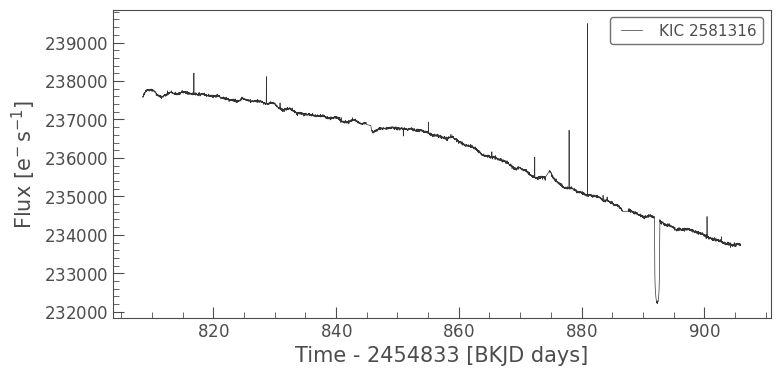

In [ ]:
from lightkurve import search_targetpixelfile

# First we open a Target Pixel File from MAST, this one is already cached from our previous tutorial!
tpf = search_targetpixelfile('Kepler-1514', author="Kepler", cadence="long", quarter=9).download()

# Then we convert the target pixel file into a light curve using the pipeline-defined aperture mask.
lc = tpf.to_lightcurve(aperture_mask=tpf.pipeline_mask)

lc.plot()

In [ ]:
len(lc)

4618

<Axes: xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

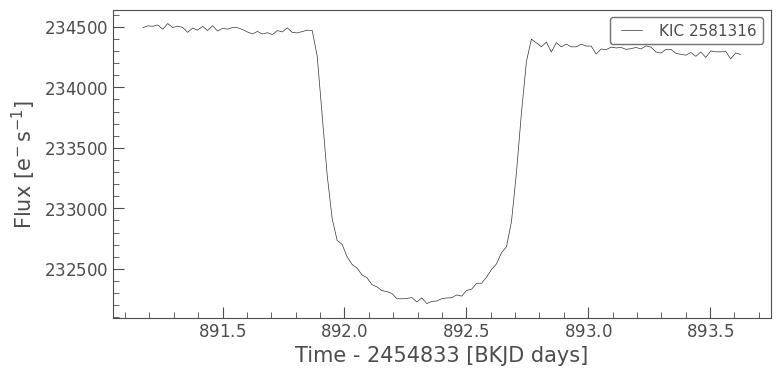

In [ ]:
# flat_lc = lc.flatten(window_length=401)
lc[3900:4020].plot()

In [ ]:
# Access time and flux data
t = lc.time.value
y = lc.flux.value

t = np.ascontiguousarray(t)
y = np.ascontiguousarray(y)
print(t, y)

[808.51548404 808.53591835 808.55635266 ... 905.88604599 905.90648022
 905.92691465] [237580.55 237604.02 237580.45 ... 233728.08 233728.33 233739.38]


In [ ]:
t = t[3900:4020]
y = y[3900:4020]

y = y / np.mean(y)

In [ ]:
# initial guess for parameters of Kepler-51 d
a1 = 184.47
t1 = 238.81
e1 = 0.04
p1 = 217.83
w1 = -75.28 * np.pi / 180
b1 = 0.169
i1 = np.arccos(b1 / a1)
r1 = 0.02

# initial guess for parameters of Kepler-51 b
a2 = 24.43
t2 = 124.06
e2 = 0.32
p2 = 10.51
w2 = 0.0 * np.pi / 180
om2 = 180 * np.pi / 180
b2 = 0.47
i2 = np.arccos(b2 / a2)
r2 = 0.0084

# initial guess for quadratic limb-darkening parameters
u1 = 0.6
u2 = 0.2

# build the system
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)

In [ ]:
# returns the likelihood and the jacobian of the likelihood
def fun_jac(args):
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args
    o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
    o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
    sys = gf.systems.ConfocalSystem(o1, o2)
    ll, dll = sys.loglike(y - 1, t, u1, u2, r1, r2, sigma, grad=True)
    return -ll, -dll

# get the initial light curve for comparison later
x0 = [0.0016, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2]
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc_start = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

CPU times: user 60.2 ms, sys: 0 ns, total: 60.2 ms
Wall time: 62 ms


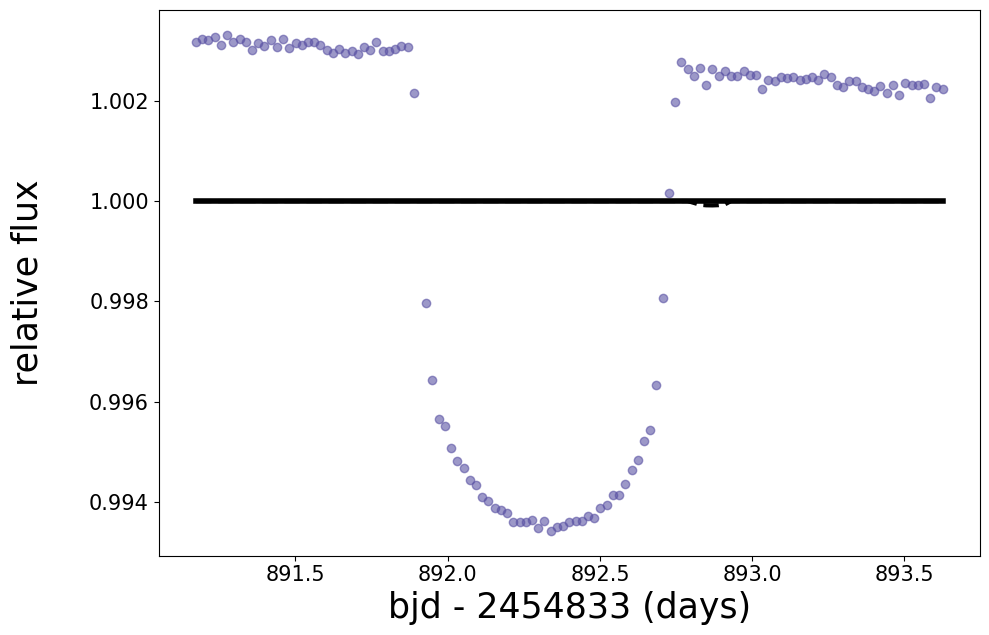

In [ ]:
# do the minimization
# I've found that the truncated newtonian (TNC) method works well with the gradient
# but if you're not using gradients then BFGS seems to work better in most cases
%time res = minimize(fun_jac, x0, jac=True, method='BFGS')

# get the minimized lightcurve
sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = res.x
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

# plot everything
plt.figure(figsize=(10, 7))
plt.plot(t, y, 'o', color=plt.cm.Spectral(0.99), alpha=0.6)
plt.plot(t, lc + 1, color='k', linewidth=4)
plt.plot(t, lc_start + 1, '--', color='k', linewidth=3)

plt.ylabel('relative flux\n', fontsize=25)
plt.xlabel('bjd - 2454833 (days)', fontsize=25)
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);
plt.tight_layout()
plt.subplots_adjust(top=0.9)

In [ ]:
import numpy as np
import emcee
import corner

# Define the log likelihood function
def log_likelihood(args):
    # Unpack the parameters
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args

    # Define the orbits and system
    o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
    o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
    sys = gf.systems.ConfocalSystem(o1, o2)

    # Compute the log likelihood
    return sys.loglike(y - 1, t, u1, u2, r1, r2, sigma)

# Define the log prior function
def log_prior(args):
    # Unpack the parameters
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args

    # Define prior ranges for parameters
    sigma_range = (0, 0.01)  # Example range for sigma
    a1_range = (100, 150)  # Example range for a1
    # Define ranges for other parameters as needed

    # Check if parameters are within the prior ranges
    if not all([sigma_range[0] < sigma < sigma_range[1], a1_range[0] < a1 < a1_range[1]]):
        return -np.inf  # Return negative infinity for parameters outside prior ranges

    # Add prior checks for other parameters as needed

    return 0  # Return zero for parameters within prior ranges

# Define the log posterior function
def log_posterior(args):
    lp = log_prior(args)
    if not np.isfinite(lp):
        return -np.inf  # Return negative infinity if parameters are outside prior ranges
    return lp + log_likelihood(args)  # Compute log posterior as sum of log prior and log likelihood

# Set up the MCMC sampler with more walkers
ndim = len(x0)  # Dimensionality of parameter space
nwalkers = 4 * ndim  # Number of walkers increased
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior)

# Run the sampler
initial_pos = [x0 + 1e-4 * np.random.randn(ndim) for _ in range(nwalkers)]  # Initialize walkers near initial guess
sampler.run_mcmc(initial_pos, 1000, progress=True)  # Run MCMC for 1000 steps

# Plot the posterior using corner
samples = sampler.get_chain(flat=True)
labels=['sigma', 'a1', 't1', 'e1', 'p1', 'w1', 'i1', 'a2', 't2', 'e2', 'p2', 'om2', 'w2', 'i2', 'r1', 'r2', 'u1', 'u2']
corner.corner(samples, labels=labels, truths=res.x)  # Use the truths argument to mark the refined values

# Extract the refined values from the posterior
refined_values = np.median(samples, axis=0)  # Median of the posterior distribution

# Extract the refined values of the parameters
sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = refined_values

# Plot the refined light curve
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

plt.figure(figsize=(10, 7))
plt.plot(t, y, 'o', color=plt.cm.Spectral(0.99), alpha=0.6)
plt.plot(t, lc + 1, color='k', linewidth=4)

plt.ylabel('relative flux\n', fontsize=25)
plt.xlabel('bjd - 2454833 (days)', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.subplots_adjust(top=0.9)

In [ ]:
# load Kepler data for the double transit
t, y = np.loadtxt('k51.txt').T
# arrays need to be fortran-contiguous, a
# characteristic which isn't preserved when
# we transpose the numpy array
t = np.ascontiguousarray(t)
y = np.ascontiguousarray(y)

In [ ]:
# initial guess for parameters of Kepler-51 d
a1 = 124.7
t1 = 16.56
e1 = 0.00001
p1 = 130.194
w1 = 90.0 * np.pi / 180
b1 = 0.05
i1 = np.arccos(b1 / a1)
r1 = 0.1

# initial guess for parameters of Kepler-51 b
a2 = 61.5
t2 = 12.41
e2 = 0.00001
p2 = 45.154
w2 = 0.1 * np.pi / 180
om2 = 160 * np.pi / 180
b2 = 0.0
i2 = np.arccos(b2 / a2)
r2 = 0.07

# initial guess for quadratic limb-darkening parameters
u1 = 0.6
u2 = 0.2

# build the system
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)

In [ ]:
# returns the likelihood and the jacobian of the likelihood
def fun_jac(args):
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args
    o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
    o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
    sys = gf.systems.ConfocalSystem(o1, o2)
    ll, dll = sys.loglike(y - 1, t, u1, u2, r1, r2, sigma, grad=True)
    return -ll, -dll

# get the initial light curve for comparison later
x0 = [0.0016, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2]
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc_start = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

CPU times: user 213 ms, sys: 0 ns, total: 213 ms
Wall time: 214 ms


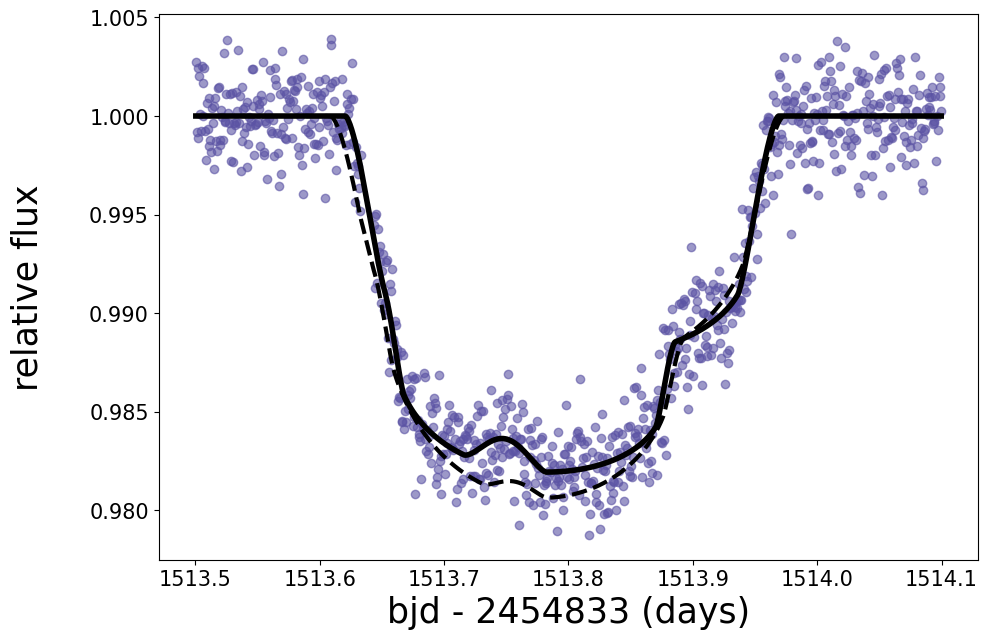

In [ ]:
# do the minimization
# I've found that the truncated newtonian (TNC) method works well with the gradient
# but if you're not using gradients then BFGS seems to work better in most cases
%time res = minimize(fun_jac, x0, jac=True, method='TNC')

# get the minimized lightcurve
sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = res.x
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

# plot everything
plt.figure(figsize=(10, 7))
plt.plot(t, y, 'o', color=plt.cm.Spectral(0.99), alpha=0.6)
plt.plot(t, lc + 1, color='k', linewidth=4)
plt.plot(t, lc_start + 1, '--', color='k', linewidth=3)

plt.ylabel('relative flux\n', fontsize=25)
plt.xlabel('bjd - 2454833 (days)', fontsize=25)
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);
plt.tight_layout()
plt.subplots_adjust(top=0.9)

100%|██████████| 1000/1000 [00:52<00:00, 19.03it/s]


[ 1.61367403e-03  1.24698397e+02  1.65578984e+01 -1.09432891e-03
  1.30194236e+02  1.57078409e+00  1.56876500e+00  6.15012524e+01
  1.24041473e+01 -4.49131832e-03  4.51546169e+01  2.80479397e+00
  7.33293397e-03  1.56724012e+00  1.01975151e-01  6.63935287e-02
  5.72744935e-01  2.00137913e-01]


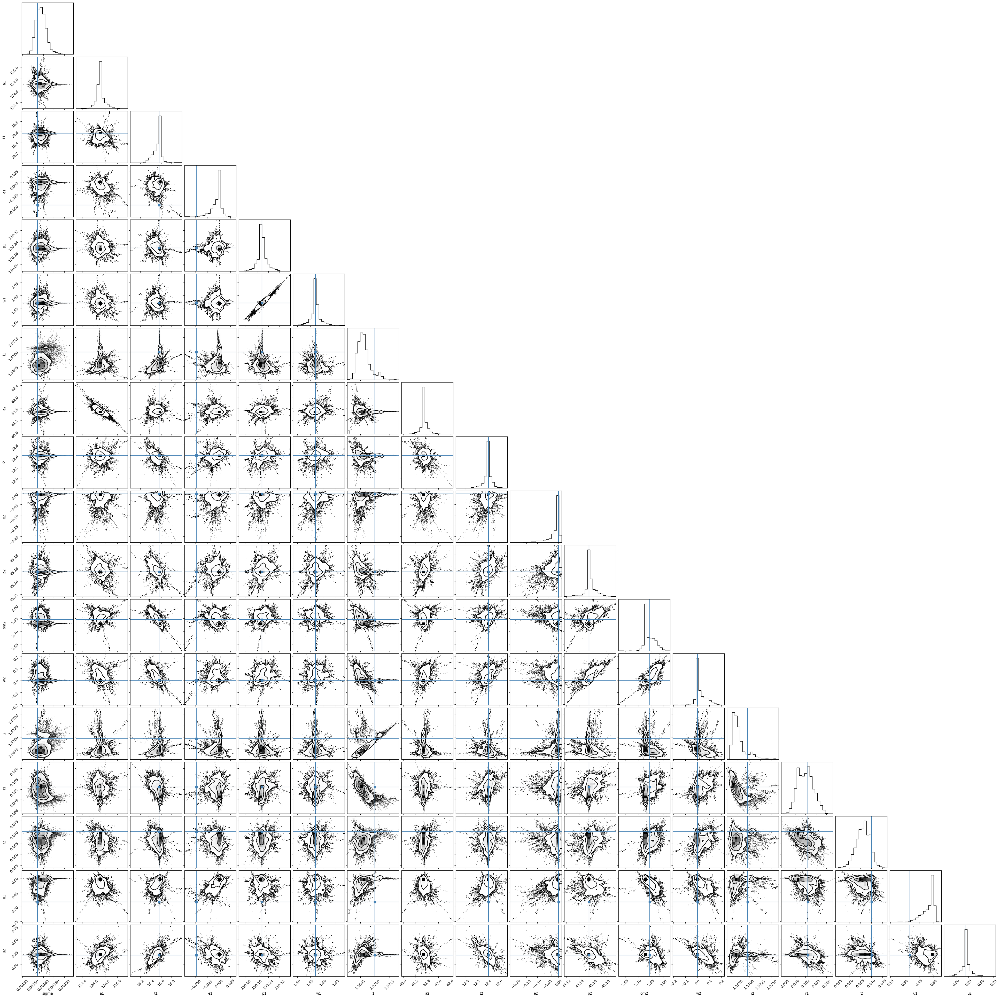

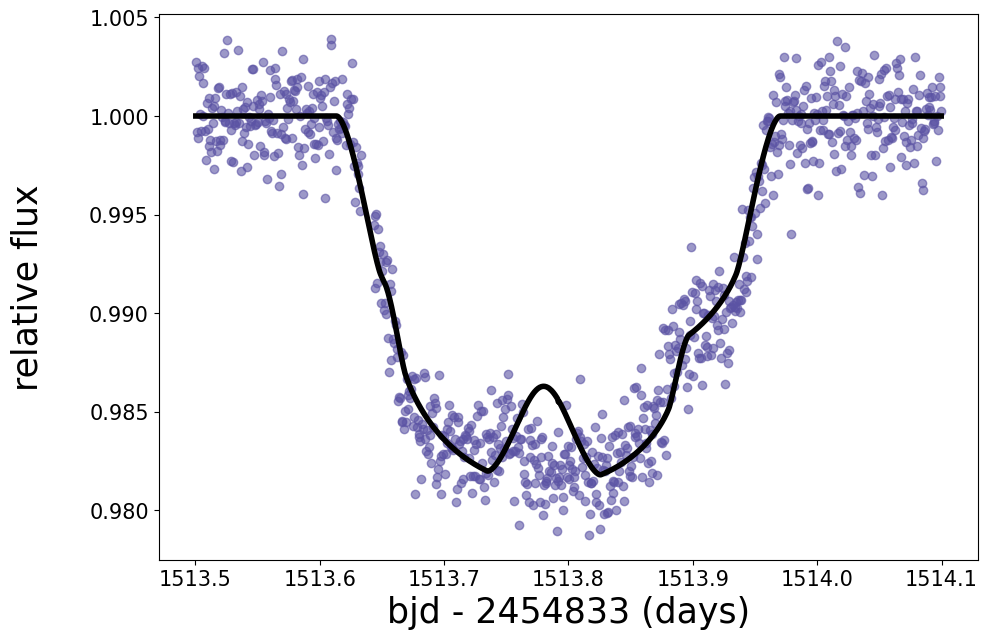

In [ ]:
import numpy as np
import emcee
import corner

# Define the log likelihood function
def log_likelihood(args):
    # Unpack the parameters
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args

    # Define the orbits and system
    o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
    o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
    sys = gf.systems.ConfocalSystem(o1, o2)

    # Compute the log likelihood
    return sys.loglike(y - 1, t, u1, u2, r1, r2, sigma)

# Define the log prior function
def log_prior(args):
    # Unpack the parameters
    sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = args

    # Define prior ranges for parameters
    sigma_range = (0, 0.01)  # Example range for sigma
    a1_range = (100, 150)  # Example range for a1
    # Define ranges for other parameters as needed

    # Check if parameters are within the prior ranges
    if not all([sigma_range[0] < sigma < sigma_range[1], a1_range[0] < a1 < a1_range[1]]):
        return -np.inf  # Return negative infinity for parameters outside prior ranges

    # Add prior checks for other parameters as needed

    return 0  # Return zero for parameters within prior ranges

# Define the log posterior function
def log_posterior(args):
    lp = log_prior(args)
    if not np.isfinite(lp):
        return -np.inf  # Return negative infinity if parameters are outside prior ranges
    return lp + log_likelihood(args)  # Compute log posterior as sum of log prior and log likelihood

# Set up the MCMC sampler with more walkers
ndim = len(x0)  # Dimensionality of parameter space
nwalkers = 4 * ndim  # Number of walkers increased
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior)

# Run the sampler
initial_pos = [x0 + 1e-4 * np.random.randn(ndim) for _ in range(nwalkers)]  # Initialize walkers near initial guess
sampler.run_mcmc(initial_pos, 1000, progress=True)  # Run MCMC for 1000 steps

# Plot the posterior using corner
samples = sampler.get_chain(flat=True)
labels=['sigma', 'a1', 't1', 'e1', 'p1', 'w1', 'i1', 'a2', 't2', 'e2', 'p2', 'om2', 'w2', 'i2', 'r1', 'r2', 'u1', 'u2']
corner.corner(samples, labels=labels, truths=res.x)  # Use the truths argument to mark the refined values

# Extract the refined values from the posterior
refined_values = np.median(samples, axis=0)  # Median of the posterior distribution

# Extract the refined values of the parameters
sigma, a1, t1, e1, p1, w1, i1, a2, t2, e2, p2, om2, w2, i2, r1, r2, u1, u2 = refined_values

# Plot the refined light curve
o1 = gf.orbits.PrimaryOrbit(a1, t1, e1, p1, w1, i1)
o2 = gf.orbits.ConfocalOrbit(a2, t2, e2, p2, om2, w2, i2)
sys = gf.systems.ConfocalSystem(o1, o2)
lc = sys.lightcurve(t, u1, u2, r1, r2, grad=False)

print(refined_values)

plt.figure(figsize=(10, 7))
plt.plot(t, y, 'o', color=plt.cm.Spectral(0.99), alpha=0.6)
plt.plot(t, lc + 1, color='k', linewidth=4)

plt.ylabel('relative flux\n', fontsize=25)
plt.xlabel('bjd - 2454833 (days)', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.subplots_adjust(top=0.9)

In [ ]:
%%capture
from IPython.display import HTML
fig = plt.figure(figsize=(10, 10))

ani = gf.animate.animate(
    sys,
    fig,
    t[::10],
    r1,
    r2,
    ld_params=(u1, u2)
)

In [ ]:
HTML(ani.to_html5_video())

In [ ]:
depth1 = sys.lightcurve(t, u1, u2, r1, 0, grad=False)  # Transit depth for planet 1
depth2 = sys.lightcurve(t, u1, u2, 0, r2, grad=False)  # Transit depth for planet 2

In [ ]:
def find_zeros(arr, index):
    left_indices = []
    right_indices = []

    # Search for the first zero on the left side
    for i in range(index, -1, -1):
        if arr[i] == 0:
            left_indices.append(i)
            break

    # Search for the first zero on the right side
    for i in range(index, len(arr)):
        if arr[i] == 0:
            right_indices.append(i)
            break

    return left_indices, right_indices

# Test the function
arr = depth1 + depth2
index = np.argmin(arr)

left_indices, right_indices = find_zeros(arr, index)

# Print the left and right indices for each minimum value
for left, right in zip(left_indices, right_indices):
    print("Left index:", left)
    print("Right index:", right)
    print(arr[left:right + 1])

    num = int(0.2 * len(arr[left:right + 1]))
    print("Number of elements to select:", num)

    lc = arr[(left - num):(right + 1 + num)]
    print("Selected portion of array:", lc)
    print()

Left index: 166
Right index: 677
[ 0.00000000e+00 -1.32589871e-05 -4.33449579e-05 -8.57694608e-05
 -1.38995196e-04 -2.02059680e-04 -2.74278346e-04 -3.55077267e-04
 -4.44015942e-04 -5.40663331e-04 -6.44668713e-04 -7.55682568e-04
 -8.73445448e-04 -9.97614587e-04 -1.12792787e-03 -1.26413734e-03
 -1.40594271e-03 -1.55313151e-03 -1.70541112e-03 -1.86258014e-03
 -2.02430044e-03 -2.19047182e-03 -2.36075629e-03 -2.53496084e-03
 -2.71278997e-03 -2.89402249e-03 -3.07843629e-03 -3.26572394e-03
 -3.45562654e-03 -3.64796511e-03 -6.60751202e-03 -6.79173584e-03
 -6.97112202e-03 -7.14460072e-03 -7.31094284e-03 -7.46844464e-03
 -7.61428605e-03 -7.74066071e-03 -7.84852216e-03 -7.95049095e-03
 -8.04788362e-03 -8.14140614e-03 -8.23151317e-03 -8.31859088e-03
 -8.40289672e-03 -8.48467428e-03 -8.56412789e-03 -8.64138726e-03
 -8.71662902e-03 -8.78996608e-03 -8.86151884e-03 -8.93136443e-03
 -8.99961155e-03 -9.06631985e-03 -9.13157191e-03 -9.19542460e-03
 -9.25796644e-03 -9.31922549e-03 -9.37926265e-03 -9.43813

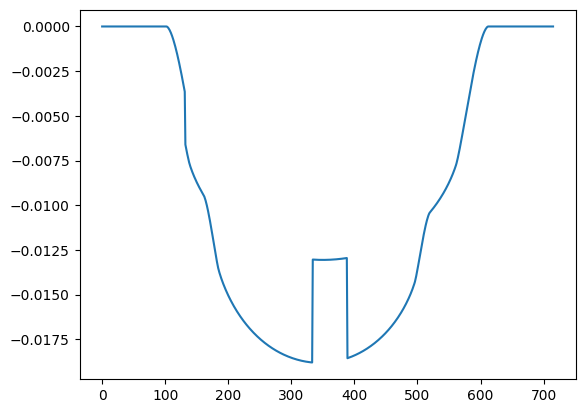

In [ ]:
plt.plot(lc)

## OOP by Defining Classes

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import gefera as gf

# class MultiPlanetSystem:
#     def __init__(self, num_planets):
#         self.num_planets = num_planets
#         self.default_values = {
#             'a': 1.0,  # Default semi-major axis
#             't': 0.0,  # Default time of transit
#             'e': 0.00001,  # Default eccentricity
#             'p': 5.0,  # Default orbital period
#             'w': 0.0,  # Default argument of periastron
#             'om': 0.0, # Default longitude of ascending node
#             'b': 0.0,  # Default impact parameter
#             'i': 0.0,  # Default inclination
#             'u1': 0.2, # Default limb darkening coefficient 1
#             'u2': 0.2  # Default limb darkening coefficient 2
#         }
#         self.planets = []
#         self.orbits = []
#         for i in range(1, num_planets + 1):
#             self.default_values[f'r{i}'] = 0.0  # Default radius ratio for each planet

#     def add_planet(self, **kwargs):
#         # Fill missing values with default values
#         planet_params = {**self.default_values, **kwargs}
#         for i in range(1, self.num_planets + 1):
#             r_key = f"r{i}"
#             if r_key not in planet_params:
#                 raise ValueError(f"Parameter '{r_key}' missing for planet {i}.")
#         self.planets.append(planet_params)

#     def initialize_orbits(self):
#         # Check if there are enough planets to initialize orbits
#         if len(self.planets) < 2:
#             raise ValueError("At least two planets are required to initialize orbits.")

#         # Initialize the primary orbit separately
#         primary_params = self.planets[0]
#         primary_orbit = gf.orbits.PrimaryOrbit(primary_params['a'], primary_params['t'], primary_params['e'], primary_params['p'], primary_params['w'], primary_params['i'])
#         self.orbits.append(primary_orbit)

#         # Initialize the secondary orbits using the parameters of the remaining planets
#         for planet_params in self.planets[1:]:
#             secondary_orbit = gf.orbits.ConfocalOrbit(planet_params['a'], planet_params['t'], planet_params['e'], planet_params['p'], planet_params['om'], planet_params['w'], planet_params['i'])
#             self.orbits.append(secondary_orbit)

#         # Initialize the system with the primary and secondary orbits
#         self.system = gf.systems.ConfocalSystem(*self.orbits)

#     def simulate_lightcurve(self, t):
#         flux = np.zeros_like(t)  # Initialize flux array with zeros
#         for planet in self.planets:
#             val = []
#             for i in range(1, self.num_planets + 1):
#                 r_key = f"r{i}"
#                 r = planet.get(r_key)
#                 val.append(r)
#             u1 = planet['u1']
#             u2 = planet['u2']
#             val.append(u1)
#             val.append(u2)
#             val = [x for x in val if x != 0.0]
#             flux += self.system.lightcurve(t, *val, r2=0.0, grad=False)  # Added missing r2 argument
#         return flux

# # Example usage:
# num_planets = 2
# system = MultiPlanetSystem(num_planets)

# # Add planets with specified parameters
# system.add_planet(a=124.7, t=16.56, e=0.00001, p=130.194, w=90.0*np.pi/180, b=0.05, i=0.0, r1=0.1, u1=0.6, u2=0.2)
# system.add_planet(a=61.5, t=12.41, e=0.00001, p=45.154, w=0.1*np.pi/180, om=160*np.pi/180, r2=0.07, u1=0.6, u2=0.2)

# # Initialize orbits and system
# system.initialize_orbits()

# # Generate time array
# t = np.linspace(1750, 1800, 10000)

# # Simulate the light curve
# flux = system.simulate_lightcurve(t)

# # Plot the simulated light curve
# plt.figure(figsize=(15, 7))
# plt.plot(t, flux, color='k', linewidth=4)
# plt.ylabel('Relative flux', fontsize=25)
# plt.xlabel('bjd - 2454833 (days)', fontsize=25)
# plt.xticks(fontsize=15)
# plt.yticks(fontsize=15)
# plt.tight_layout()
# plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import gefera as gf

class MultiPlanetSystem:
    def __init__(self):
        self.planets = []
        self.orbits = None
        self.system = None
        self.default_values = {
            'a': 1.0,  # Default semi-major axis
            't': 0.0,  # Default time of transit
            'e': 0.00001,  # Default eccentricity
            'p': 5.0,  # Default orbital period
            'w': 90.0,  # Default argument of periastron
            'om': 0.0, # Default longitude of ascending node
            'b': 0.0,  # Default impact parameter
            'i': 0.0,  # Default inclination
            'u1': 0.2, # Default limb darkening coefficient 1
            'u2': 0.2,  # Default limb darkening coefficient 2
            'r': 0.01  # Default radius ratio
        }

    def add_planet(self, a=None, t=None, e=None, p=None, w=None, om=None, b=None, u1=None, u2=None, r=None):
        planet_params = {
            'a': a if a is not None else self.default_values['a'],
            't': t if t is not None else self.default_values['t'],
            'e': e if e is not None else self.default_values['e'],
            'p': p if p is not None else self.default_values['p'],
            'w': w if w is not None else self.default_values['w'],
            'om': om if om is not None else self.default_values['om'],
            'b': b if b is not None else self.default_values['b'],
            'u1': u1 if u1 is not None else self.default_values['u1'],
            'u2': u2 if u2 is not None else self.default_values['u2'],
            'r': r if r is not None else self.default_values['r']
        }
        self.planets.append(planet_params)

    def initialize_orbits(self):
        if len(self.planets) < 2:
            raise ValueError("At least two planets are required to initialize orbits.")

        primary_params = self.planets[0]
        o1 = gf.orbits.PrimaryOrbit(primary_params['a'], primary_params['t'], primary_params['e'], primary_params['p'], primary_params['w'], np.arccos(primary_params['b'] / primary_params['a']))
        self.orbits = [o1]
        for planet_params in self.planets[1:]:
            o2 = gf.orbits.ConfocalOrbit(planet_params['a'], planet_params['t'], planet_params['e'], planet_params['p'], planet_params['om'], planet_params['w'], np.arccos(planet_params['b'] / planet_params['a']))
            self.orbits.append(o2)
        self.system = gf.systems.ConfocalSystem(*self.orbits)

    def simulate_lightcurve(self, t):
        flux = np.zeros_like(t)
        for i, planet_params in enumerate(self.planets):
            u1 = planet_params['u1']
            u2 = planet_params['u2']
            r = planet_params['r']
            flux += self.system.lightcurve(t, u1, u2, r, 0.0 if i == 0 else self.planets[i-1]['r'], grad=False)
        return flux

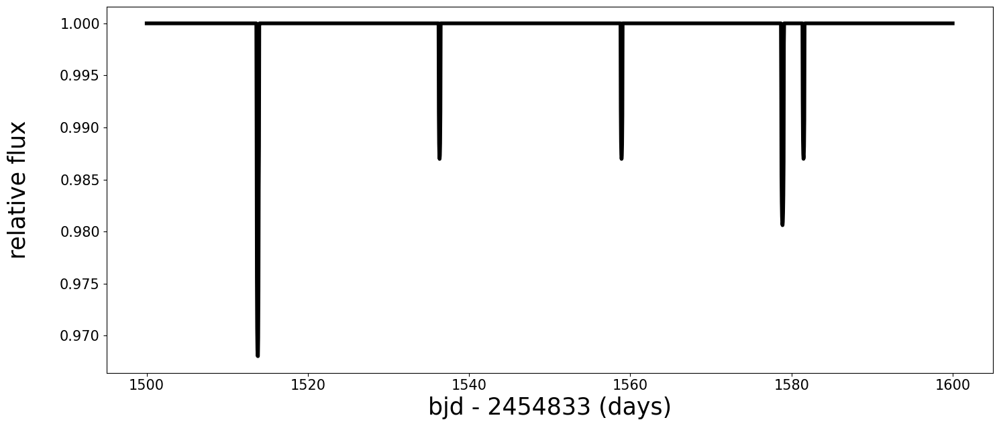

In [ ]:
# Define the parameters
t = np.linspace(1500, 1600, 3000)

a1 = 124.7
t1 = 16.56
e1 = 0.00001
p1 = 130.194
w1 = 90.0 * np.pi / 180
b1 = 0.05
r1 = 0.1

a2 = 61.5
t2 = 12.41
e2 = 0.00001
p2 = 45.154
w2 = 0.1 * np.pi / 180
om2 = 160 * np.pi / 180
b2 = 0.0
r2 = 0.07

u1 = 0.6
u2 = 0.2

# Initialize the MultiPlanetSystem
system = MultiPlanetSystem()

# Add planets with specified parameters
system.add_planet(a1, t1, e1, p1, w1, om2, b1, u1, u2, r1)
system.add_planet(a2, t2, e2, p2, w2, om2, b2, u1, u2, r2)

# Initialize orbits and system
system.initialize_orbits()

# Simulate the light curve
flux = system.simulate_lightcurve(t)

# Plot the simulated light curve
plt.figure(figsize=(15, 7))
plt.plot(t, flux + 1, color='k', linewidth=4)

plt.ylabel('relative flux\n', fontsize=25)
plt.xlabel('bjd - 2454833 (days)', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# New section

In [ ]:
f = open("/content/PS_2024.04.25_12.55.45.csv")
f= f.readlines(0)
# print(f)

In [ ]:
f = f[147:]

In [ ]:
list_all=[]
for i in f:
    list_all.append(i.split("\n"))

#print(list_all,end="\n\n\n\n")
word=[]
for i in list_all:
    for j in i:
        #print(j,"\n\n")
        s = j.split(",")
        #print(s)
        break
    word.append(s)

print(word[1])

['AU Mic b', 'AU Mic', '1', '1', '3', 'Transit', '2020', 'Transiting Exoplanet Survey Satellite (TESS)', 'Published Confirmed', '0', '<a refstr=CALE_ET_AL__2021 href=https://ui.adsabs.harvard.edu/abs/2021AJ....162..295C/abstract target=ref>Cale et al. 2021</a>', '8.4629991', '', '', '0', '0.0645', '0.0013', '-0.0013', '0', '', '', '', '', '', '', '', '', '20.12', '1.57', '-1.72', '0', '20.12', '1.57', '-1.72', '0', '0.0633', '0.00494', '-0.00541', '0', 'Mass', '0.186', '0.036', '-0.035', '0', '', '', '', '', '', '', '', '', '', '', '', '', '2458330.39', '', '', '0', '1', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '88.528', '0.218', '-0.218', '0', '', '', '', '', '<a refstr=CALE_ET_AL__2021 href=https://ui.adsabs.harvard.edu/abs/2021AJ....162..295C/abstract target=ref>Cale et al. 2021</a>', '', '', '', '', '', '', '', '', '', '0.5', '0.03', '-0.03', '0', '', '', '', '', '', '', '', '', '', '<a refstr=STASSUN_ET_AL__2019 href=https://u

In [ ]:
def find_partial_string_in_array(arr, target):
    indices = []
    for i, row in enumerate(arr):
        for j, item in enumerate(row):
            if target in item:  # Check if target is a substring of the current item
                indices.append([i, j])  # Append the index of the row containing the target string
    return indices

In [ ]:
x= find_partial_string_in_array(word,"Kepler-51")

print(x)
for i in x:
    print(word[i[0]][i[1]])

[[1339, 0], [1339, 1], [1340, 0], [1340, 1], [1341, 0], [1341, 1], [1342, 0], [1342, 1], [1343, 0], [1343, 1]]
Kepler-51 b
Kepler-51
Kepler-51 c
Kepler-51
Kepler-51 d
Kepler-51
Kepler-511 b
Kepler-511
Kepler-511 c
Kepler-511


In [ ]:
hostname=[]
orb_per=[]
for i in word:
    #print(i[1])
    if i[1] not in hostname:
        hostname.append(i[1])
    else:
        pass

    if i[13] not in hostname:
        orb_per.append(i[13])
    else:
        pass

orb_per=orb_per[1:]

In [ ]:
exo_plnt_all=[]
hostname = hostname[1:]
for i in hostname:

    #print(i)
    x= find_partial_string_in_array(word,i)

    #print(x)
    exo_plnt_list=[]
    for j in x:
        exo_plnt_list.append(word[j[0]][j[1]])
    exo_plnt_all.append(exo_plnt_list)

print(hostname)

['AU Mic', 'CoRoT-20', 'CoRoT-24', 'CoRoT-7', 'K2-166', 'K2-16', 'K2-50', 'K2-168', 'EPIC 206024342', 'EPIC 206042996', 'EPIC 206317286', 'EPIC 212297394', 'EPIC 212587672', 'EPIC 212624936', 'EPIC 212737443', 'K2-282', 'EPIC 220674823', 'EPIC 249893012', 'GJ 1132', 'GJ 143', 'GJ 357', 'GJ 367', 'GJ 3929', 'GJ 806', 'GJ 9827', 'HAT-P-11', 'HAT-P-13', 'HAT-P-17', 'HAT-P-2', 'HAT-P-44', 'HATS-59', 'HD 106315', 'HD 108236', 'HD 109833', 'HD 110113', 'HD 137496', 'HD 152843', 'HD 15337', 'HD 15906', 'HD 191939', 'HD 213885', 'HD 22946', 'HD 23472', 'HD 260655', 'HD 28109', 'HD 3167', 'HD 5278', 'HD 63433', 'HD 63935', 'HD 73583', 'HD 80653', 'HD 86226', 'HIP 113103', 'HIP 29442', 'HIP 41378', 'HIP 9618', 'HIP 97166', 'K2-111', 'K2-117', 'K2-133', 'K2-138', 'K2-141', 'K2-146', 'K2-154', 'K2-155', 'K2-158', 'K2-165', 'K2-170', 'K2-172', 'K2-18', 'K2-183', 'K2-185', 'K2-187', 'K2-188', 'K2-189', 'K2-19', 'K2-190', 'K2-195', 'K2-198', 'K2-199', 'K2-201', 'K2-21', 'K2-219', 'K2-223', 'K2-224', 

In [ ]:
planet={}
for key,value in zip(hostname, exo_plnt_all):
    if value not in planet.values():
        planet[key] = value
    else:
        pass
print(planet)

{'AU Mic': ['AU Mic b', 'AU Mic', 'AU Mic c', 'AU Mic', 'AU Mic d', 'AU Mic'], 'CoRoT-20': ['CoRoT-20 b', 'CoRoT-20'], 'CoRoT-24': ['CoRoT-24 b', 'CoRoT-24', 'CoRoT-24 c', 'CoRoT-24'], 'CoRoT-7': ['CoRoT-7 b', 'CoRoT-7'], 'K2-166': ['K2-166', 'K2-166 b', 'K2-166'], 'K2-16': ['K2-166', 'K2-16', 'K2-168', 'K2-16 b', 'K2-16', 'K2-16 c', 'K2-16', 'K2-165 b', 'K2-165', 'K2-165 c', 'K2-165', 'K2-165 d', 'K2-165', 'K2-166 b', 'K2-166', 'K2-168 b', 'K2-168'], 'K2-50': ['K2-50', 'K2-50 b', 'K2-50'], 'K2-168': ['K2-168', 'K2-168 b', 'K2-168'], 'EPIC 206024342': ['EPIC 206024342 b', 'EPIC 206024342', 'EPIC 206024342 c', 'EPIC 206024342', 'EPIC 206024342 d', 'EPIC 206024342'], 'EPIC 206042996': ['EPIC 206042996 b', 'EPIC 206042996', 'EPIC 206042996 c', 'EPIC 206042996'], 'EPIC 206317286': ['EPIC 206317286 b', 'EPIC 206317286', 'EPIC 206317286 c', 'EPIC 206317286'], 'EPIC 212297394': ['EPIC 212297394 b', 'EPIC 212297394', 'EPIC 212297394 c', 'EPIC 212297394'], 'EPIC 212587672': ['EPIC 212587672 b',

In [ ]:
for i in hostname:
    value_to_check = i

    # Iterate over each key-value pair in the dictionary
    for key, value_list in planet.items():
        # Iterate over each item in the list associated with the current key
        for item in value_list:
            # Check if the value exists in the current item
            if item == value_to_check:
                value_list.remove(item)
        planet[key] = value_list
print(planet)

{'AU Mic': ['AU Mic b', 'AU Mic c', 'AU Mic d'], 'CoRoT-20': ['CoRoT-20 b'], 'CoRoT-24': ['CoRoT-24 b', 'CoRoT-24 c'], 'CoRoT-7': ['CoRoT-7 b'], 'K2-166': ['K2-166 b'], 'K2-16': ['K2-16 b', 'K2-16 c', 'K2-165 b', 'K2-165 c', 'K2-165 d', 'K2-166 b', 'K2-168 b'], 'K2-50': ['K2-50 b'], 'K2-168': ['K2-168 b'], 'EPIC 206024342': ['EPIC 206024342 b', 'EPIC 206024342 c', 'EPIC 206024342 d'], 'EPIC 206042996': ['EPIC 206042996 b', 'EPIC 206042996 c'], 'EPIC 206317286': ['EPIC 206317286 b', 'EPIC 206317286 c'], 'EPIC 212297394': ['EPIC 212297394 b', 'EPIC 212297394 c'], 'EPIC 212587672': ['EPIC 212587672 b', 'EPIC 212587672 c'], 'EPIC 212624936': ['EPIC 212624936 b', 'EPIC 212624936 c'], 'EPIC 212737443': ['EPIC 212737443 b', 'EPIC 212737443 c'], 'K2-282': ['K2-282 b'], 'EPIC 220674823': ['EPIC 220674823 b', 'EPIC 220674823 c'], 'EPIC 249893012': ['EPIC 249893012 b', 'EPIC 249893012 c', 'EPIC 249893012 d'], 'GJ 1132': ['GJ 1132 b'], 'GJ 143': ['GJ 143 b', 'GJ 143'], 'GJ 357': ['GJ 357 b'], 'GJ 

In [ ]:
p = planet

In [ ]:
import itertools

# Iterate over a copy of the dictionary because we'll modify it during iteration
for hostname, items in list(planet.items()):
    if len(items) == 1:  # If value list has a single element
        del planet[hostname]
    elif len(items) > 2:  # If value list has more than 2 elements, split into combinations of size 2
        combinations = list(itertools.combinations(items, 2))
        for comb in combinations:
            planet[f"{hostname} (Combination)"] = list(comb)
        del planet[hostname]

print(planet)

{'CoRoT-24': ['CoRoT-24 b', 'CoRoT-24 c'], 'EPIC 206042996': ['EPIC 206042996 b', 'EPIC 206042996 c'], 'EPIC 206317286': ['EPIC 206317286 b', 'EPIC 206317286 c'], 'EPIC 212297394': ['EPIC 212297394 b', 'EPIC 212297394 c'], 'EPIC 212587672': ['EPIC 212587672 b', 'EPIC 212587672 c'], 'EPIC 212624936': ['EPIC 212624936 b', 'EPIC 212624936 c'], 'EPIC 212737443': ['EPIC 212737443 b', 'EPIC 212737443 c'], 'EPIC 220674823': ['EPIC 220674823 b', 'EPIC 220674823 c'], 'GJ 143': ['GJ 143 b', 'GJ 143'], 'HD 106315': ['HD 106315 b', 'HD 106315 c'], 'HD 109833': ['HD 109833 b', 'HD 109833 c'], 'HD 152843': ['HD 152843 b', 'HD 152843 c'], 'HD 15337': ['HD 15337 b', 'HD 15337 c'], 'HD 15906': ['HD 15906 b', 'HD 15906 c'], 'HD 22946': ['HD 22946 d', 'HD 22946'], 'HD 260655': ['HD 260655 b', 'HD 260655 c'], 'HD 3167': ['HD 3167 b', 'HD 3167 c'], 'HD 73583': ['HD 73583 b', 'HD 73583 c'], 'HIP 113103': ['HIP 113103 b', 'HIP 113103 c'], 'HIP 9618': ['HIP 9618 b', 'HIP 9618 c'], 'K2-117': ['K2-117 b', 'K2-1

In [ ]:
# planet = p

In [ ]:
# for i in hostname:
#     value_to_check = i

#     # Iterate over each key-value pair in the dictionary
#     for key, value_list in planet.items():
#         # Iterate over each item in the list associated with the current key
#         for item in value_list:
#             # Check if the value exists in the current item
#             if item == value_to_check:
#                 value_list.remove(item)
#         planet[key] = value_list
# print(planet)

In [ ]:
# for key,value_list in planet.items():
#     #print(value_list)
#     value_list = [item for item in value_list if key == item.split(" ")[0]]
#     #print(value_list)
#     planet[key]=value_list

In [ ]:
orb_per=[]
for i in word:


    if i[13] not in hostname:
        orb_per.append(i[13])
    else:
        pass

In [ ]:
def find_orbital_period(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        return(word[x[0][0]][11])



  # Assuming 'orbital_period' is the column header for the orbital period

In [ ]:
type(float(find_orbital_period("/content/PS_2024.04.25_12.55.45.csv","Kepler-200 b")))

float

In [ ]:
def find_semi_major_axis(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][15]) >0:
            return(word[x[0][0]][15])
        else:
            return

In [ ]:
def find_eccentricity(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][40])>0:
            return(word[x[0][0]][40])
        else:
            #print("yes")
            return

In [ ]:
type(find_eccentricity("/content/PS_2024.04.25_12.55.45.csv","Kepler-170 b"))

NoneType

In [ ]:
def find_inclination(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][53])>0:
            return(word[x[0][0]][53])
        else:
            #print("yes")
            return

In [ ]:
def find_transit_time(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][69])>0:
            return(word[x[0][0]][69])
        else:
            #print("yes")
            return

In [ ]:
def find_impacter_parameter(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][61])>0:
            return(word[x[0][0]][61])
        else:
            #print("yes")
            return

In [ ]:
def find_longitude_periastron(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][85])>0:
            return(word[x[0][0]][85])
        else:
            #print("yes")
            return

In [ ]:
def find_radius_ratio(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][99]) and len(word[x[0][0]][19])>0:
            # print(len(word[x[0][0]][99]),len(word[x[0][0]][19]))
            return(float(word[x[0][0]][19])/float(word[x[0][0]][99])*0.00916794)
        else:
            #print("yes")
            return None

In [ ]:
def find_sr(csv_file, input_value):
    with open(csv_file, 'r') as file:
        file= file.readlines(0)
        file = file[147:]

        list_all=[]
        for i in f:
            list_all.append(i.split("\n"))

        #print(list_all,end="\n\n\n\n")
        word=[]
        for i in list_all:
            for j in i:
                #print(j,"\n\n")
                s = j.split(",")
                #print(s)
                break
            word.append(s)
        x= find_partial_string_in_array(word,input_value)
        #print(x[0][1])
        if len(word[x[0][0]][99])>0:
            return(word[x[0][0]][99])
        else:
            #print("yes")
            return

In [ ]:
find_longitude_periastron("/content/PS_2024.04.25_12.55.45.csv","AU Mic b")

'88.528'

In [ ]:
len(planet)

647

In [ ]:
import os

0.03944346279069768
13.71944 -2454830.15 0.0 5.1134 None 3.141592653589793 0.65 0.6 0.2 0.03944346279069768
0.05330197674418604
24.009020000000003 -2454828.2 0.0 11.759 None 3.141592653589793 0.3 0.6 0.2 0.05330197674418604
['CoRoT-24 b', 'CoRoT-24 c']


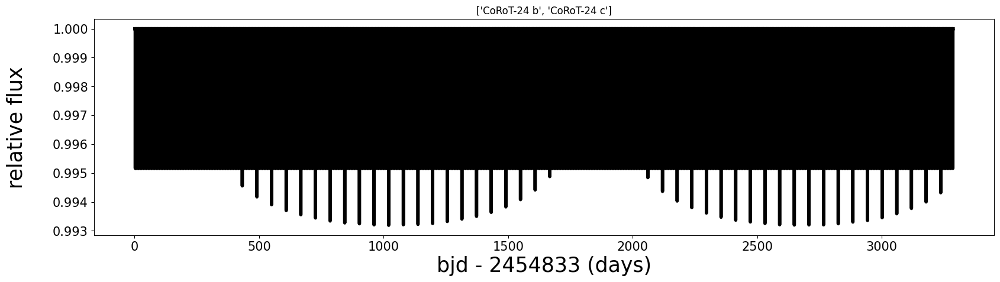

<Figure size 640x480 with 0 Axes>

0.031170995999999996
None None None 5.2986 None 3.141592653589793 None 0.6 0.2 0.031170995999999996
0.022003055999999997
None None None 0.354884 None 3.141592653589793 None 0.6 0.2 0.022003055999999997
['EPIC 206042996 b', 'EPIC 206042996 c']


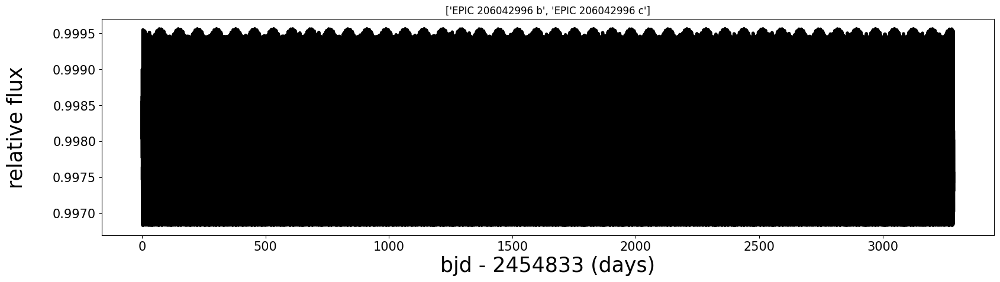

<Figure size 640x480 with 0 Axes>

None
None None None 1.58252 None 3.141592653589793 0.57 0.6 0.2 None
0.02526008731578947
None None None 17.515472 None 3.141592653589793 0.268 0.6 0.2 0.02526008731578947
['EPIC 206317286 b', 'EPIC 206317286 c']


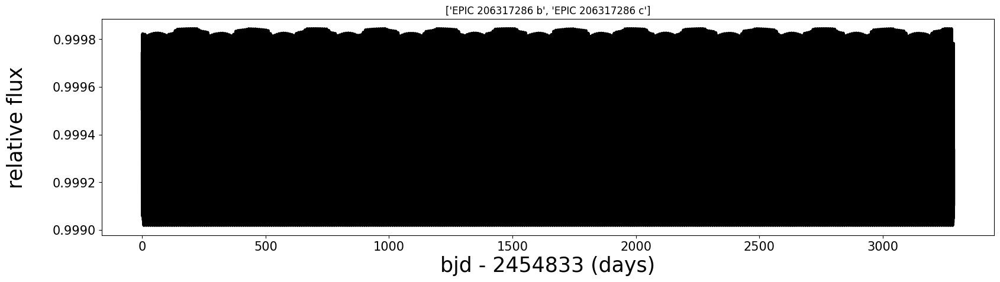

<Figure size 640x480 with 0 Axes>

0.016960688999999998
None -2454831.12 None 2.289363 None 3.141592653589793 0.41 0.6 0.2 0.016960688999999998
0.026014029749999997
None -2454830.38 None 5.213965 None 3.141592653589793 0.39 0.6 0.2 0.026014029749999997
['EPIC 212297394 b', 'EPIC 212297394 c']


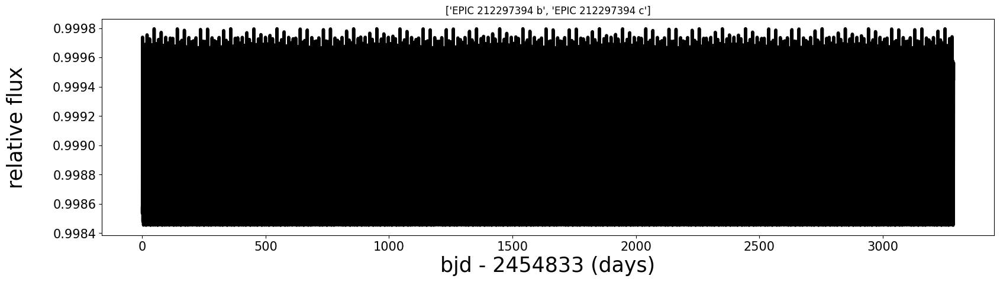

<Figure size 640x480 with 0 Axes>

0.011787351428571428
None -2454829.54 None 15.28078 None 3.141592653589793 0.43 0.6 0.2 0.011787351428571428
0.021703694693877548
None -2454829.75 None 23.228555 None 3.141592653589793 0.43 0.6 0.2 0.021703694693877548
['EPIC 212587672 b', 'EPIC 212587672 c']


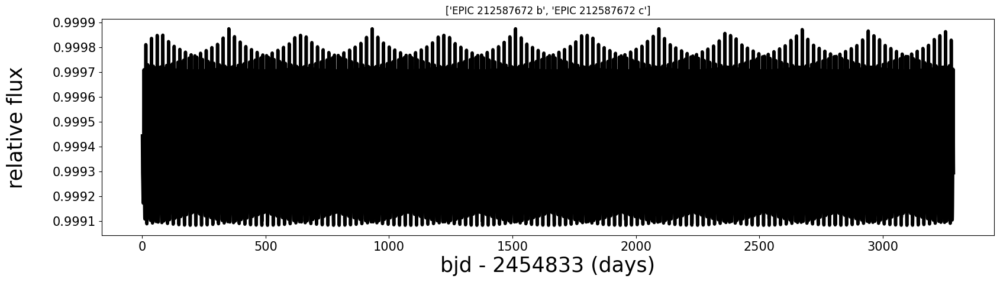

<Figure size 640x480 with 0 Axes>

0.0118296
None None None 0.578657 None 3.141592653589793 None 0.6 0.2 0.0118296
0.022673399999999996
None None None 11.811437 None 3.141592653589793 None 0.6 0.2 0.022673399999999996
['EPIC 212624936 b', 'EPIC 212624936 c']


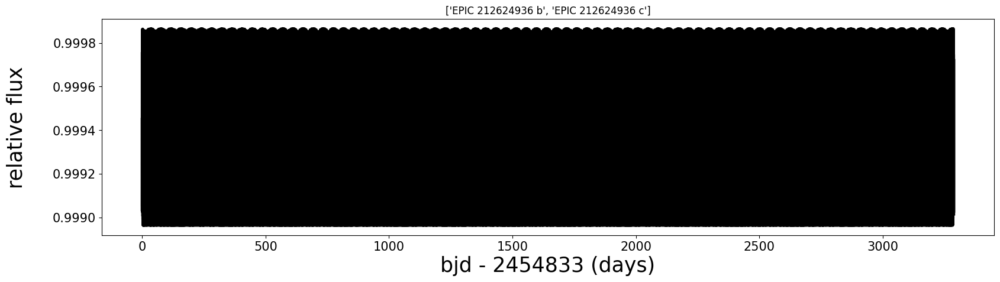

<Figure size 640x480 with 0 Axes>

0.03538551170149253
24.009020000000003 -2454830.024 0.2 13.603 None 3.141592653589793 0.479 0.6 0.2 0.03538551170149253
0.036808594925373125
68.59720000000002 -2454828.392 0.2 65.55 None 3.141592653589793 0.567 0.6 0.2 0.036808594925373125
['EPIC 212737443 b', 'EPIC 212737443 c']


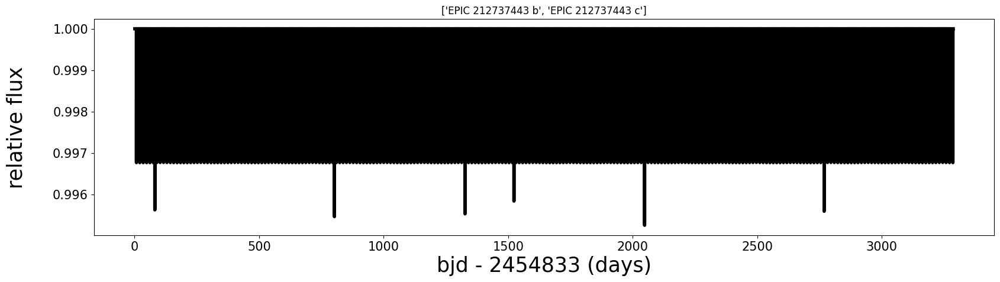

<Figure size 640x480 with 0 Axes>

0.01597444090909091
3.2485673999999998 None 0.0 0.571292 None 3.141592653589793 None 0.6 0.2 0.01597444090909091
0.026262906909090906
26.532417 None 0.13 13.3397 None 3.141592653589793 None 0.6 0.2 0.026262906909090906
['EPIC 220674823 b', 'EPIC 220674823 c']


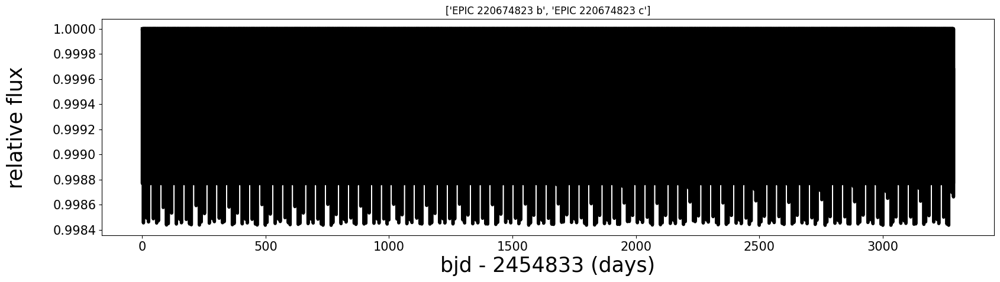

<Figure size 640x480 with 0 Axes>

0.034678729565217385
46.915585 -2454829.77 0.188 35.61253 98.0 3.141592653589793 0.587 0.6 0.2 0.034678729565217385
0.034678729565217385
46.915585 -2454829.77 0.188 35.61253 98.0 3.141592653589793 0.587 0.6 0.2 0.034678729565217385
['GJ 143 b', 'GJ 143']


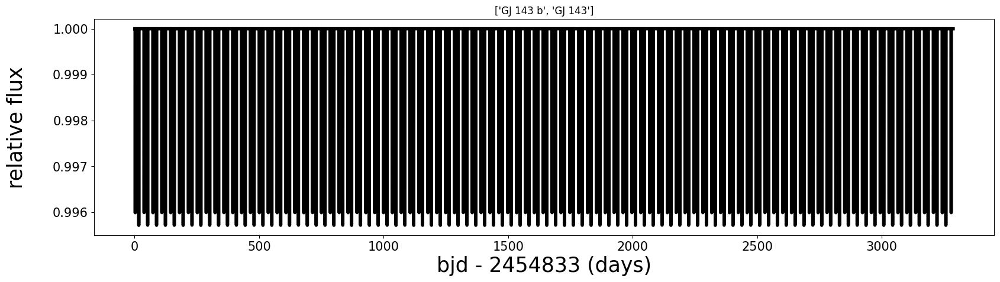

<Figure size 640x480 with 0 Axes>

0.017207518153846153
22.220593 -2454829.225 0.093 9.55237 239.0 3.141592653589793 0.67 0.6 0.2 0.017207518153846153
0.030677337692307686
37.630463999999996 -2454828.362 0.22 21.05704 96.0 3.141592653589793 0.52 0.6 0.2 0.030677337692307686
['HD 106315 b', 'HD 106315 c']


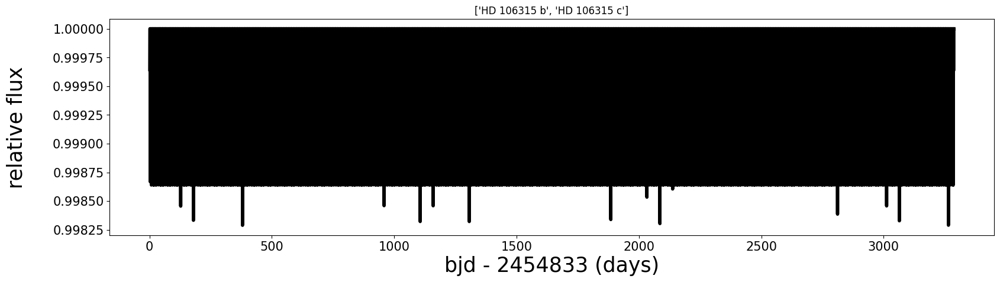

<Figure size 640x480 with 0 Axes>

0.026477010719999996
None None 0.18 9.188526 None 3.141592653589793 0.61 0.6 0.2 0.026477010719999996
0.023744964599999998
None None 0.3 13.900148 None 3.141592653589793 0.73 0.6 0.2 0.023744964599999998
['HD 109833 b', 'HD 109833 c']


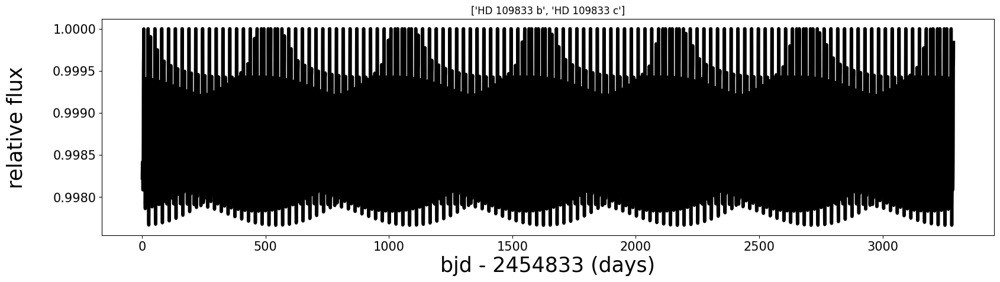

<Figure size 640x480 with 0 Axes>

0.02186201076923077
25.797447000000002 -2454827.47 0.14 11.6264 None 3.141592653589793 0.32 0.6 0.2 0.02186201076923077
0.03737698615384616
None -2454826.641 0.115 24.38 None 3.141592653589793 0.49 0.6 0.2 0.03737698615384616
['HD 152843 b', 'HD 152843 c']


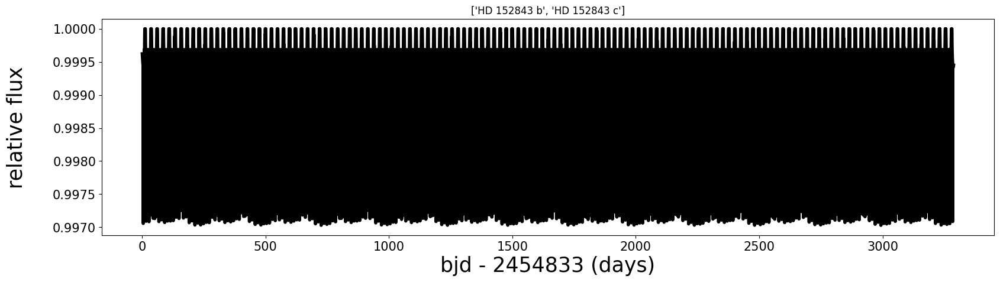

<Figure size 640x480 with 0 Axes>

0.01748304837209302
12.788478000000001 -2454830.51 0.09 4.75615 62.0 3.141592653589793 0.33 0.6 0.2 0.01748304837209302
0.02547834488372093
31.064732 -2454830.75 0.05 17.1784 329.0 3.141592653589793 0.87 0.6 0.2 0.02547834488372093
['HD 15337 b', 'HD 15337 c']


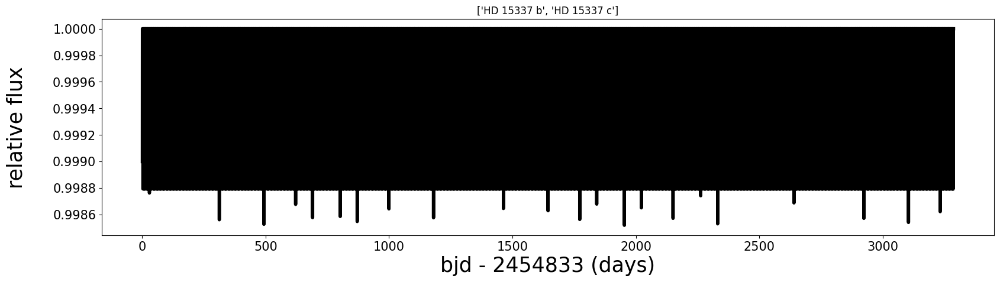

<Figure size 640x480 with 0 Axes>

0.027021296842105264
22.0491 -2454831.2 0.11 10.924709 160.5 3.141592653589793 0.86 0.6 0.2 0.027021296842105264
0.035344821315789476
34.543589999999995 -2454830.81 0.04 21.583298 247.9 3.141592653589793 0.9 0.6 0.2 0.035344821315789476
['HD 15906 b', 'HD 15906 c']


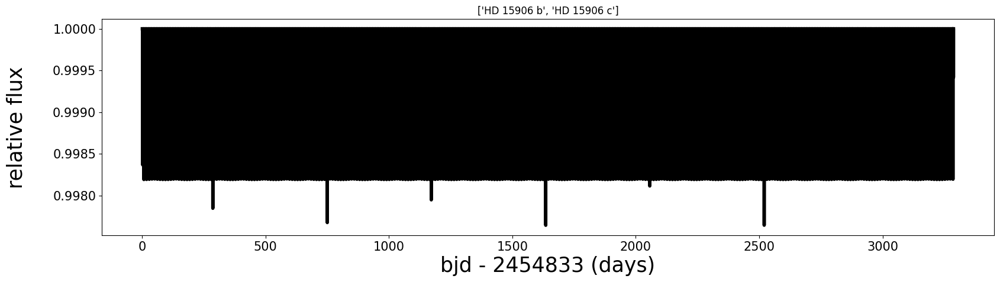

<Figure size 640x480 with 0 Axes>

0.021340017482142853
72.46804200000001 -2454826.518 None 47.42489 None 3.141592653589793 0.456 0.6 0.2 0.021340017482142853
0.021340017482142853
72.46804200000001 -2454826.518 None 47.42489 None 3.141592653589793 0.456 0.6 0.2 0.021340017482142853
['HD 22946 d', 'HD 22946']


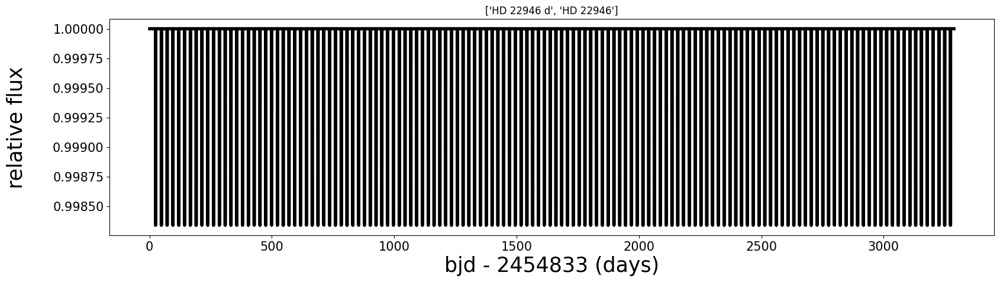

<Figure size 640x480 with 0 Axes>

0.02583692181818182
7.1855567 -2454831.85 0.039 2.76953 57.0 3.141592653589793 0.665 0.6 0.2 0.02583692181818182
0.031941936409090904
11.6345751 -2454832.02 0.038 5.70588 -25.0 3.141592653589793 0.89 0.6 0.2 0.031941936409090904
['HD 260655 b', 'HD 260655 c']


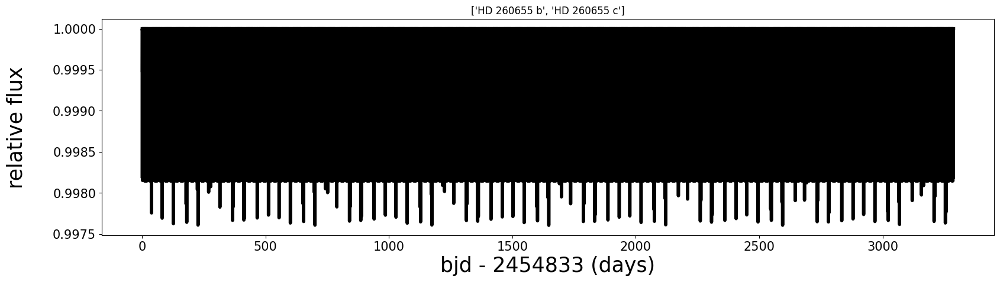

<Figure size 640x480 with 0 Axes>

0.017398249772727272
4.4000204 None 0.0 0.959641 None 3.141592653589793 None 0.6 0.2 0.017398249772727272
0.031254340909090905
43.510224 None 0.06 29.8454 None 3.141592653589793 None 0.6 0.2 0.031254340909090905
['HD 3167 b', 'HD 3167 c']


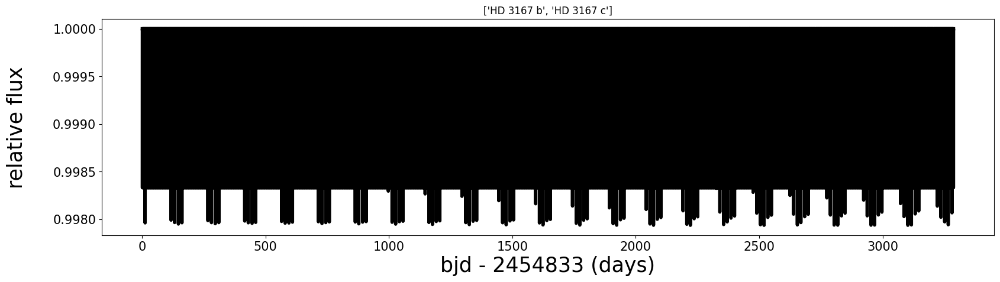

<Figure size 640x480 with 0 Axes>

0.03935161938461538
14.797396 -2454830.857 0.09 6.398042 -76.0 3.141592653589793 0.566 0.6 0.2 0.03935161938461538
0.03370981015384615
30.427758 -2454829.33 0.08 18.87974 -41.6 3.141592653589793 0.21 0.6 0.2 0.03370981015384615
['HD 73583 b', 'HD 73583 c']


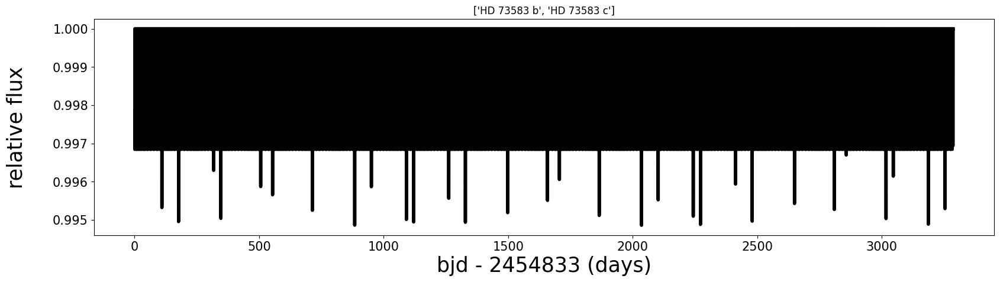

<Figure size 640x480 with 0 Axes>

0.022659678729729727
16.9018601 -2454830.8616 0.17 7.610303 -10.0 3.141592653589793 0.656 0.6 0.2 0.022659678729729727
0.029733859459459454
25.6725021 -2454828.7664 0.17 14.245648 -70.0 3.141592653589793 0.614 0.6 0.2 0.029733859459459454
['HIP 113103 b', 'HIP 113103 c']


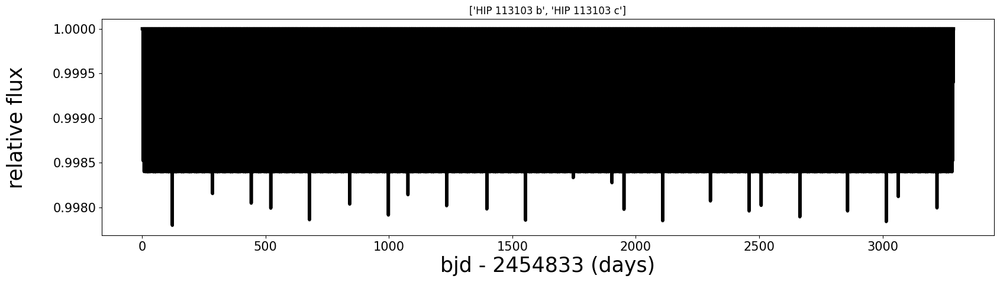

<Figure size 640x480 with 0 Axes>

0.036860789690721645
35.229562 -2454828.087 0.22 20.772907 0.1 3.141592653589793 None 0.6 0.2 0.036860789690721645
0.03159631280412371
65.387831 -2454826.446 0.23 52.563491 -0.1 3.141592653589793 None 0.6 0.2 0.03159631280412371
['HIP 9618 b', 'HIP 9618 c']


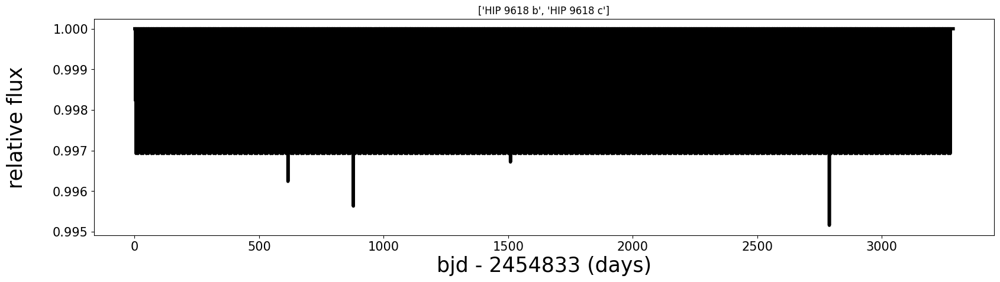

<Figure size 640x480 with 0 Axes>

0.03649199647058823
4.630311 None None 1.2916 None 3.141592653589793 0.39 0.6 0.2 0.03649199647058823
0.037031287058823525
12.053508 None None 5.444017 None 3.141592653589793 0.4 0.6 0.2 0.037031287058823525
['K2-117 b', 'K2-117 c']


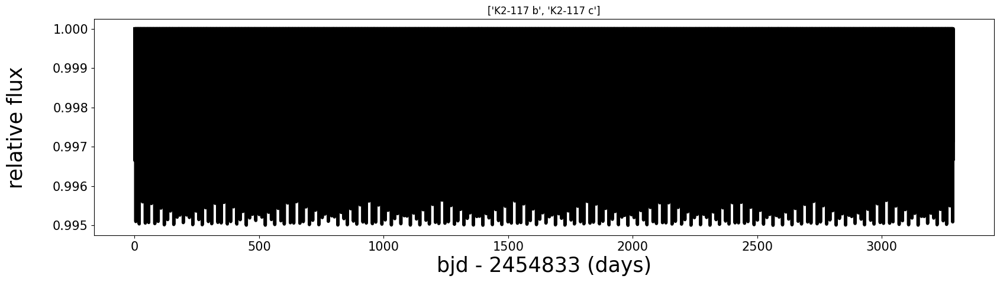

<Figure size 640x480 with 0 Axes>

0.02035821970588235
1.8300753 None 0.0 0.2803244 None 3.141592653589793 None 0.6 0.2 0.02035821970588235
0.09437585294117645
16.732817 None 0.092 7.7485 None 3.141592653589793 None 0.6 0.2 0.09437585294117645
['K2-141 b', 'K2-141 c']


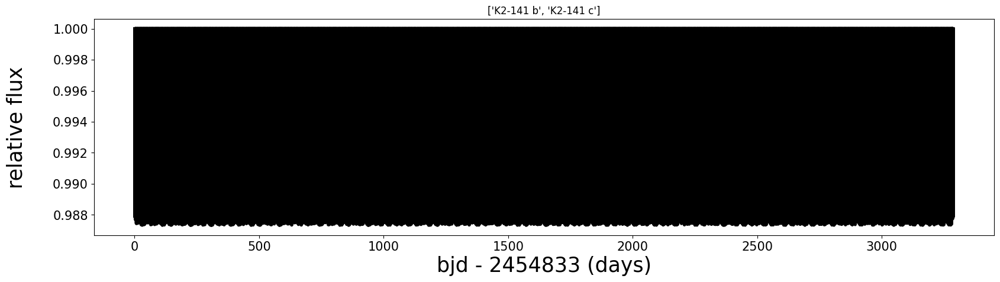

<Figure size 640x480 with 0 Axes>

0.05695235454545453
None None 0.129 2.6446 -64.0 3.141592653589793 None 0.6 0.2 0.05695235454545453
0.060841783636363625
None None 0.075 4.00498 130.0 3.141592653589793 None 0.6 0.2 0.060841783636363625
['K2-146 b', 'K2-146 c']


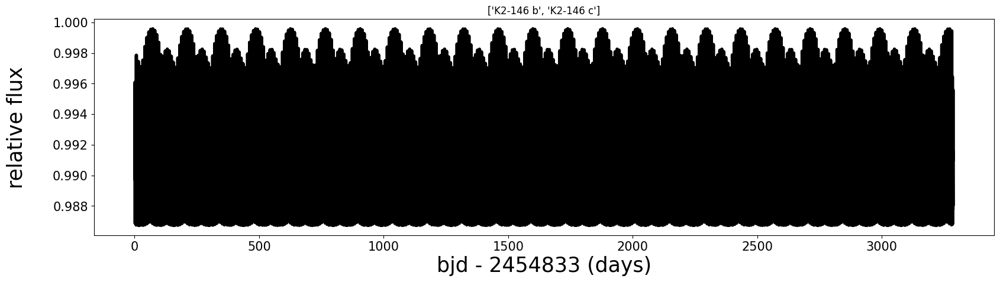

<Figure size 640x480 with 0 Axes>

0.02895904857142857
9.922095 -2454831.3 None 3.67626 None 3.141592653589793 0.44 0.6 0.2 0.02895904857142857
0.030123231428571425
16.585823 -2454830.9 None 7.95486 None 3.141592653589793 0.42 0.6 0.2 0.030123231428571425
['K2-154 b', 'K2-154 c']


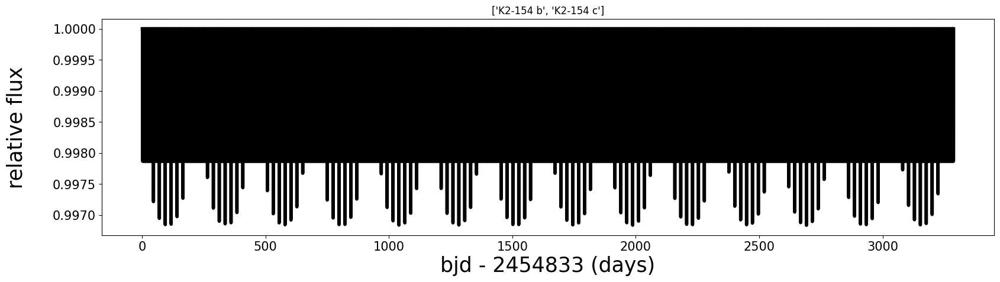

<Figure size 640x480 with 0 Axes>

0.025477222736842105
21.730613 -2454829.2 None 10.06049 None 3.141592653589793 0.38 0.6 0.2 0.025477222736842105
0.012352592842105265
15.238378 -2454828.0 None 5.90279 None 3.141592653589793 0.41 0.6 0.2 0.012352592842105265
['K2-158 b', 'K2-158 c']


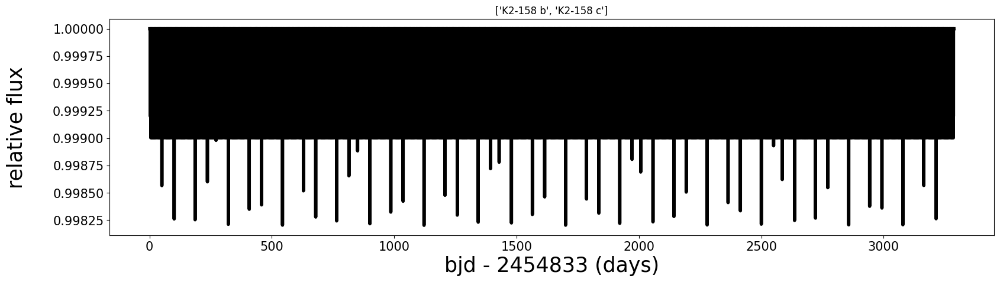

<Figure size 640x480 with 0 Axes>

0.01326544787755102
None None None 7.576544 None 3.141592653589793 None 0.6 0.2 0.01326544787755102
0.016857783551020408
None None None 12.400047 None 3.141592653589793 None 0.6 0.2 0.016857783551020408
['K2-170 b', 'K2-170 c']


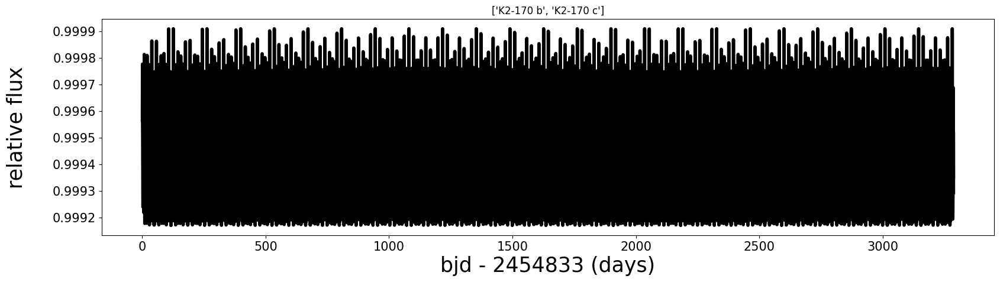

<Figure size 640x480 with 0 Axes>

0.01755607820689655
None None None 14.316941 None 3.141592653589793 None 0.6 0.2 0.01755607820689655
0.03378438579310345
None None None 29.62682 None 3.141592653589793 None 0.6 0.2 0.03378438579310345
['K2-172 b', 'K2-172 c']


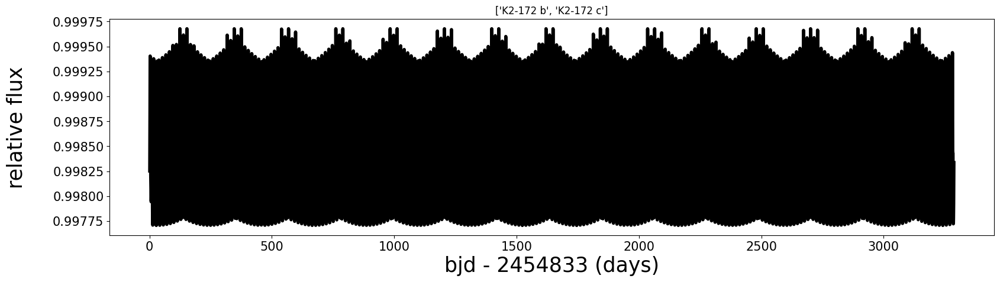

<Figure size 640x480 with 0 Axes>

0.011216096808510637
None -2454830.4 None 10.616384 None 3.141592653589793 0.74 0.6 0.2 0.011216096808510637
0.02330997510638298
None -2454828.36 None 52.713494 None 3.141592653589793 0.73 0.6 0.2 0.02330997510638298
['K2-185 b', 'K2-185 c']


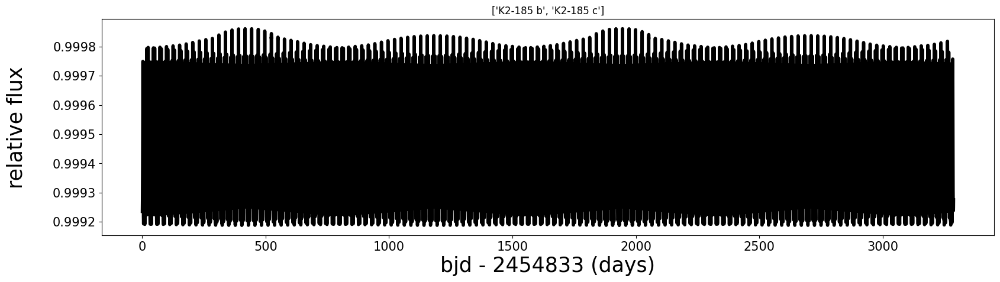

<Figure size 640x480 with 0 Axes>

0.010400604201680673
7.080211 None None 1.742169 None 3.141592653589793 0.4 0.6 0.2 0.010400604201680673
0.02180274806722689
19.231715 None None 7.810253 None 3.141592653589793 0.37 0.6 0.2 0.02180274806722689
['K2-188 b', 'K2-188 c']


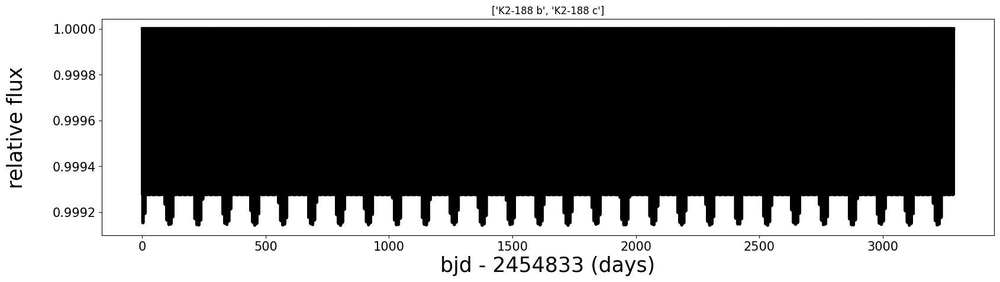

<Figure size 640x480 with 0 Axes>

0.016017550344827585
8.844139 None None 2.588309 None 3.141592653589793 0.41 0.6 0.2 0.016017550344827585
0.02634465517241379
16.65932 None None 6.679195 None 3.141592653589793 0.37 0.6 0.2 0.02634465517241379
['K2-189 b', 'K2-189 c']


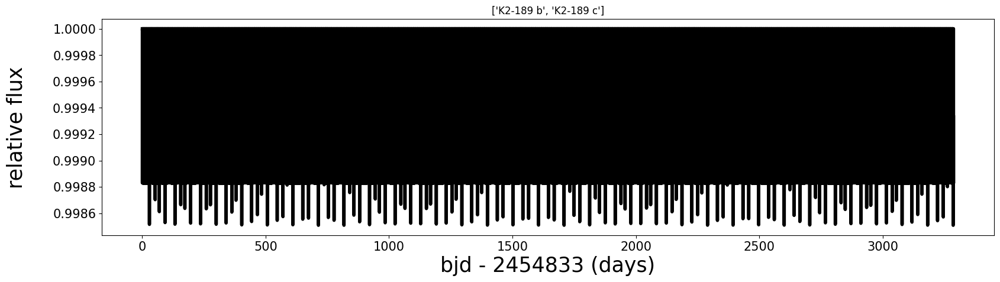

<Figure size 640x480 with 0 Axes>

0.013671312725274725
None None None 10.098858 None 3.141592653589793 None 0.6 0.2 0.013671312725274725
0.011011602659340659
None None None 21.574023 None 3.141592653589793 None 0.6 0.2 0.011011602659340659
['K2-190 b', 'K2-190 c']


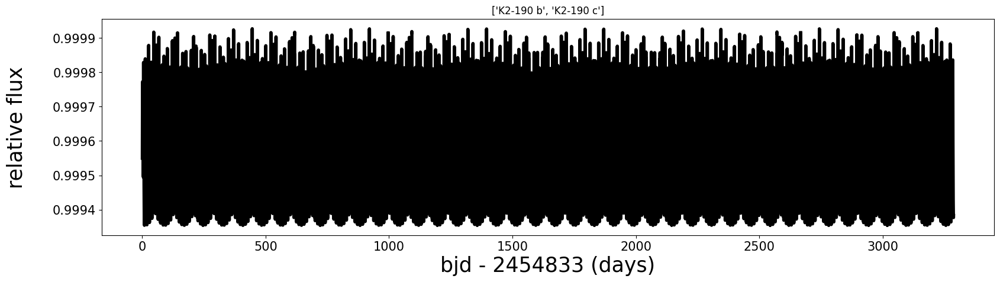

<Figure size 640x480 with 0 Axes>

0.02898550727272727
29.594792 None None 15.852975 None 3.141592653589793 0.34 0.6 0.2 0.02898550727272727
0.02595232246153846
None None None 28.482786 None 3.141592653589793 None 0.6 0.2 0.02595232246153846
['K2-195 b', 'K2-195 c']


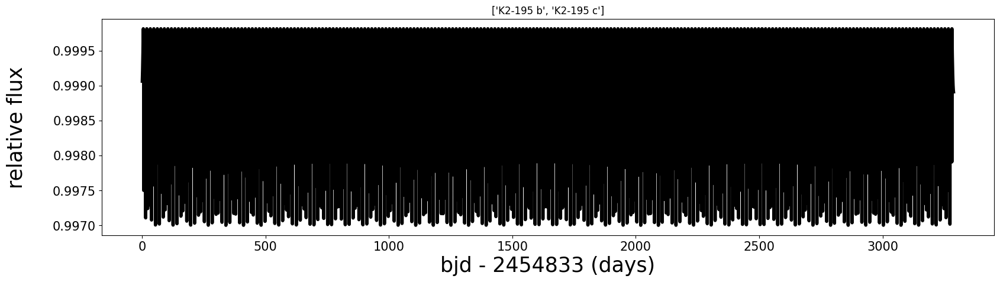

<Figure size 640x480 with 0 Axes>

0.023324317941176467
9.358618 -2454830.983 0.02 3.2253993 170.0 3.141592653589793 0.25 0.6 0.2 0.023324317941176467
0.0384244544117647
16.218338 -2454830.548 0.03 7.3744897 170.0 3.141592653589793 0.49 0.6 0.2 0.0384244544117647
['K2-199 b', 'K2-199 c']


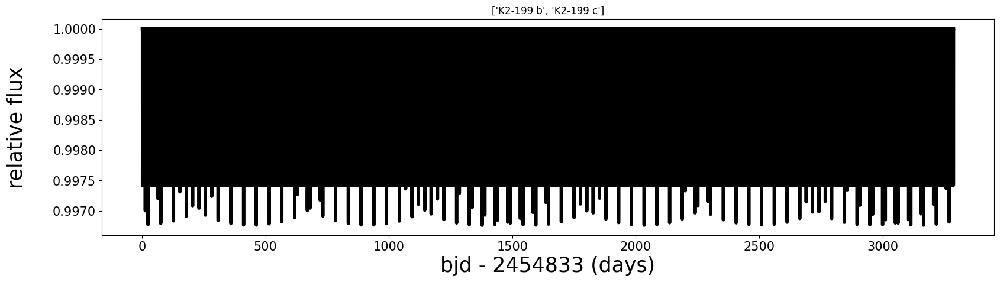

<Figure size 640x480 with 0 Axes>

0.014585359090909088
None None None 1.05979 None 3.141592653589793 None 0.6 0.2 0.014585359090909088
0.03423392140909091
None None None 22.779878 None 3.141592653589793 None 0.6 0.2 0.03423392140909091
['K2-201 b', 'K2-201 c']


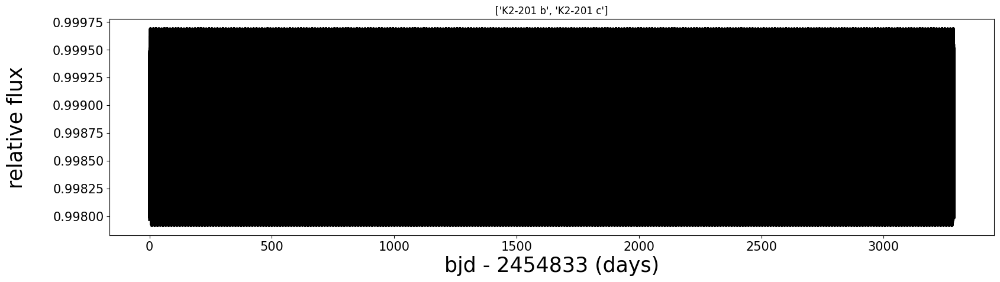

<Figure size 640x480 with 0 Axes>

0.0081594666
None None None 0.50557 None 3.141592653589793 None 0.6 0.2 0.0081594666
0.01375191
None None None 4.562546 None 3.141592653589793 None 0.6 0.2 0.01375191
['K2-223 b', 'K2-223 c']


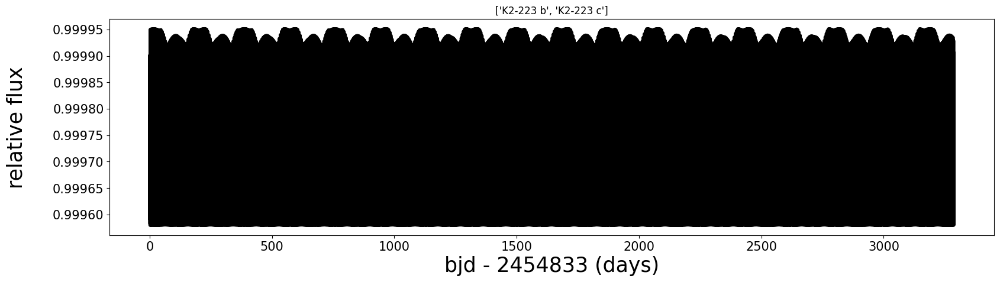

<Figure size 640x480 with 0 Axes>

0.017026174285714284
12.641484 -2454830.6 None 4.47904 None 3.141592653589793 0.41 0.6 0.2 0.017026174285714284
0.026303256428571432
21.706114 -2454829.4 None 10.09489 None 3.141592653589793 0.4 0.6 0.2 0.026303256428571432
['K2-224 b', 'K2-224 c']


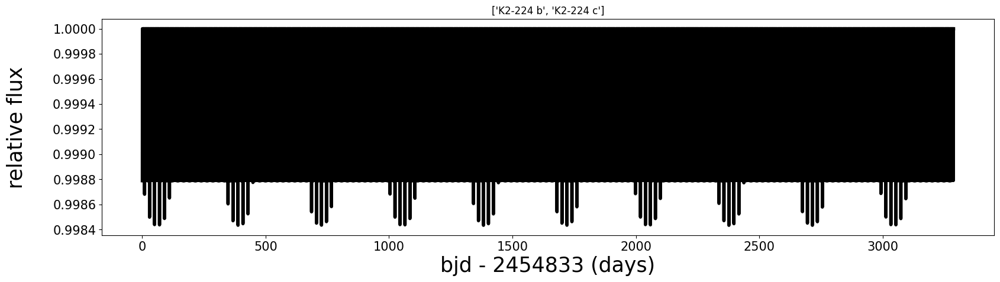

<Figure size 640x480 with 0 Axes>

0.01160498734177215
None None None 0.584216 None 3.141592653589793 None 0.6 0.2 0.01160498734177215
0.023558124303797463
18.839731 -2454830.5 None 8.32727 None 3.141592653589793 0.39 0.6 0.2 0.023558124303797463
['K2-229 b', 'K2-229 c']


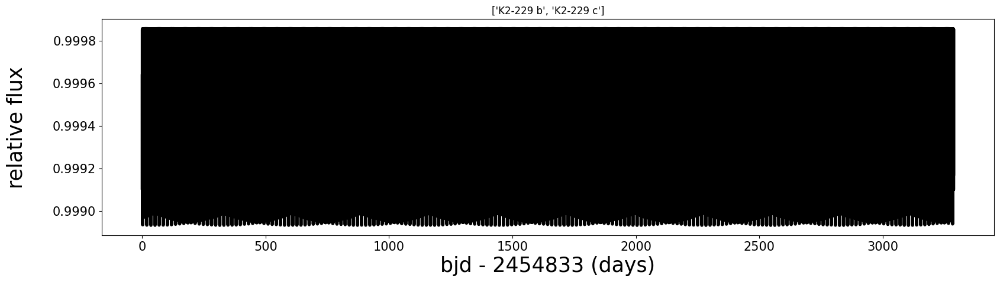

<Figure size 640x480 with 0 Axes>

0.03395533333333333
12.567987 -2454830.8472 None 6.034 None 3.141592653589793 0.28 0.6 0.2 0.03395533333333333
0.030559799999999995
28.394341 -2454829.808 None 20.523 None 3.141592653589793 0.29 0.6 0.2 0.030559799999999995
['K2-240 b', 'K2-240 c']


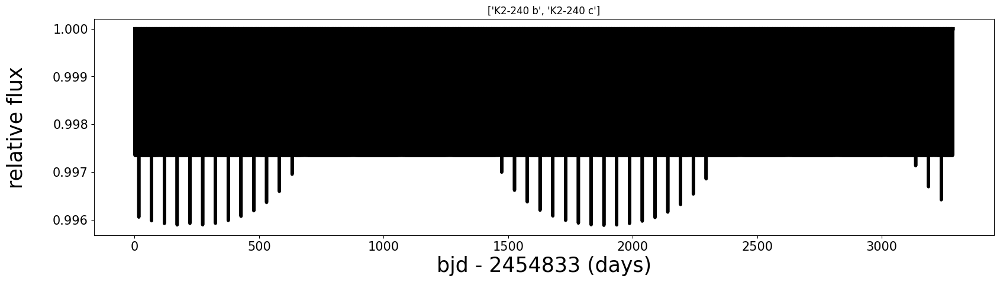

<Figure size 640x480 with 0 Axes>

0.014312539424460431
26.630413 -2454829.3 None 11.54182 None 3.141592653589793 0.39 0.6 0.2 0.014312539424460431
0.013257236978417264
44.514683000000005 -2454827.8 None 24.94598 None 3.141592653589793 0.4 0.6 0.2 0.013257236978417264
['K2-243 b', 'K2-243 c']


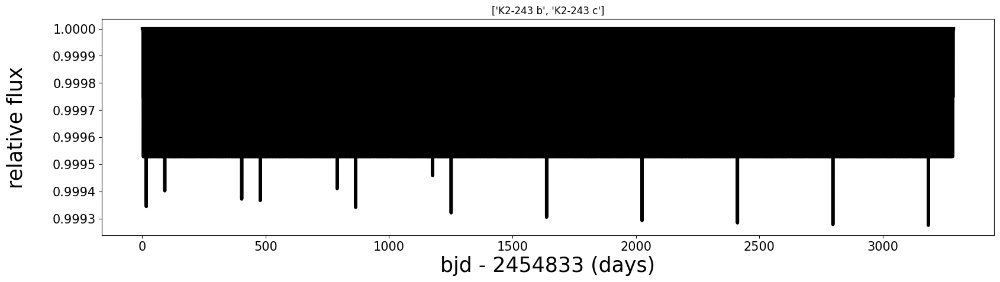

<Figure size 640x480 with 0 Axes>

0.02816816347826087
7.4476960000000005 -2454831.8 None 2.25021 None 3.141592653589793 0.43 0.6 0.2 0.02816816347826087
0.02909824434782609
15.066885000000001 -2454831.3 None 6.49424 None 3.141592653589793 0.41 0.6 0.2 0.02909824434782609
['K2-247 b', 'K2-247 c']


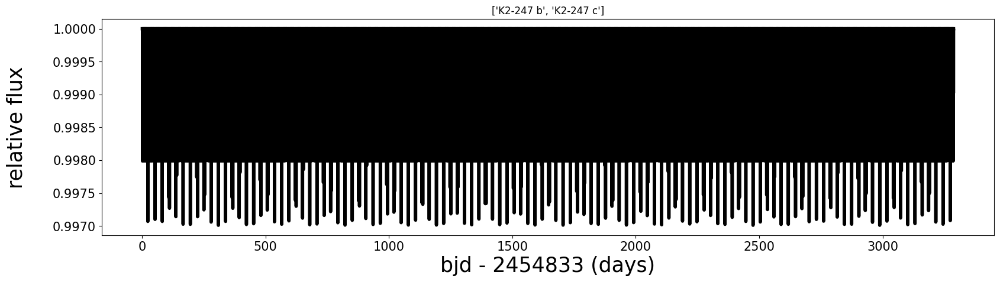

<Figure size 640x480 with 0 Axes>

0.022304092835820893
10.975552 -2454831.4 None 4.09639 None 3.141592653589793 0.72 0.6 0.2 0.022304092835820893
0.029966848656716415
22.612576999999998 -2454830.6 None 12.11839 None 3.141592653589793 0.42 0.6 0.2 0.029966848656716415
['K2-254 b', 'K2-254 c']


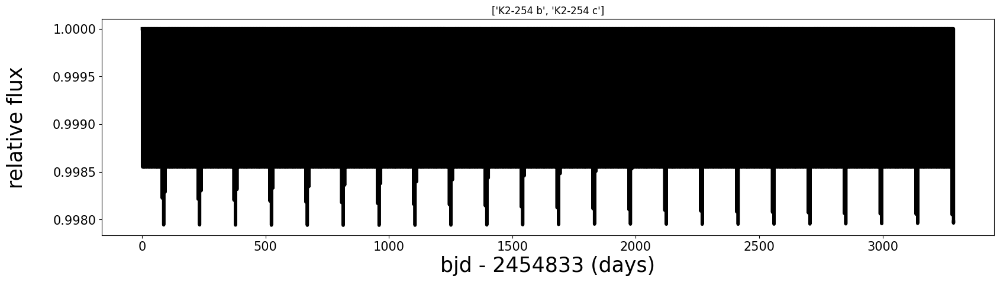

<Figure size 640x480 with 0 Axes>

0.04351845561702127
12.3058477 -2454831.116 None 5.840002 None 3.141592653589793 0.4 0.6 0.2 0.04351845561702127
0.05204268919148937
27.6422217 -2454830.382 None 19.660302 None 3.141592653589793 0.55 0.6 0.2 0.05204268919148937
['K2-264 b', 'K2-264 c']


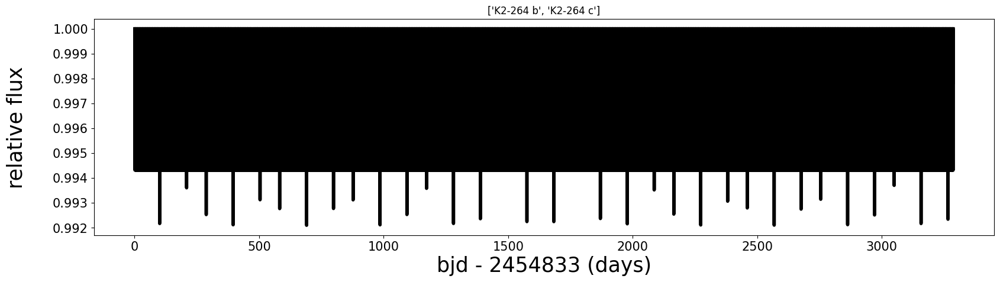

<Figure size 640x480 with 0 Axes>

0.016430853506493506
6.051253 None None 1.543069 None 3.141592653589793 0.42 0.6 0.2 0.016430853506493506
0.03512392597402597
12.176003000000001 None None 4.400028 None 3.141592653589793 0.38 0.6 0.2 0.03512392597402597
['K2-270 b', 'K2-270 c']


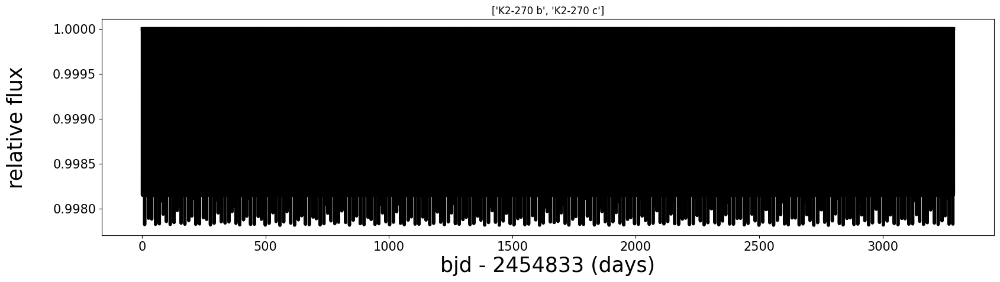

<Figure size 640x480 with 0 Axes>

0.03109127478260869
6.786223 None None 3.2809626 None 3.141592653589793 0.77 0.6 0.2 0.03109127478260869
0.029363981739130435
21.583619 None None 8.4388385 None 3.141592653589793 0.33 0.6 0.2 0.029363981739130435
['K2-275 b', 'K2-275 c']


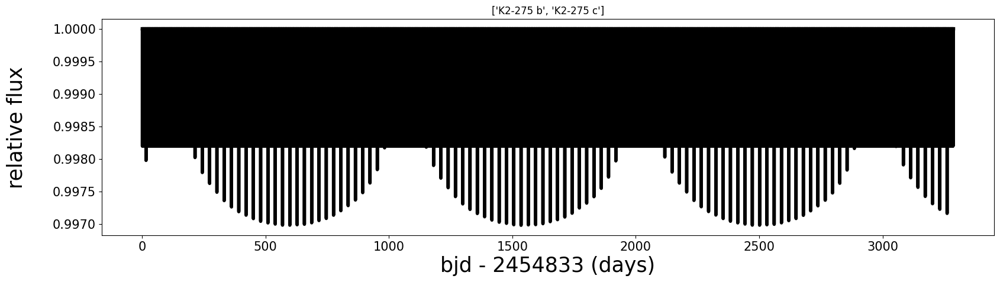

<Figure size 640x480 with 0 Axes>

0.03208779
3.601353 None None 1.133 None 3.141592653589793 0.43 0.6 0.2 0.03208779
0.044150868947368416
14.258418 None None 5.26 None 3.141592653589793 0.4 0.6 0.2 0.044150868947368416
['K2-316 b', 'K2-316 c']


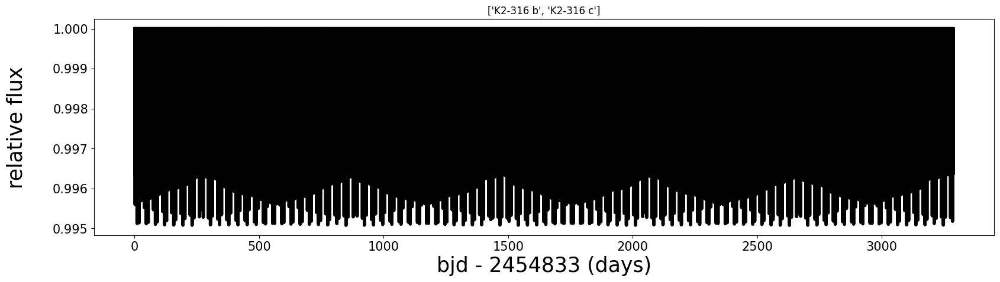

<Figure size 640x480 with 0 Axes>

0.01548171
None -2454829.08 None 9.398977 None 3.141592653589793 0.43 0.6 0.2 0.01548171
0.023525279999999996
None -2454828.57 None 22.996591 None 3.141592653589793 0.37 0.6 0.2 0.023525279999999996
['K2-331 b', 'K2-331 c']


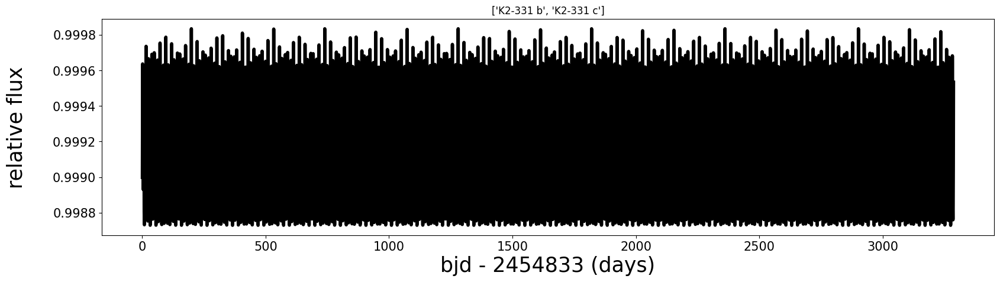

<Figure size 640x480 with 0 Axes>

0.03288500217391304
None -2454831.54 None 2.787174 None 3.141592653589793 0.48 0.6 0.2 0.03288500217391304
0.040259214782608695
None -2454830.8 None 7.676972 None 3.141592653589793 0.36 0.6 0.2 0.040259214782608695
['K2-343 b', 'K2-343 c']


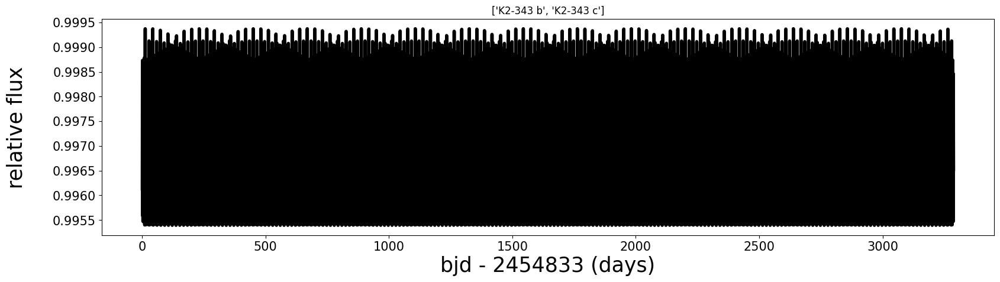

<Figure size 640x480 with 0 Axes>

0.03516174635294117
None -2454830.25 None 4.688418 None 3.141592653589793 0.39 0.6 0.2 0.03516174635294117
0.028798117411764704
None -2454829.32 None 12.550171 None 3.141592653589793 0.43 0.6 0.2 0.028798117411764704
['K2-348 b', 'K2-348 c']


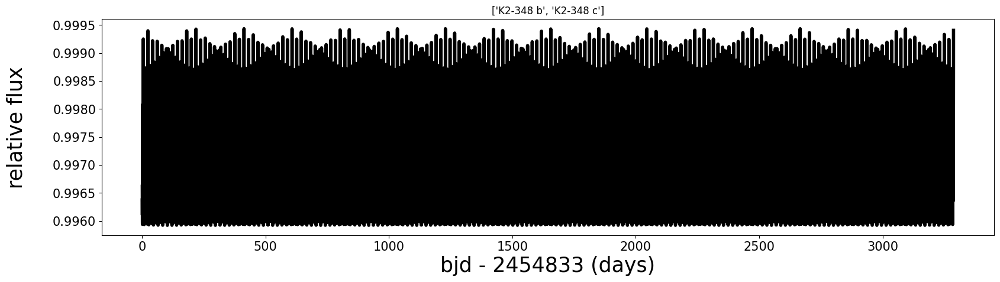

<Figure size 640x480 with 0 Axes>

0.01357560346153846
None -2454830.25 None 4.163873 None 3.141592653589793 0.41 0.6 0.2 0.01357560346153846
0.024153995769230767
None -2454828.06 None 19.991944 None 3.141592653589793 0.45 0.6 0.2 0.024153995769230767
['K2-350 b', 'K2-350 c']


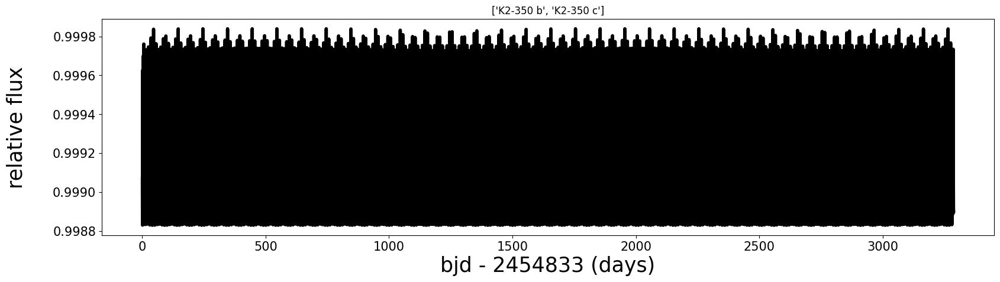

<Figure size 640x480 with 0 Axes>

0.016048932329670328
None None None 4.521953 None 3.141592653589793 0.235 0.6 0.2 0.016048932329670328
0.022295221120879116
None None None 16.43445 None 3.141592653589793 0.649 0.6 0.2 0.022295221120879116
['K2-374 b', 'K2-374 c']


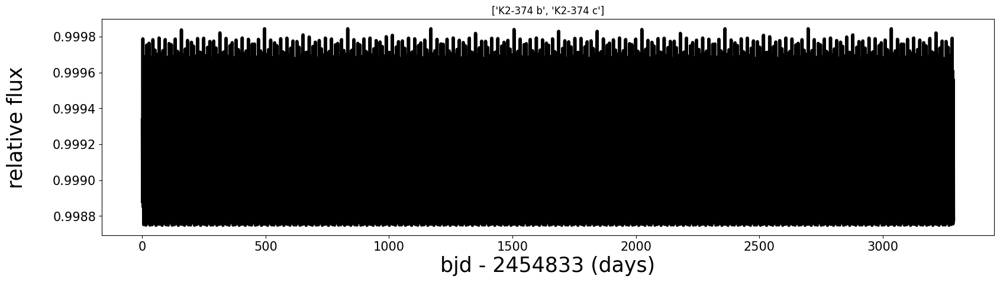

<Figure size 640x480 with 0 Axes>

0.018539611999999997
None None None 8.584043 None 3.141592653589793 0.32 0.6 0.2 0.018539611999999997
0.017317219999999998
None None None 20.851337 None 3.141592653589793 0.399 0.6 0.2 0.017317219999999998
['K2-389 b', 'K2-389 c']


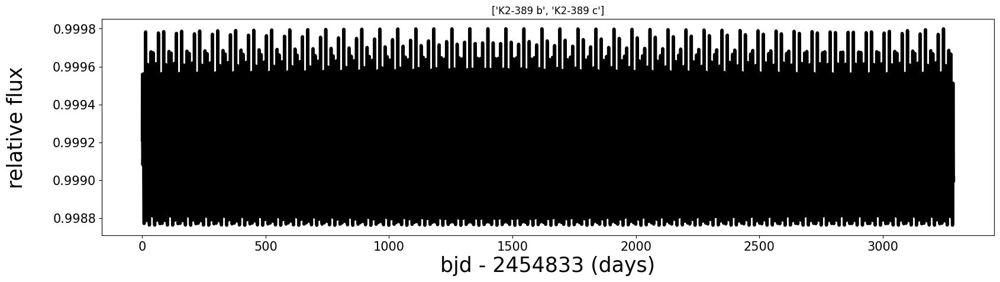

<Figure size 640x480 with 0 Axes>

0.030524538692307687
None None None 4.803352 None 3.141592653589793 0.25 0.6 0.2 0.030524538692307687
0.03990404653846153
None None None 8.491282 None 3.141592653589793 0.677 0.6 0.2 0.03990404653846153
['K2-395 b', 'K2-395 c']


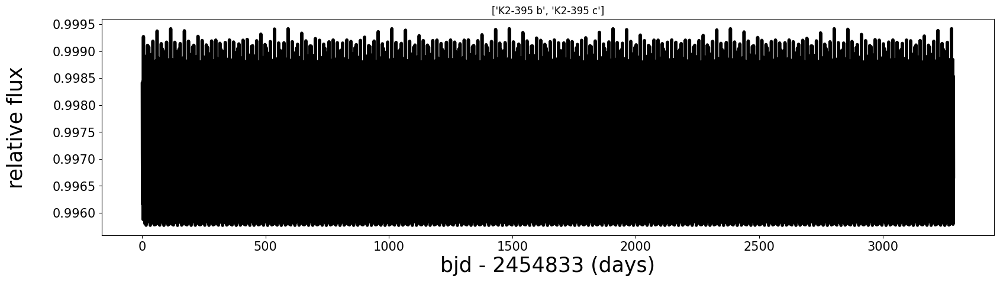

<Figure size 640x480 with 0 Axes>

0.015734975282608695
None None None 0.673862 None 3.141592653589793 0.266 0.6 0.2 0.015734975282608695
0.031131135391304347
None None None 25.76051 None 3.141592653589793 0.475 0.6 0.2 0.031131135391304347
['K2-396 b', 'K2-396 c']


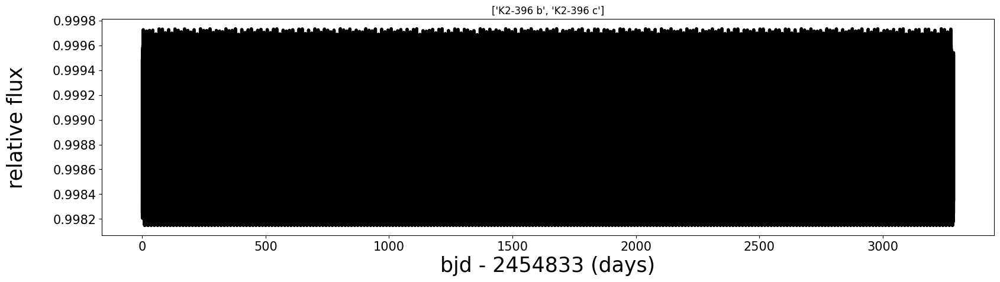

<Figure size 640x480 with 0 Axes>

0.016812819
None None None 6.393025 None 3.141592653589793 0.523 0.6 0.2 0.016812819
0.037692063
None None None 18.787839 None 3.141592653589793 0.701 0.6 0.2 0.037692063
['K2-398 b', 'K2-398 c']


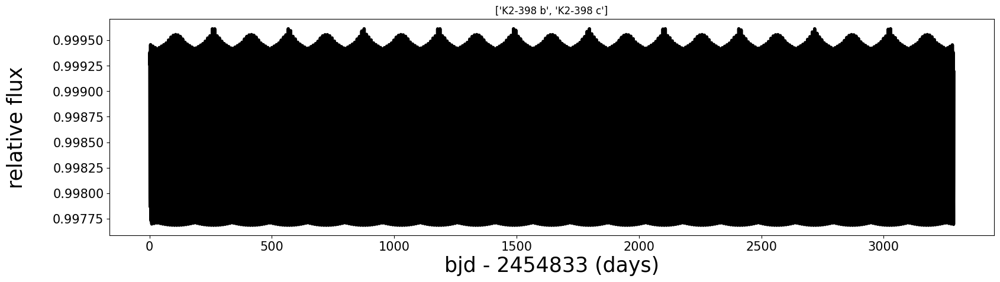

<Figure size 640x480 with 0 Axes>

0.012647813999999999
None None None 4.941907 None 3.141592653589793 0.309 0.6 0.2 0.012647813999999999
0.01340688
None None None 9.22453 None 3.141592653589793 0.259 0.6 0.2 0.01340688
['K2-407 b', 'K2-407 c']


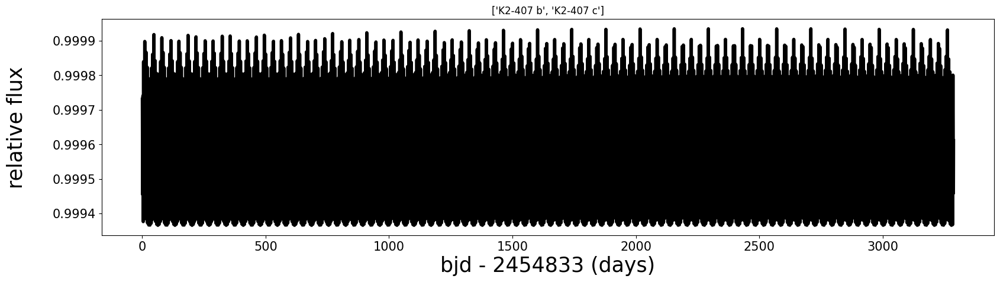

<Figure size 640x480 with 0 Axes>

0.00995376342857143
2.8663830000000003 None None 0.8094 None 3.141592653589793 None 0.6 0.2 0.00995376342857143
0.016148671457142858
10.436574 None None 5.3301 None 3.141592653589793 None 0.6 0.2 0.016148671457142858
['K2-413 b', 'K2-413 c']


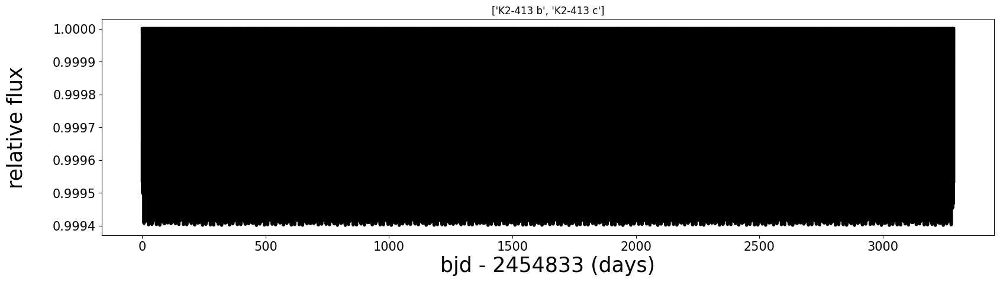

<Figure size 640x480 with 0 Axes>

0.01530920391780822
11.931013 None None 4.3696 None 3.141592653589793 None 0.6 0.2 0.01530920391780822
0.024225967479452055
13.523448 None None 6.669 None 3.141592653589793 None 0.6 0.2 0.024225967479452055
['K2-414 b', 'K2-414 c']


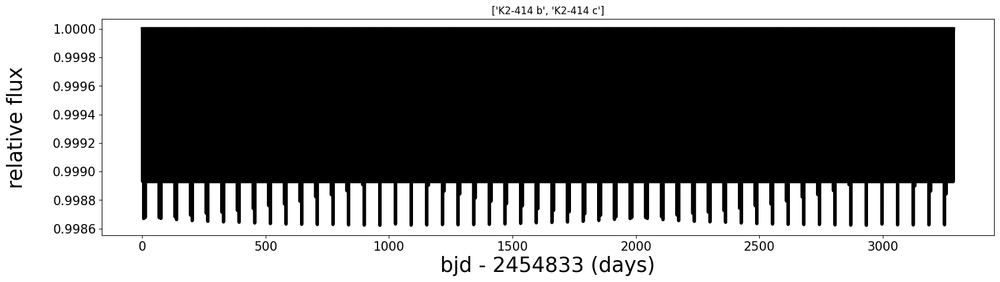

<Figure size 640x480 with 0 Axes>

0.07656927666666666
None None None 3.471149 None 3.141592653589793 0.11 0.6 0.2 0.07656927666666666
0.04108595333333333
None None None 2.198884 None 3.141592653589793 0.14 0.6 0.2 0.04108595333333333
['K2-43 b', 'K2-43 c']


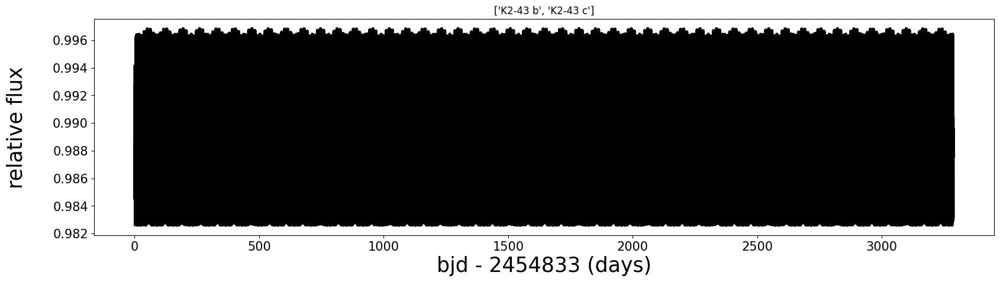

<Figure size 640x480 with 0 Axes>

0.03026676082191781
33.171646 -2454830.24 None 20.6921 None 3.141592653589793 None 0.6 0.2 0.03026676082191781
0.0288852904109589
22.171595 -2454831.25 None 11.2954 None 3.141592653589793 None 0.6 0.2 0.0288852904109589
['K2-59 b', 'K2-59 c']


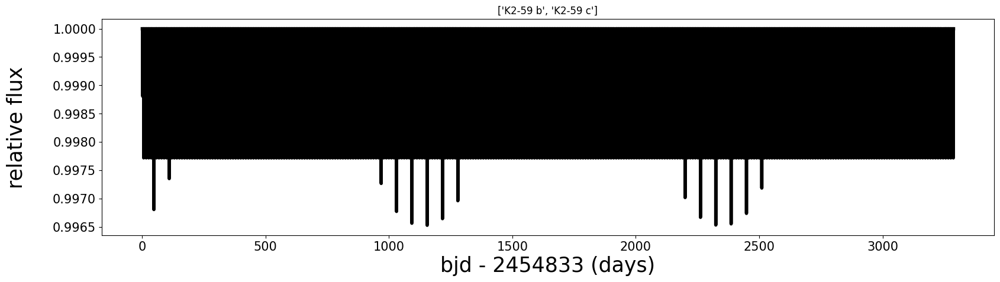

<Figure size 640x480 with 0 Axes>

0.026875878904109588
15.581364 -2454831.59 None 6.67202 None 3.141592653589793 None 0.6 0.2 0.026875878904109588
0.026875878904109588
28.124852 -2454831.71 None 16.1966 None 3.141592653589793 None 0.6 0.2 0.026875878904109588
['K2-62 b', 'K2-62 c']


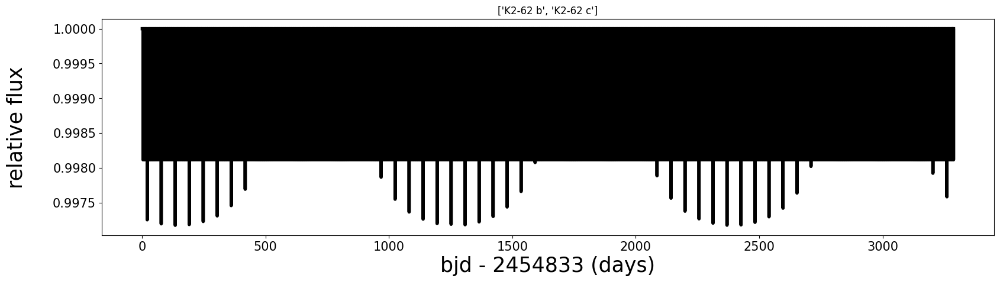

<Figure size 640x480 with 0 Axes>

0.018110899877300614
39.85987300000001 -2454827.51 None 20.257 None 3.141592653589793 None 0.6 0.2 0.018110899877300614
0.021935561963190183
46.303110000000004 -2454828.76 None 25.4556 None 3.141592653589793 None 0.6 0.2 0.021935561963190183
['K2-63 b', 'K2-63 c']


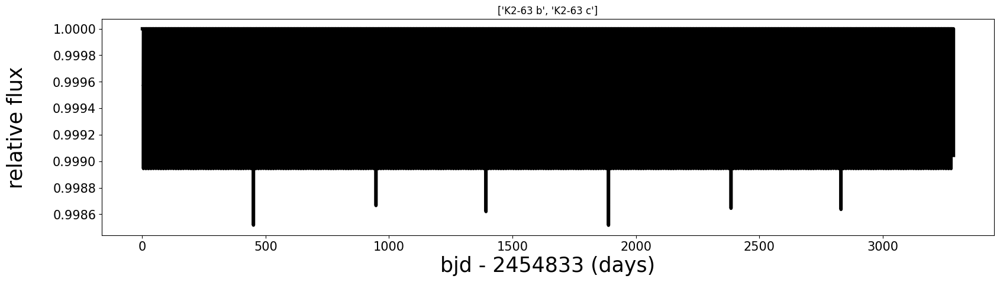

<Figure size 640x480 with 0 Axes>

0.015691281923076922
19.84419 -2454827.52 None 7.8142 None 3.141592653589793 None 0.6 0.2 0.015691281923076922
0.01627897038461538
35.009071 -2454826.58 None 18.311 None 3.141592653589793 None 0.6 0.2 0.01627897038461538
['K2-75 b', 'K2-75 c']


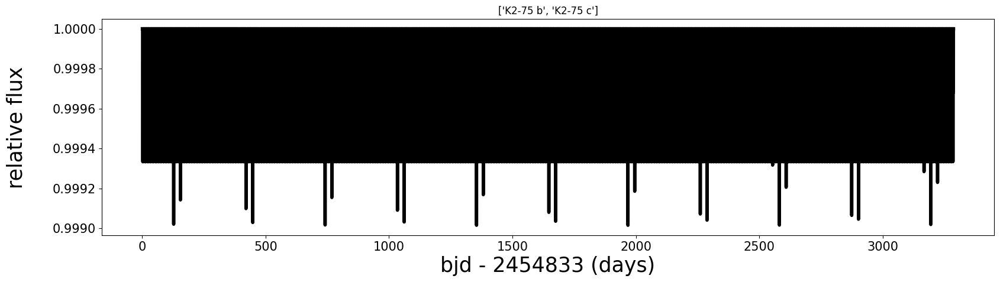

<Figure size 640x480 with 0 Axes>

0.02715456514285714
7.3839986 -2454831.336 None 2.74697 None 3.141592653589793 None 0.6 0.2 0.02715456514285714
0.03237155957142857
17.4702369 -2454830.23 None 9.99767 None 3.141592653589793 None 0.6 0.2 0.03237155957142857
['K2-83 b', 'K2-83 c']


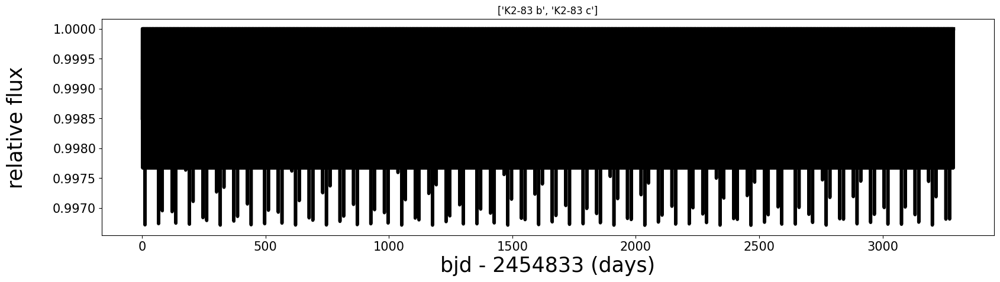

<Figure size 640x480 with 0 Axes>

0.02375778
16.291835000000003 -2454830.19 None 6.4215 None 3.141592653589793 None 0.6 0.2 0.02375778
0.020011739999999997
43.314232000000004 -2454828.39 None 27.86 None 3.141592653589793 None 0.6 0.2 0.020011739999999997
['K2-84 b', 'K2-84 c']


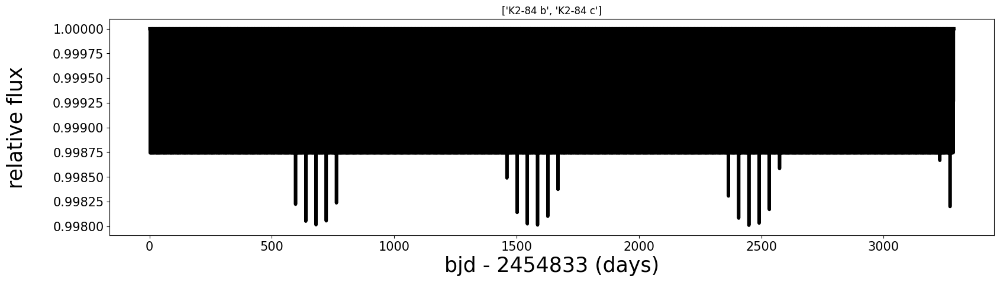

<Figure size 640x480 with 0 Axes>

0.03844619999999999
23.51904 -2454830.048 None 13.733314 None 3.141592653589793 0.44 0.6 0.2 0.03844619999999999
0.01891797142857143
8.574650000000002 None 0.19 2.900706 56.76 3.141592653589793 None 0.6 0.2 0.01891797142857143
['K2-90 b', 'K2-90 c']


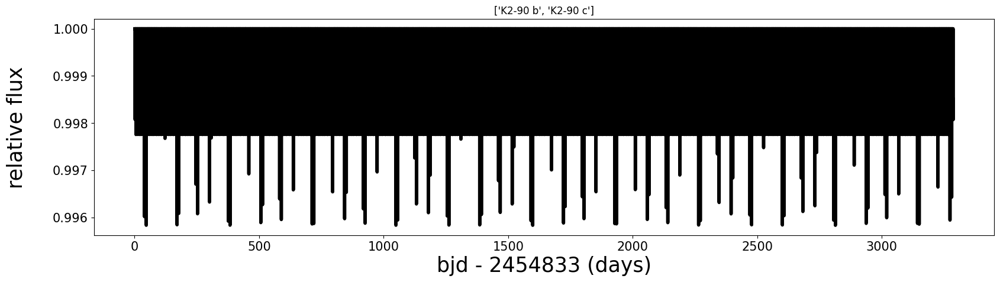

<Figure size 640x480 with 0 Axes>

0.047318400000000004
None None None 440.7813 None 3.141592653589793 None 0.6 0.2 0.047318400000000004
0.047318400000000004
None None None 440.7813 None 3.141592653589793 None 0.6 0.2 0.047318400000000004
['KIC 5437945 b', 'KIC 5437945']


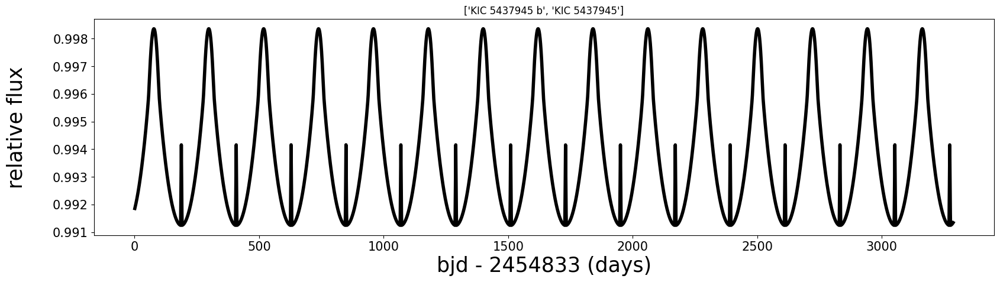

<Figure size 640x480 with 0 Axes>

0.040944198058252425
None None None 572.3847 None 3.141592653589793 None 0.6 0.2 0.040944198058252425
0.040944198058252425
None None None 572.3847 None 3.141592653589793 None 0.6 0.2 0.040944198058252425
['KIC 9663113 b', 'KIC 9663113']


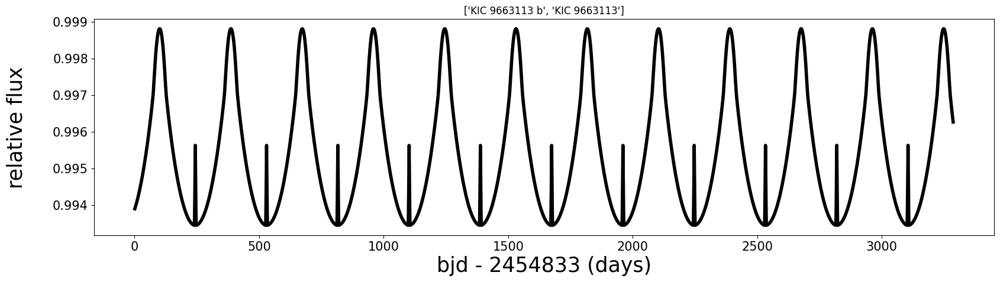

<Figure size 640x480 with 0 Axes>

0.09028456341428572
37.72846 None 0.34 17.855182 None 3.141592653589793 0.371 0.6 0.2 0.09028456341428572
0.09028456341428572
37.72846 None 0.34 17.855182 None 3.141592653589793 0.371 0.6 0.2 0.09028456341428572
['KOI-12 b', 'KOI-12']


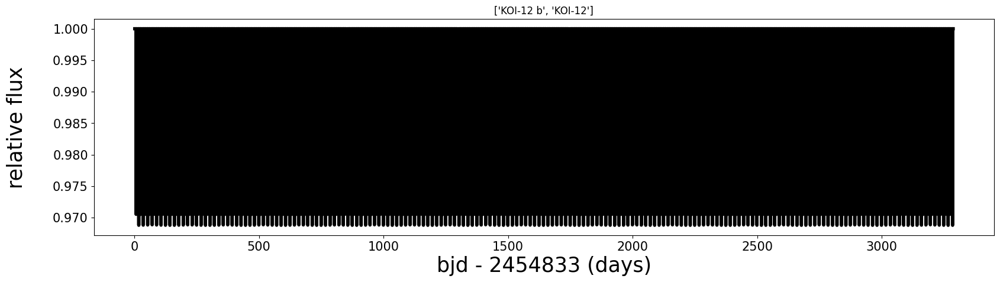

<Figure size 640x480 with 0 Axes>

0.0350215308
None None 0.05561 10.91647 None 3.141592653589793 None 0.6 0.2 0.0350215308
None
None None 0.05724 22.26492 None 3.141592653589793 None 0.6 0.2 None
['KOI-142 b', 'KOI-142 c']


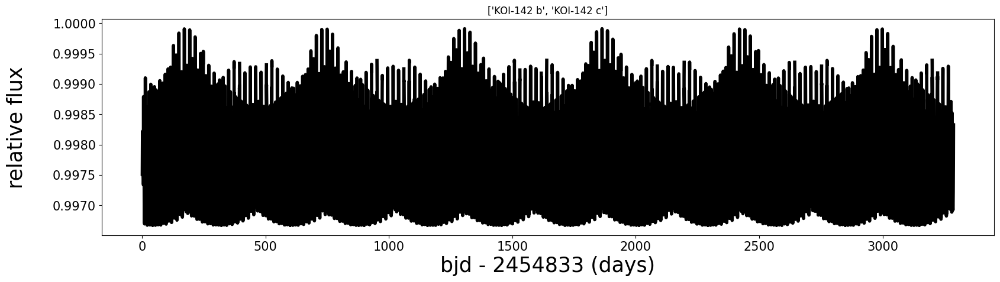

<Figure size 640x480 with 0 Axes>

0.017957820618556698
36.0821272 None 0.014 20.4415 230.175 3.141592653589793 None 0.6 0.2 0.017957820618556698
0.017957820618556698
27.510662070000002 None 0.0114 13.6088 49.951 3.141592653589793 None 0.6 0.2 0.017957820618556698
['KOI-1599.01', 'KOI-1599.02']


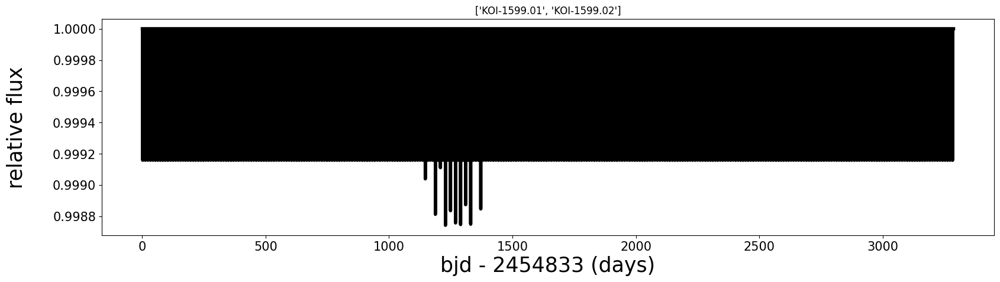

<Figure size 640x480 with 0 Axes>

0.07125258631578947
None -2454827.126 0.0 134.4628 None 3.141592653589793 0.9239 0.6 0.2 0.07125258631578947
0.04374876631578948
None None 0.0 284.215 None 3.141592653589793 None 0.6 0.2 0.04374876631578948
['KOI-1783.01', 'KOI-1783.02']


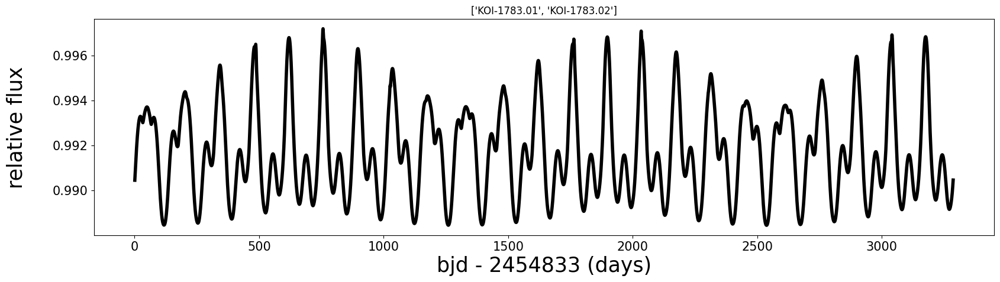

<Figure size 640x480 with 0 Axes>

0.026194114285714283
None -2454831.2709 None 3.69298373 None 3.141592653589793 None 0.6 0.2 0.026194114285714283
0.02213402657142857
None -2454831.4231 None 5.70940492 None 3.141592653589793 None 0.6 0.2 0.02213402657142857
['Kepler-968 b', 'Kepler-968 c']


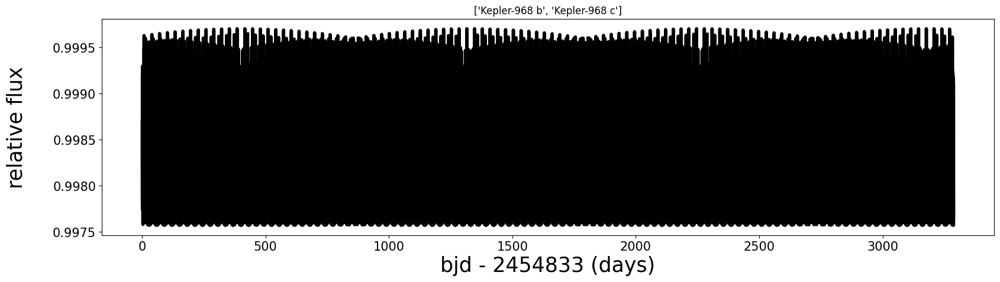

<Figure size 640x480 with 0 Axes>

0.00872787888
None None None 21.185 None 3.141592653589793 None 0.6 0.2 0.00872787888
0.008874565919999999
None None None 31.828 None 3.141592653589793 None 0.6 0.2 0.008874565919999999
['KOI-3503 b', 'KOI-3503 c']


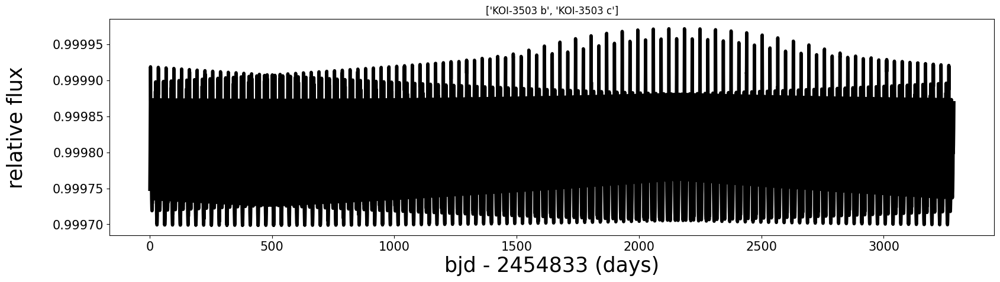

<Figure size 640x480 with 0 Axes>

0.04807578292682927
12.347496000000001 -2454831.42 0.12 4.2881785 -75.0 3.141592653589793 0.83 0.6 0.2 0.04807578292682927
None
35.940033 None 0.38 21.512 84.0 3.141592653589793 None 0.6 0.2 None
['KOI-984 b', 'KOI-984 c']


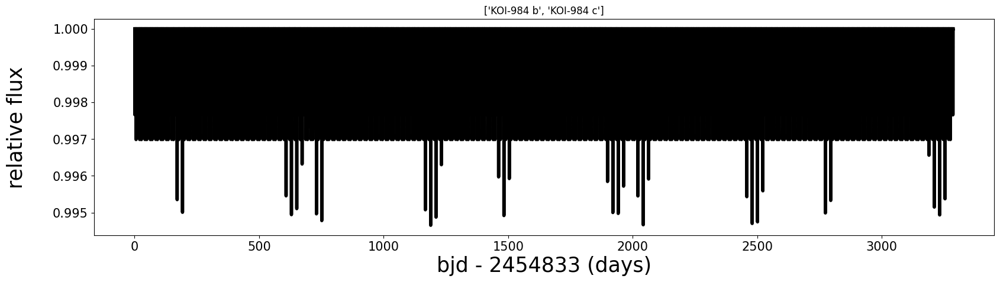

<Figure size 640x480 with 0 Axes>

0.03281705795454545
None -2454828.551 None 14.30511983 None 3.141592653589793 None 0.6 0.2 0.03281705795454545
0.017222630142857142
None None None 9.18186 None 3.141592653589793 None 0.6 0.2 0.017222630142857142
['Kepler-1001 b', 'Kepler-1001 c']


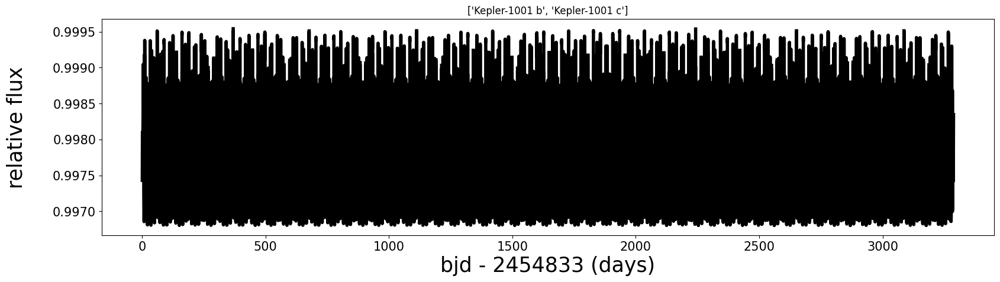

<Figure size 640x480 with 0 Axes>

0.0199861092
None -2454830.904 None 1.95452434 None 3.141592653589793 None 0.6 0.2 0.0199861092
0.0337380192
None -2454823.757 None 105.6551369 None 3.141592653589793 None 0.6 0.2 0.0337380192
['Kepler-1016 b', 'Kepler-1016 c']


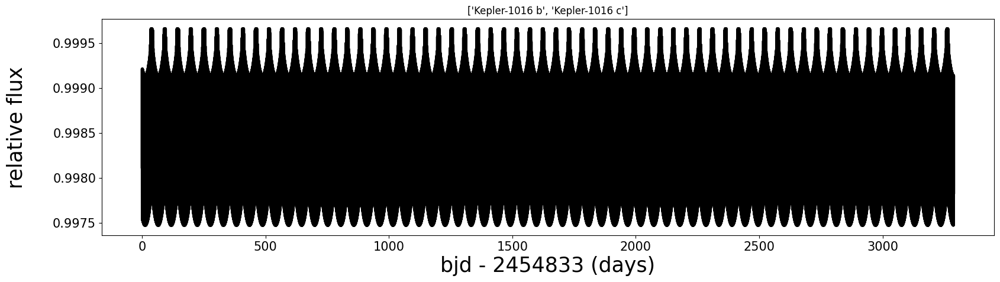

<Figure size 640x480 with 0 Axes>

0.03899135927710843
None -2454827.598 None 148.4603382 None 3.141592653589793 None 0.6 0.2 0.03899135927710843
0.01583146712195122
None None None 7.1276598 None 3.141592653589793 None 0.6 0.2 0.01583146712195122
['Kepler-1038 b', 'Kepler-1038 c']


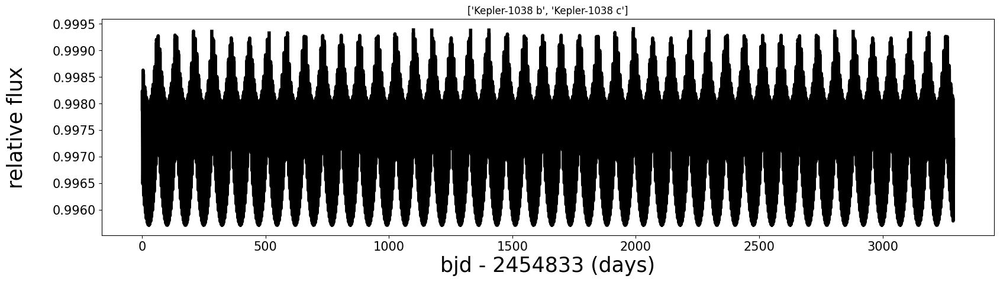

<Figure size 640x480 with 0 Axes>

0.01695663238938053
None -2454826.911 None 56.1886887 None 3.141592653589793 None 0.6 0.2 0.01695663238938053
0.008032089026548672
None -2454830.51 None 3.18897601 None 3.141592653589793 None 0.6 0.2 0.008032089026548672
['Kepler-1047 b', 'Kepler-1047 c']


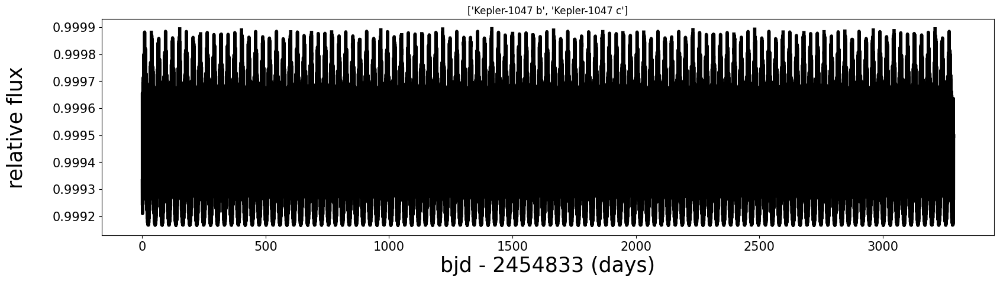

<Figure size 640x480 with 0 Axes>

0.012981153982300885
None -2454828.627 None 15.3787546 None 3.141592653589793 None 0.6 0.2 0.012981153982300885
0.012007567433628318
None -2454829.211 None 21.1284569 None 3.141592653589793 None 0.6 0.2 0.012007567433628318
['Kepler-1050 b', 'Kepler-1050 c']


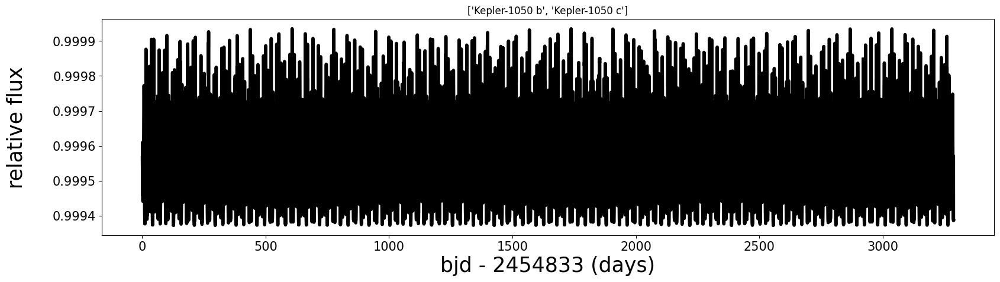

<Figure size 640x480 with 0 Axes>

0.026079673980582523
None -2454827.6423 None 34.8538276 None 3.141592653589793 None 0.6 0.2 0.026079673980582523
0.024807367058823526
150.301365 -2454824.01 0.0 180.921729 None 3.141592653589793 0.025 0.6 0.2 0.024807367058823526
['Kepler-1052 b', 'Kepler-1052 c']


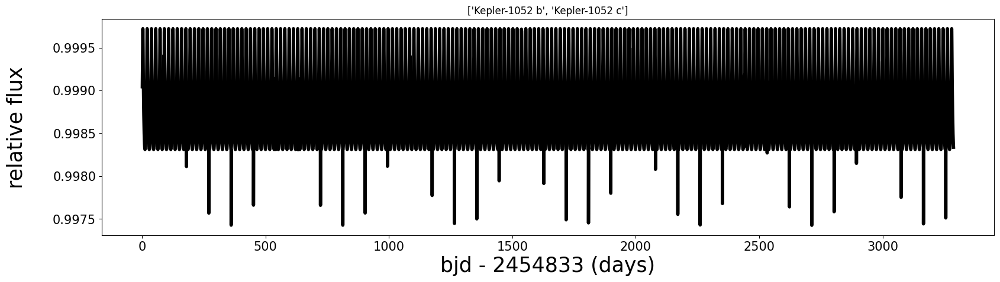

<Figure size 640x480 with 0 Axes>

0.03677034
None -2454831.2552 None 3.60930891 None 3.141592653589793 None 0.6 0.2 0.03677034
0.0157728
None -2454831.155 None 2.37030743 None 3.141592653589793 None 0.6 0.2 0.0157728
['Kepler-1065 b', 'Kepler-1065 c']


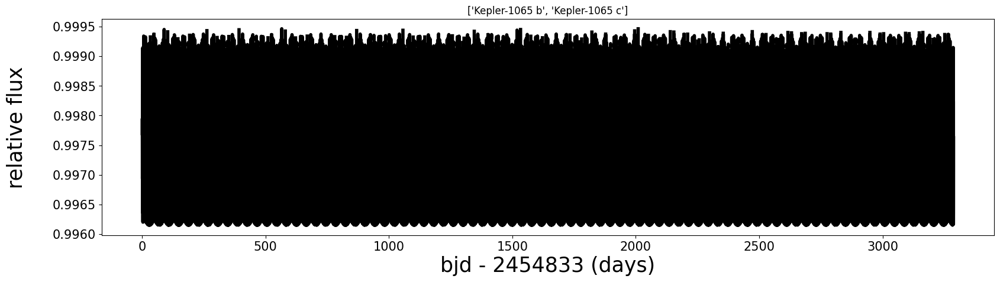

<Figure size 640x480 with 0 Axes>

0.0078864
None -2454831.924 None 0.76212926 None 3.141592653589793 None 0.6 0.2 0.0078864
0.017221926
None None None 5.4258399 None 3.141592653589793 None 0.6 0.2 0.017221926
['Kepler-1067 b', 'Kepler-1067 c']


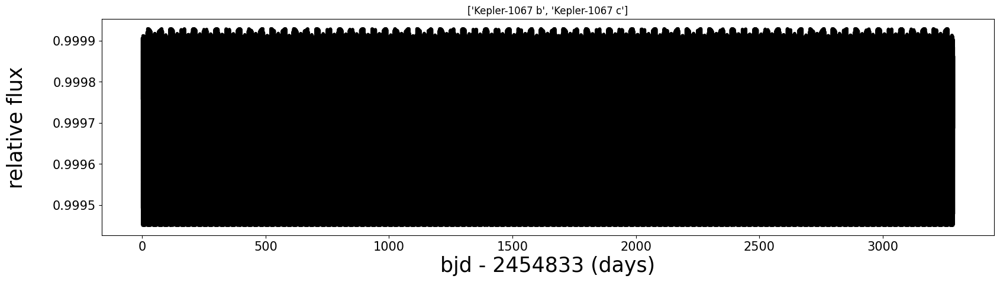

<Figure size 640x480 with 0 Axes>

0.05806362
None -2454820.642 None 219.3217528 None 3.141592653589793 None 0.6 0.2 0.05806362
0.02774150733333333
None None None 56.7771 None 3.141592653589793 None 0.6 0.2 0.02774150733333333
['Kepler-1085 b', 'Kepler-1085 c']


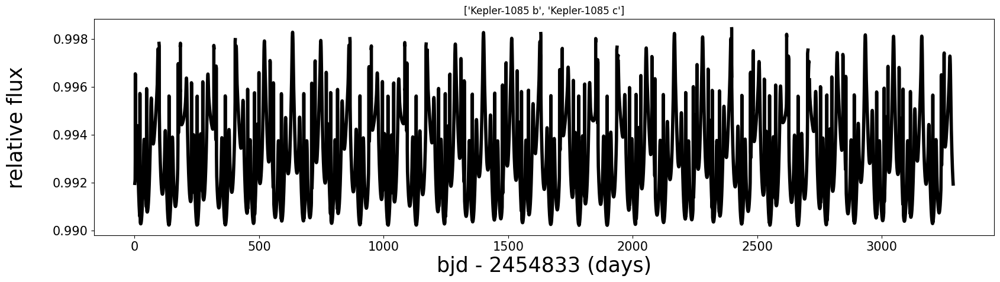

<Figure size 640x480 with 0 Axes>

0.02515593292682927
None -2454824.713 None 198.680179 None 3.141592653589793 None 0.6 0.2 0.02515593292682927
0.029891115267326733
None None None 42.42720032 None 3.141592653589793 None 0.6 0.2 0.029891115267326733
['Kepler-1090 b', 'Kepler-1090 c']


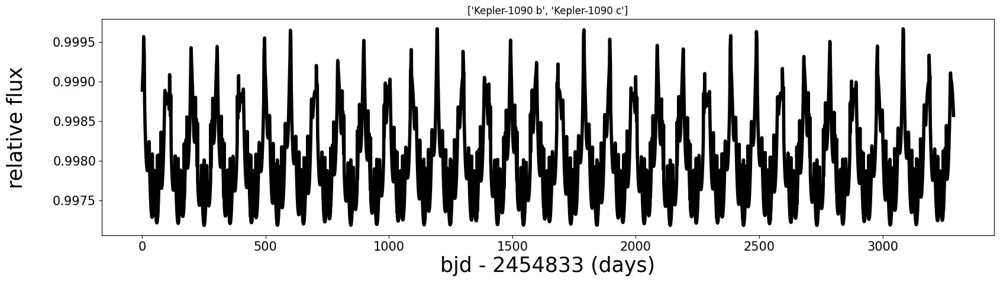

<Figure size 640x480 with 0 Axes>

0.014897902499999999
None -2454826.643 None 25.0824626 None 3.141592653589793 None 0.6 0.2 0.014897902499999999
0.014974301999999998
None -2454822.322 None 89.722292 None 3.141592653589793 None 0.6 0.2 0.014974301999999998
['Kepler-1093 b', 'Kepler-1093 c']


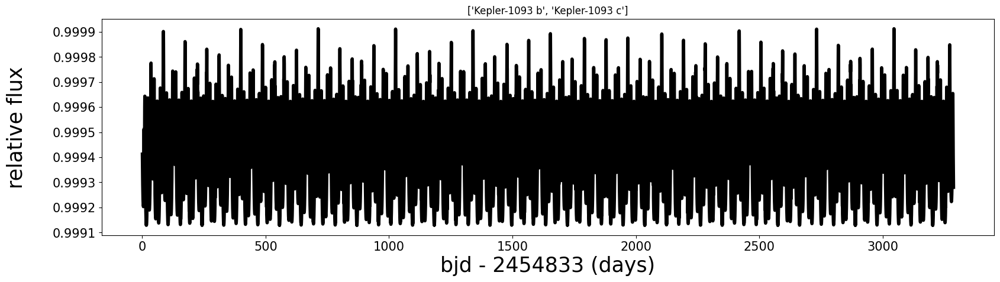

<Figure size 640x480 with 0 Axes>

0.014588982782608695
26.21393 -2454829.245 None 12.691112 None 3.141592653589793 0.13 0.6 0.2 0.014588982782608695
0.01761838904347826
48.50802 -2454828.177 None 31.719775 None 3.141592653589793 0.01 0.6 0.2 0.01761838904347826
['Kepler-110 b', 'Kepler-110 c']


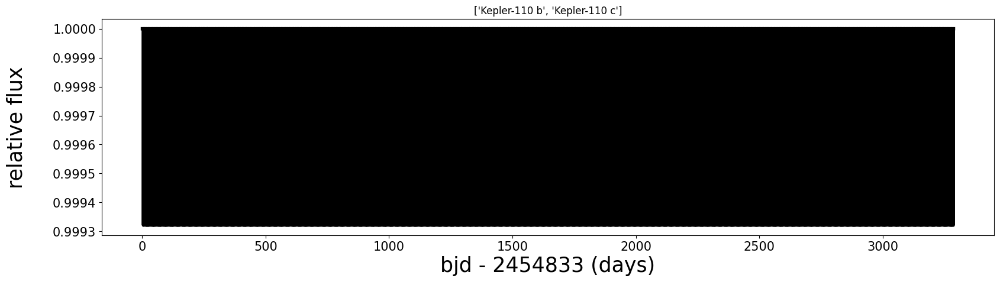

<Figure size 640x480 with 0 Axes>

0.012487366551724138
11.269540000000001 -2454830.231 None 3.341815 None 3.141592653589793 0.01 0.6 0.2 0.012487366551724138
0.0564745104
183.98749 -2454821.87 0.176 224.77833 -141.0 3.141592653589793 0.65 0.6 0.2 0.0564745104
['Kepler-111 b', 'Kepler-111 c']


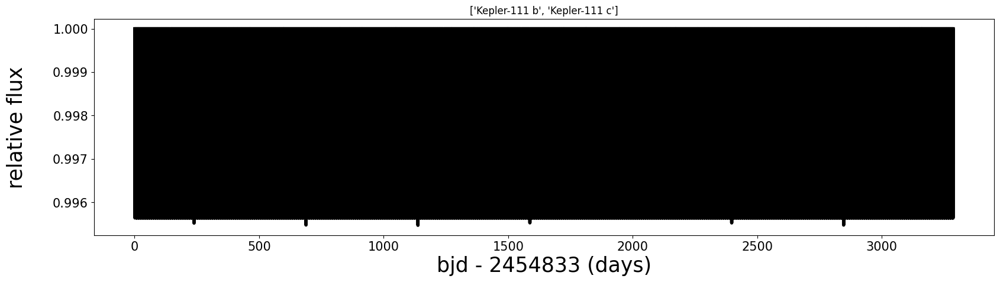

<Figure size 640x480 with 0 Axes>

0.017054339999999998
None -2454825.012 None 108.593329 None 3.141592653589793 None 0.6 0.2 0.017054339999999998
0.014449470652173911
151.722307 -2454824.004 0.0 199.66876 None 3.141592653589793 0.046 0.6 0.2 0.014449470652173911
['Kepler-1126 b', 'Kepler-1126 c']


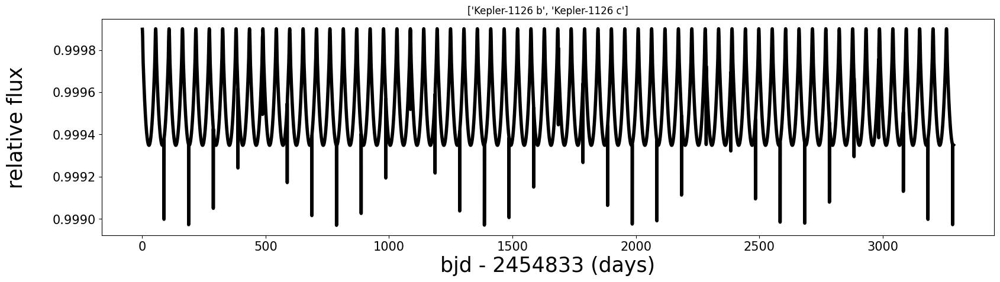

<Figure size 640x480 with 0 Axes>

0.027137102399999998
None -2454829.708 None 24.3397804 None 3.141592653589793 None 0.6 0.2 0.027137102399999998
0.025028476199999997
None -2454827.307 None 76.5369586 None 3.141592653589793 None 0.6 0.2 0.025028476199999997
['Kepler-1129 b', 'Kepler-1129 c']


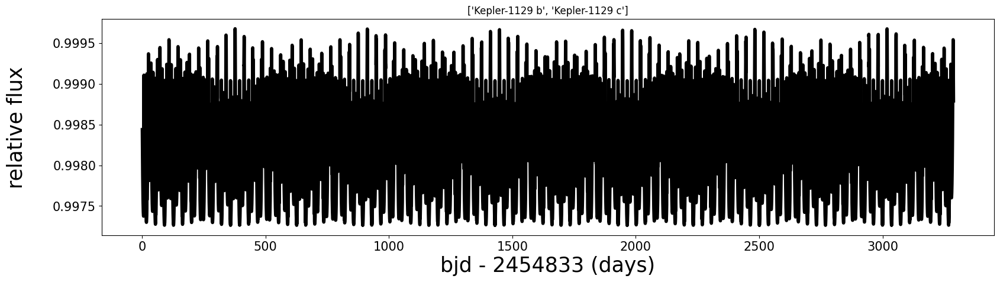

<Figure size 640x480 with 0 Axes>

0.024182102608695653
None None None 4.754 None 3.141592653589793 0.08 0.6 0.2 0.024182102608695653
0.028965375652173914
None None None 8.92507 None 3.141592653589793 0.56 0.6 0.2 0.028965375652173914
['Kepler-113 b', 'Kepler-113 c']


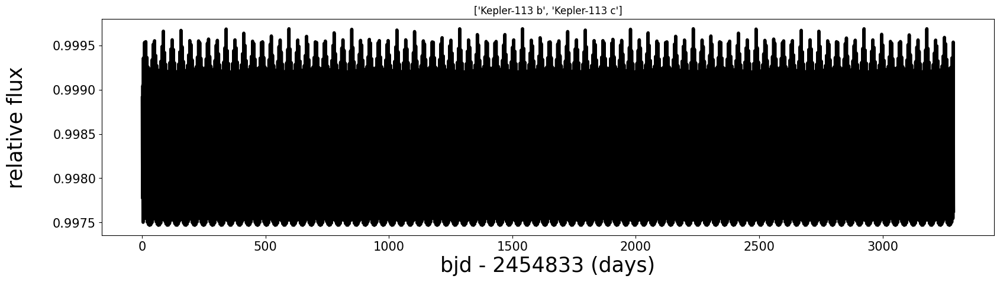

<Figure size 640x480 with 0 Axes>

0.019883714025974022
None -2454831.4462 None 2.88890485 None 3.141592653589793 None 0.6 0.2 0.019883714025974022
0.042863096103896096
None -2454824.325 None 210.630591 None 3.141592653589793 None 0.6 0.2 0.042863096103896096
['Kepler-1143 b', 'Kepler-1143 c']


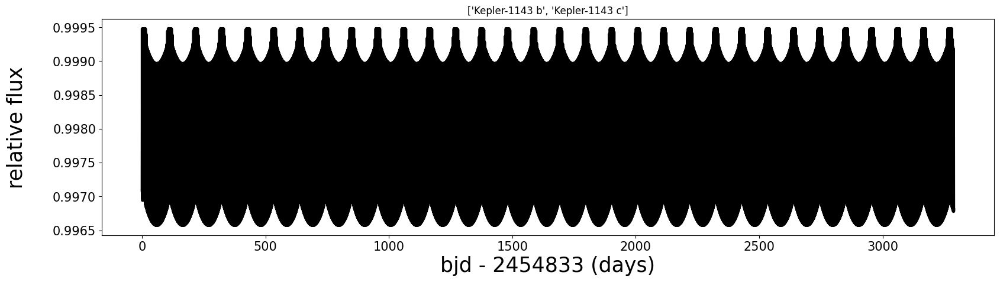

<Figure size 640x480 with 0 Axes>

0.015002083636363635
None -2454828.924 None 5.1856142 None 3.141592653589793 None 0.6 0.2 0.015002083636363635
0.015130306573426573
None -2454829.932 None 8.45808312 None 3.141592653589793 None 0.6 0.2 0.015130306573426573
['Kepler-1154 b', 'Kepler-1154 c']


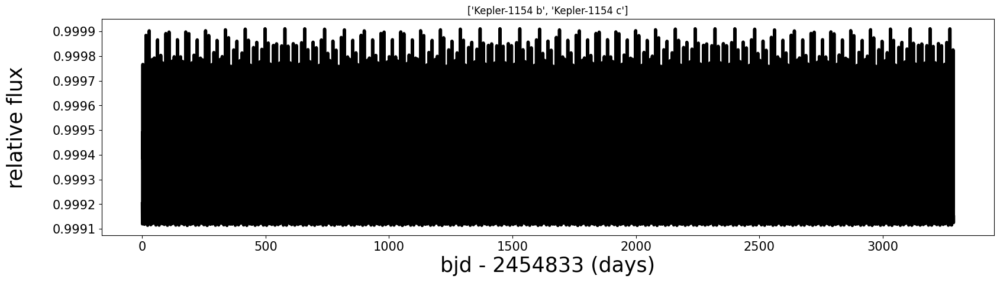

<Figure size 640x480 with 0 Axes>

0.02412041357142857
None -2454827.452 None 32.5637069 None 3.141592653589793 None 0.6 0.2 0.02412041357142857
0.01929531558139535
69.381168 -2454827.58 0.0 59.284064 None 3.141592653589793 0.556 0.6 0.2 0.01929531558139535
['Kepler-1162 b', 'Kepler-1162 c']


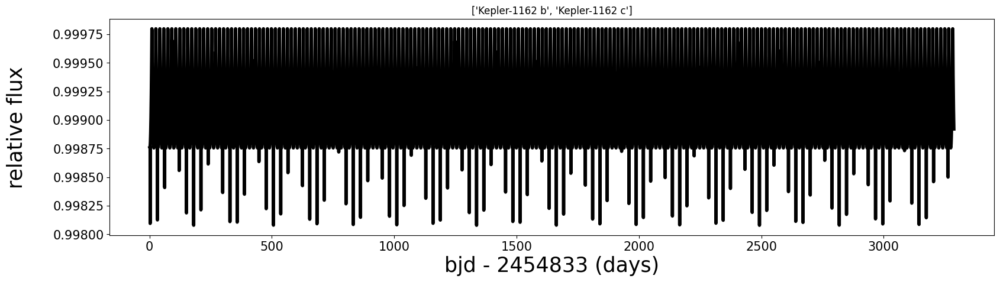

<Figure size 640x480 with 0 Axes>

0.012042633050847457
None -2454826.777 None 9.478522 None 3.141592653589793 None 0.6 0.2 0.012042633050847457
0.02853096883333333
None None None 29.96870041 None 3.141592653589793 None 0.6 0.2 0.02853096883333333
['Kepler-1165 b', 'Kepler-1165 c']


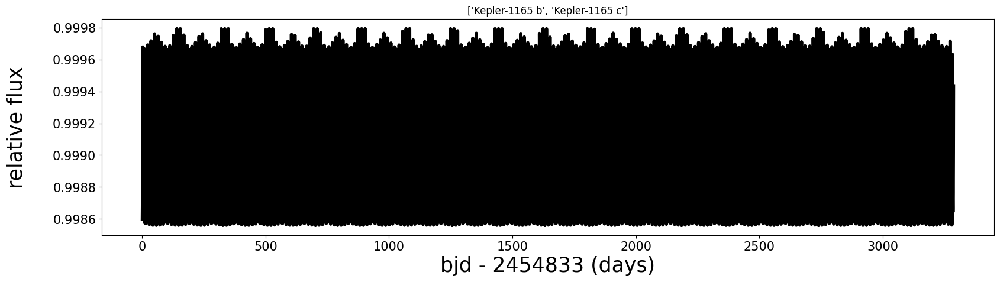

<Figure size 640x480 with 0 Axes>

0.04589094935403726
35.401055 -2454825.742 0.0493 18.7959228 254.3 3.141592653589793 0.446 0.6 0.2 0.04589094935403726
0.07027425313043477
68.695196 -2454822.117 0.0323 50.790391 305.0 3.141592653589793 0.268 0.6 0.2 0.07027425313043477
['Kepler-117 b', 'Kepler-117 c']


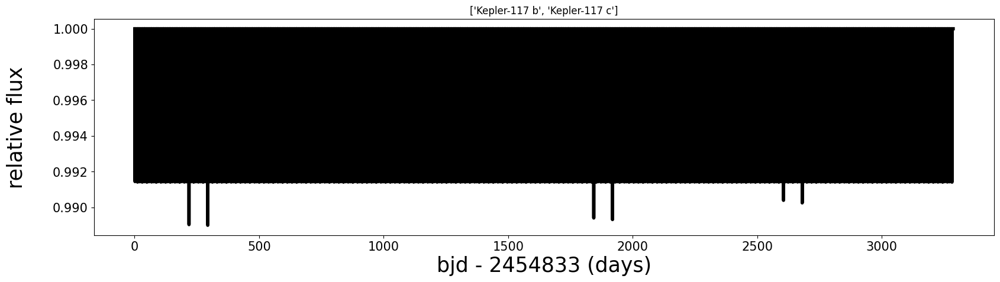

<Figure size 640x480 with 0 Axes>

0.011072050615384615
None -2454829.684 None 4.89337519 None 3.141592653589793 None 0.6 0.2 0.011072050615384615
0.012427651999999999
22.735072 -2454830.421 0.0 8.93484887 None 3.141592653589793 0.888 0.6 0.2 0.012427651999999999
['Kepler-1181 b', 'Kepler-1181 c']


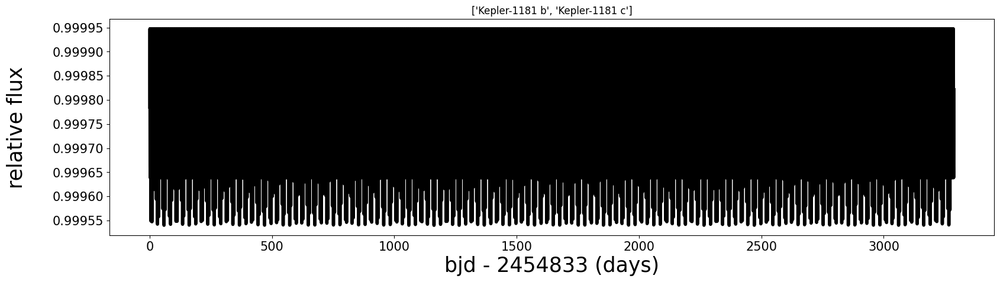

<Figure size 640x480 with 0 Axes>

0.03929117142857143
8.574650000000002 -2454830.426 None 2.422082 None 3.141592653589793 0.3 0.6 0.2 0.03929117142857143
0.010041077142857143
12.004510000000002 -2454830.16 None 4.125103 None 3.141592653589793 0.51 0.6 0.2 0.010041077142857143
['Kepler-119 b', 'Kepler-119 c']


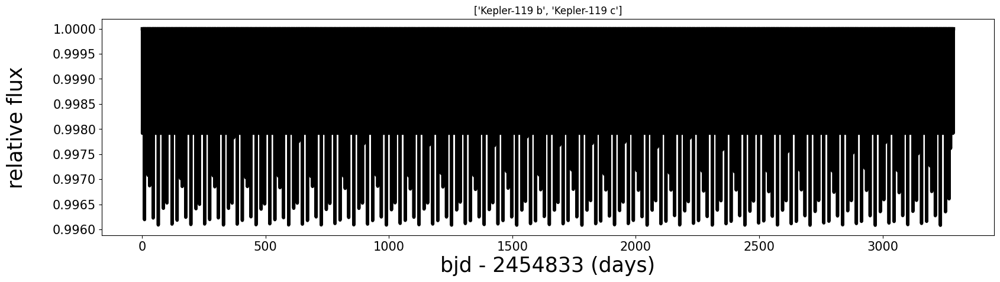

<Figure size 640x480 with 0 Axes>

0.03719069999999999
13.474450000000001 -2454830.092 None 6.312501 None 3.141592653589793 0.79 0.6 0.2 0.03719069999999999
0.02646594
21.55912 -2454829.55 None 12.794585 None 3.141592653589793 0.41 0.6 0.2 0.02646594
['Kepler-120 b', 'Kepler-120 c']


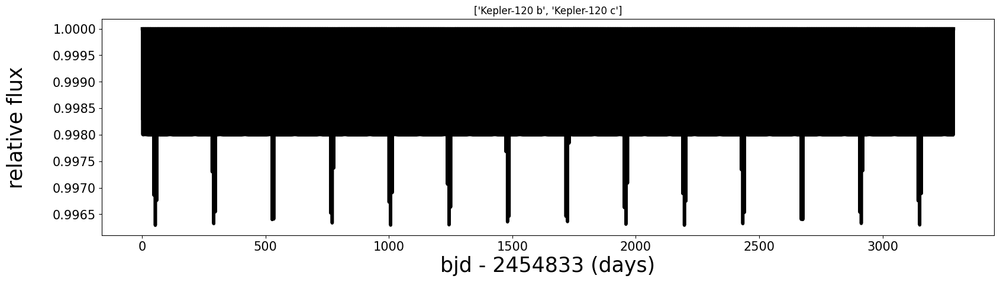

<Figure size 640x480 with 0 Axes>

0.030647113714285714
9.55461 -2454831.525 None 3.177422 None 3.141592653589793 0.11 0.6 0.2 0.030647113714285714
0.029730319714285712
52.91784 -2454829.022 None 41.008011 None 3.141592653589793 0.49 0.6 0.2 0.029730319714285712
['Kepler-121 b', 'Kepler-121 c']


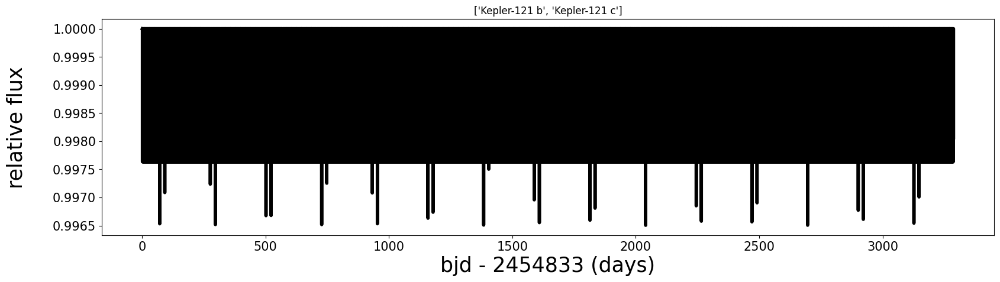

<Figure size 640x480 with 0 Axes>

0.02139186
33.07365 -2454828.434 None 17.232366 None 3.141592653589793 0.53 0.6 0.2 0.02139186
0.010768691428571429
44.34319 -2454828.471 None 26.695074 None 3.141592653589793 0.23 0.6 0.2 0.010768691428571429
['Kepler-123 b', 'Kepler-123 c']


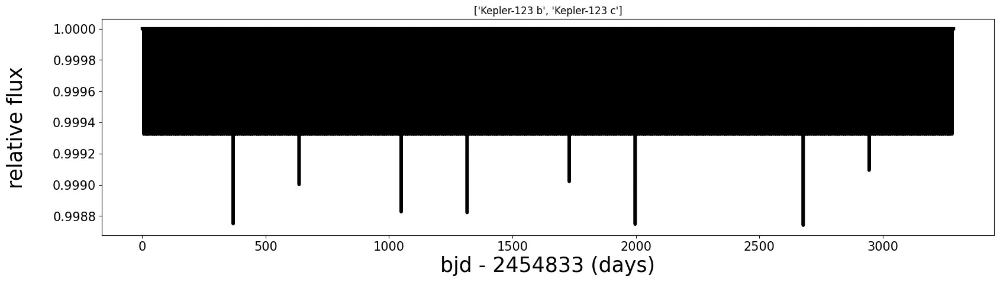

<Figure size 640x480 with 0 Axes>

0.01590582361445783
None -2454830.687 None 4.35409304 None 3.141592653589793 None 0.6 0.2 0.01590582361445783
0.01590582361445783
None -2454831.1481 None 2.93658468 None 3.141592653589793 None 0.6 0.2 0.01590582361445783
['Kepler-1245 b', 'Kepler-1245 c']


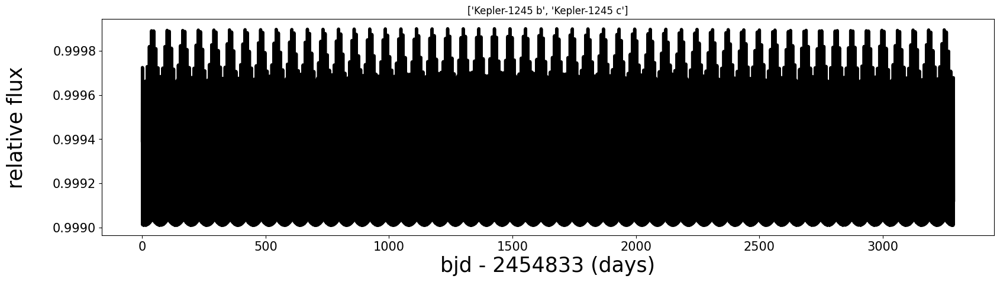

<Figure size 640x480 with 0 Axes>

0.031122743684210526
None -2454828.191 None 28.474748 None 3.141592653589793 None 0.6 0.2 0.031122743684210526
0.018556794216867466
None None None 4.86631012 None 3.141592653589793 None 0.6 0.2 0.018556794216867466
['Kepler-1266 b', 'Kepler-1266 c']


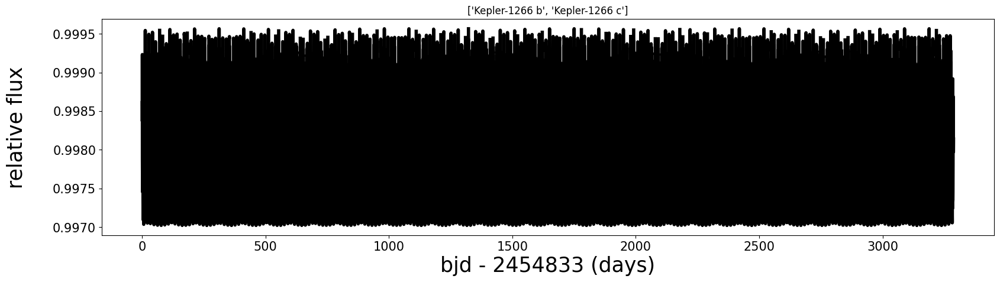

<Figure size 640x480 with 0 Axes>

0.008142952919254657
None None None 15.09 None 3.141592653589793 None 0.6 0.2 0.008142952919254657
0.0076304593788819874
None None None 22.804 None 3.141592653589793 None 0.6 0.2 0.0076304593788819874
['Kepler-128 b', 'Kepler-128 c']


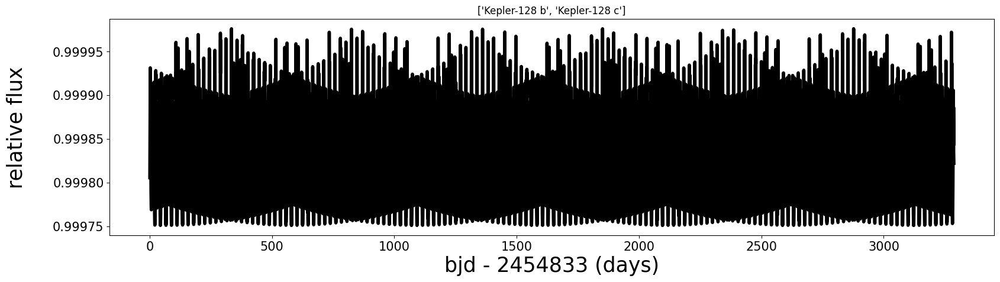

<Figure size 640x480 with 0 Axes>

0.013335185454545454
31.8487 None None 15.79 None 3.141592653589793 None 0.6 0.2 0.013335185454545454
0.014001944727272727
95.54610000000001 None None 82.2 None 3.141592653589793 None 0.6 0.2 0.014001944727272727
['Kepler-129 b', 'Kepler-129 c']


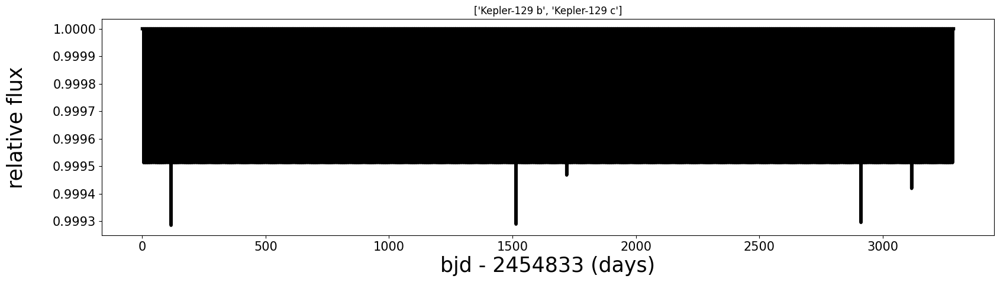

<Figure size 640x480 with 0 Axes>

0.02092681956521739
None -2454830.7749 None 5.44832529 None 3.141592653589793 None 0.6 0.2 0.02092681956521739
0.01034667514285714
None None None 1.11611998 None 3.141592653589793 None 0.6 0.2 0.01034667514285714
['Kepler-1312 b', 'Kepler-1312 c']


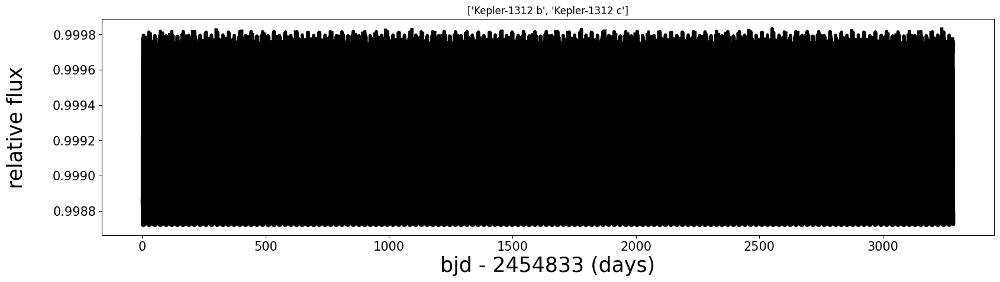

<Figure size 640x480 with 0 Axes>

0.0168690096
None -2454831.5638 None 0.84338011 None 3.141592653589793 None 0.6 0.2 0.0168690096
0.019657769023255816
None None None 6.56606007 None 3.141592653589793 None 0.6 0.2 0.019657769023255816
['Kepler-1315 b', 'Kepler-1315 c']


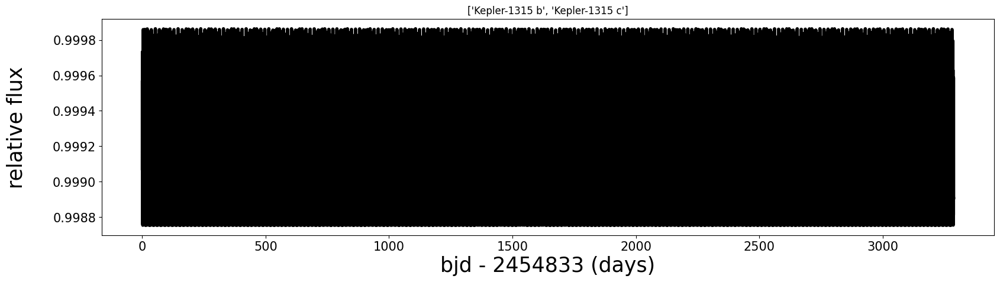

<Figure size 640x480 with 0 Axes>

0.016965957931034482
None -2454831.3753 None 0.96286738 None 3.141592653589793 None 0.6 0.2 0.016965957931034482
0.024696138374999996
None None None 6.45998001 None 3.141592653589793 None 0.6 0.2 0.024696138374999996
['Kepler-1322 b', 'Kepler-1322 c']


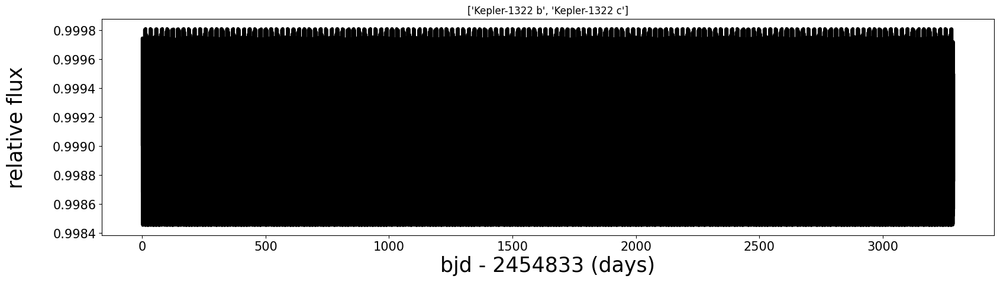

<Figure size 640x480 with 0 Axes>

0.013963477846153845
None -2454823.271 None 23.198681 None 3.141592653589793 None 0.6 0.2 0.013963477846153845
0.01205936723076923
None -2454830.577 None 5.77721211 None 3.141592653589793 None 0.6 0.2 0.01205936723076923
['Kepler-1336 b', 'Kepler-1336 c']


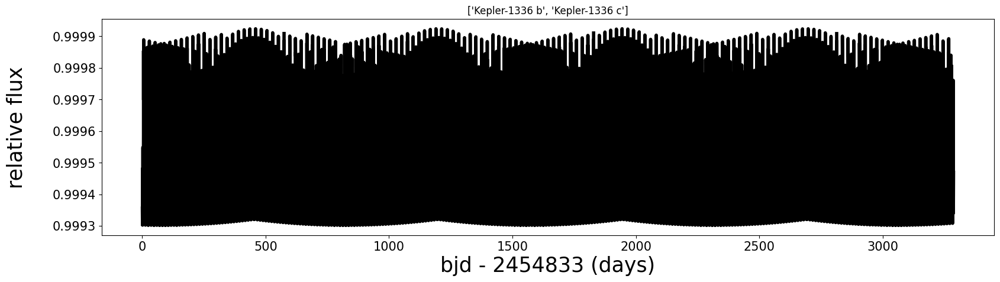

<Figure size 640x480 with 0 Axes>

0.015538881355932203
14.6994 -2454830.099 None 5.317429 None 3.141592653589793 0.12 0.6 0.2 0.015538881355932203
0.009789495254237288
22.539080000000002 -2454830.941 None 10.105785 None 3.141592653589793 0.14 0.6 0.2 0.009789495254237288
['Kepler-134 b', 'Kepler-134 c']


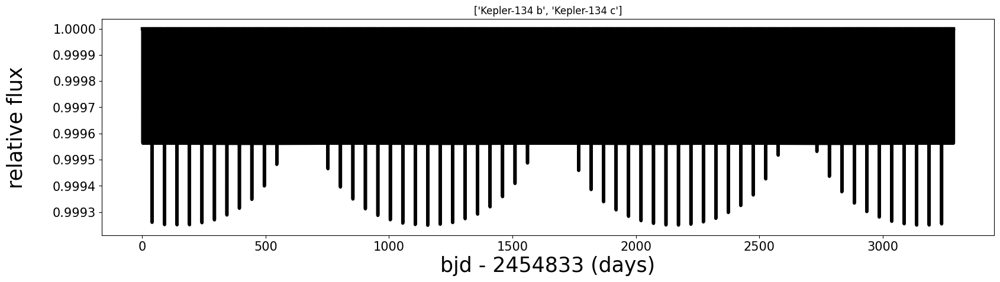

<Figure size 640x480 with 0 Axes>

0.04359096
None -2454831.2136 None 4.4968604 None 3.141592653589793 None 0.6 0.2 0.04359096
0.029925539999999997
None -2454831.6605 None 1.76678906 None 3.141592653589793 None 0.6 0.2 0.029925539999999997
['Kepler-1350 b', 'Kepler-1350 c']


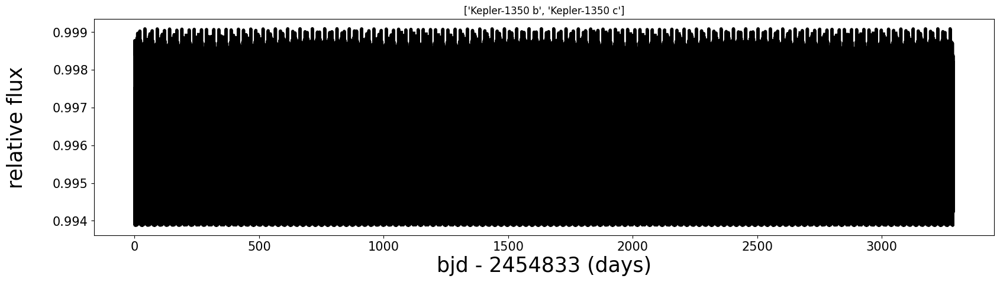

<Figure size 640x480 with 0 Axes>

0.008032861714285714
None -2454828.61 None 7.69993485 None 3.141592653589793 None 0.6 0.2 0.008032861714285714
0.006985097142857142
None -2454829.191 None 4.77468005 None 3.141592653589793 None 0.6 0.2 0.006985097142857142
['Kepler-1365 b', 'Kepler-1365 c']


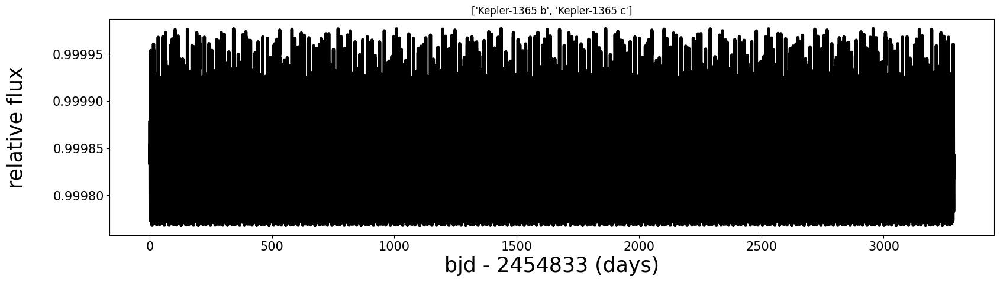

<Figure size 640x480 with 0 Axes>

0.013076751627906977
None -2454828.715 None 20.2641684 None 3.141592653589793 None 0.6 0.2 0.013076751627906977
0.009025801395348837
None -2454828.269 None 7.44142113 None 3.141592653589793 None 0.6 0.2 0.009025801395348837
['Kepler-1370 b', 'Kepler-1370 c']


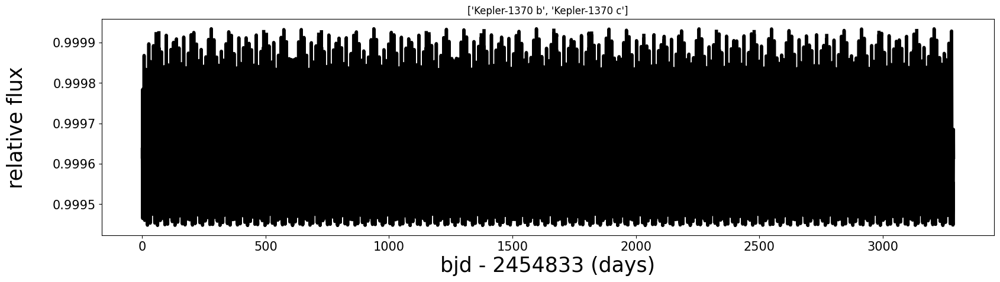

<Figure size 640x480 with 0 Axes>

0.008063368915662651
None -2454830.999 None 3.4462039 None 3.141592653589793 None 0.6 0.2 0.008063368915662651
0.007069254939759036
None -2454831.202 None 2.00541269 None 3.141592653589793 None 0.6 0.2 0.007069254939759036
['Kepler-1371 b', 'Kepler-1371 c']


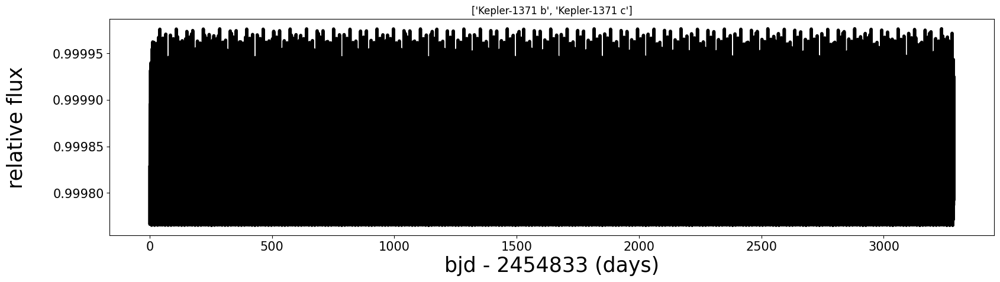

<Figure size 640x480 with 0 Axes>

0.006992496610169492
None -2454829.674 None 2.78815679 None 3.141592653589793 None 0.6 0.2 0.006992496610169492
0.008002523898305086
None -2454829.551 None 4.13827595 None 3.141592653589793 None 0.6 0.2 0.008002523898305086
['Kepler-1398 b', 'Kepler-1398 c']


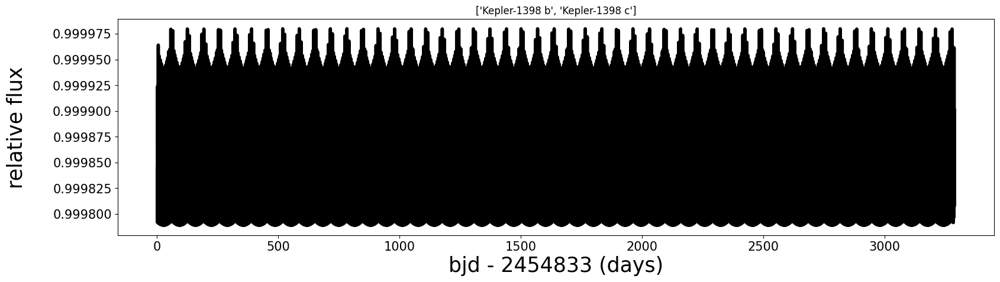

<Figure size 640x480 with 0 Axes>

0.011442157674418604
11.02455 -2454830.022 None 3.25427 None 3.141592653589793 0.05 0.6 0.2 0.011442157674418604
0.01279247441860465
101.42586 -2454825.081 None 91.353282 None 3.141592653589793 0.13 0.6 0.2 0.01279247441860465
['Kepler-140 b', 'Kepler-140 c']


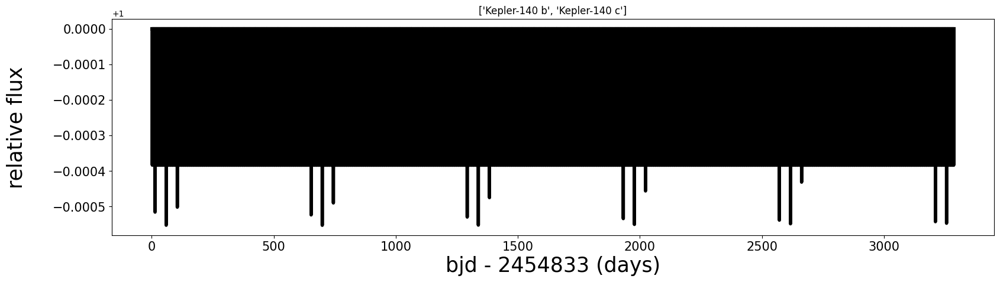

<Figure size 640x480 with 0 Axes>

0.008007441265822783
9.55461 -2454830.782 None 3.107675 None 3.141592653589793 0.54 0.6 0.2 0.008007441265822783
0.01636303215189873
16.414330000000003 -2454830.014 None 7.010606 None 3.141592653589793 0.31 0.6 0.2 0.01636303215189873
['Kepler-141 b', 'Kepler-141 c']


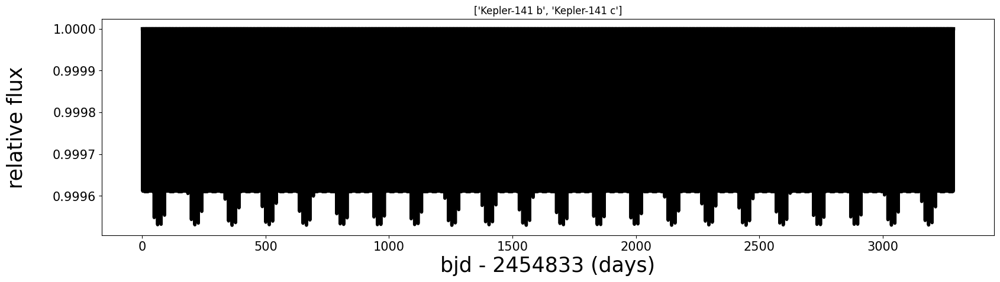

<Figure size 640x480 with 0 Axes>

0.016246128970588233
31.11373 -2454831.867 None 16.007583 None 3.141592653589793 0.79 0.6 0.2 0.016246128970588233
0.022717616029411764
44.34319 -2454827.897 None 27.082511 None 3.141592653589793 0.89 0.6 0.2 0.022717616029411764
['Kepler-143 b', 'Kepler-143 c']


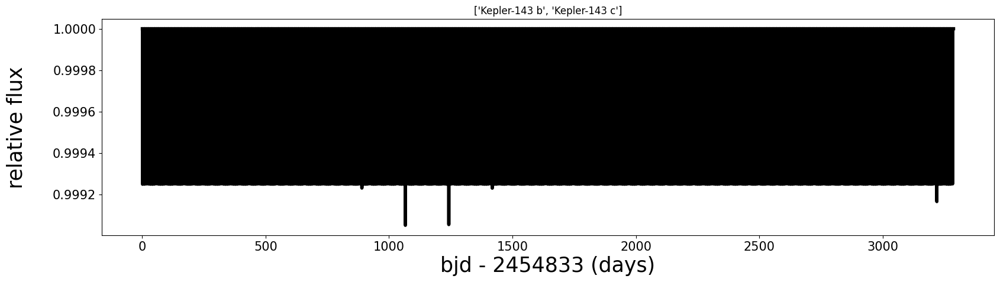

<Figure size 640x480 with 0 Axes>

0.009833355
16.169340000000002 -2454831.127 None 5.885273 None 3.141592653589793 0.34 0.6 0.2 0.009833355
0.009981225
23.02906 -2454830.722 None 10.104665 None 3.141592653589793 0.25 0.6 0.2 0.009981225
['Kepler-144 b', 'Kepler-144 c']


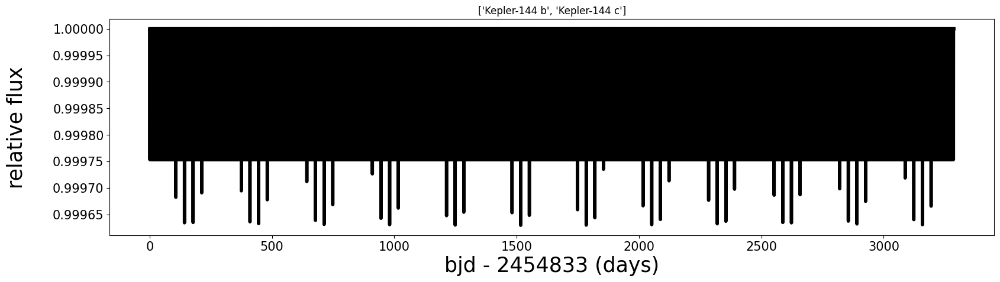

<Figure size 640x480 with 0 Axes>

0.013132454594594592
None None None 22.951 None 3.141592653589793 None 0.6 0.2 0.013132454594594592
0.02140837881081081
None None None 42.882 None 3.141592653589793 None 0.6 0.2 0.02140837881081081
['Kepler-145 b', 'Kepler-145 c']


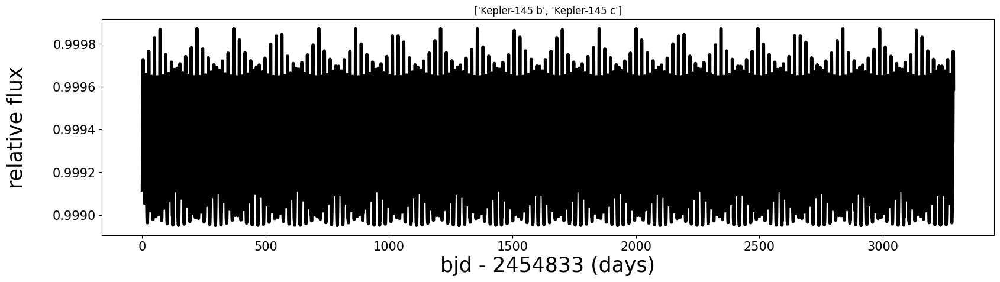

<Figure size 640x480 with 0 Axes>

0.015068099405940592
None -2454824.944 None 31.7785901 None 3.141592653589793 None 0.6 0.2 0.015068099405940592
0.009077168316831682
None -2454828.322 None 5.32786292 None 3.141592653589793 None 0.6 0.2 0.009077168316831682
['Kepler-1464 b', 'Kepler-1464 c']


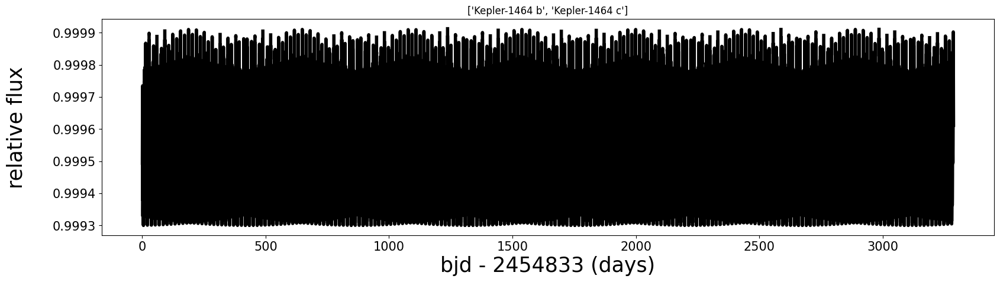

<Figure size 640x480 with 0 Axes>

0.013899779999999997
None -2454830.787 None 3.63899398 None 3.141592653589793 None 0.6 0.2 0.013899779999999997
0.014731390769230768
24.033519000000002 -2454829.591 0.0 11.6044881 None 3.141592653589793 0.118 0.6 0.2 0.014731390769230768
['Kepler-1471 b', 'Kepler-1471 c']


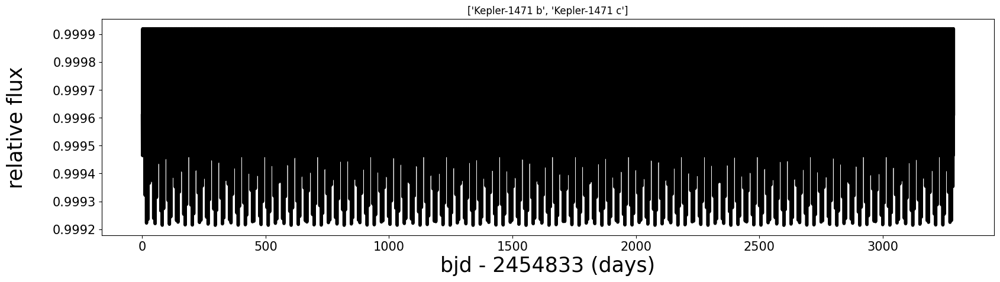

<Figure size 640x480 with 0 Axes>

0.011980191533742331
None -2454828.161 None 7.31946363 None 3.141592653589793 None 0.6 0.2 0.011980191533742331
0.018451636818181818
63.403411999999996 -2454824.781 0.0 35.8007112 None 3.141592653589793 0.043 0.6 0.2 0.018451636818181818
['Kepler-1487 b', 'Kepler-1487 c']


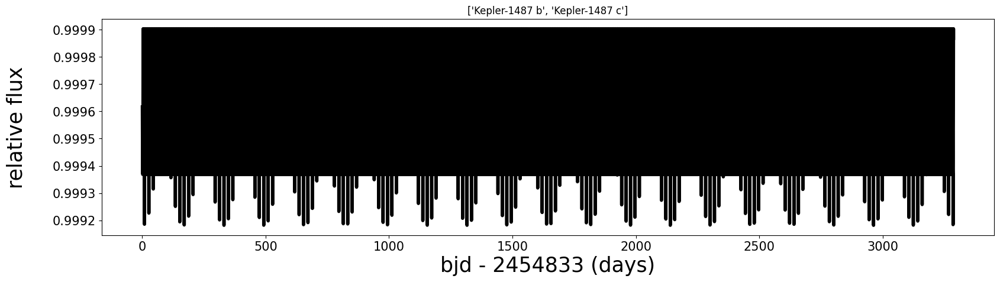

<Figure size 640x480 with 0 Axes>

0.013017075114503816
None -2454822.202 None 39.8189932 None 3.141592653589793 None 0.6 0.2 0.013017075114503816
0.009964103210526315
None None None 6.15826988 None 3.141592653589793 None 0.6 0.2 0.009964103210526315
['Kepler-1488 b', 'Kepler-1488 c']


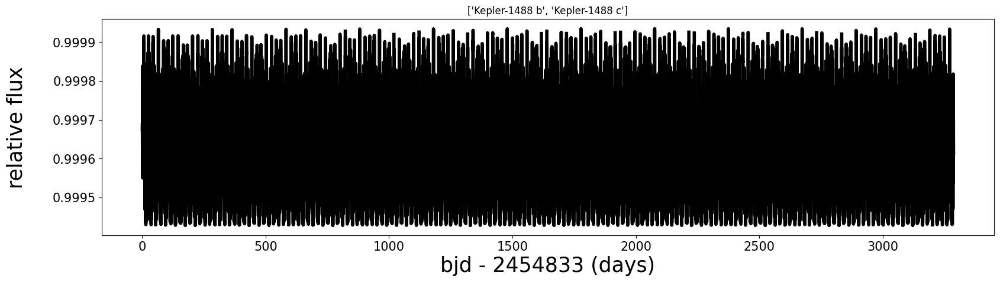

<Figure size 640x480 with 0 Axes>

0.013983423636363635
None -2454826.101 None 16.5861762 None 3.141592653589793 None 0.6 0.2 0.013983423636363635
0.016093362302158274
74.599455 -2454823.25 0.0 61.569765 None 3.141592653589793 0.486 0.6 0.2 0.016093362302158274
['Kepler-1491 b', 'Kepler-1491 c']


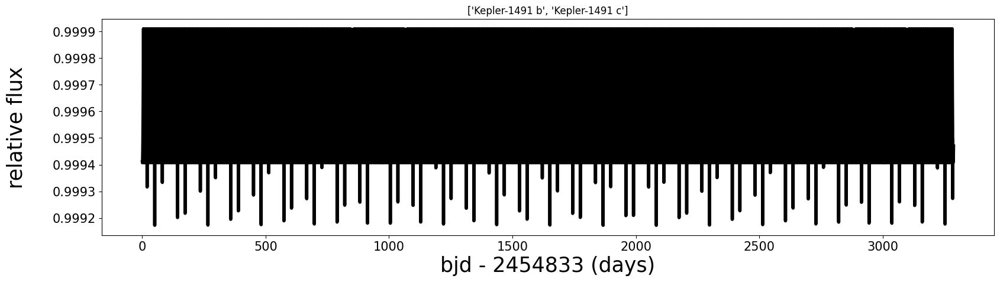

<Figure size 640x480 with 0 Axes>

0.08293608037894737
None None 0.306 160.8842 259.0 3.141592653589793 0.106 0.6 0.2 0.08293608037894737
None
None None 0.125 841.4 313.0 3.141592653589793 None 0.6 0.2 None
['Kepler-1513 b', 'Kepler-1513 c']


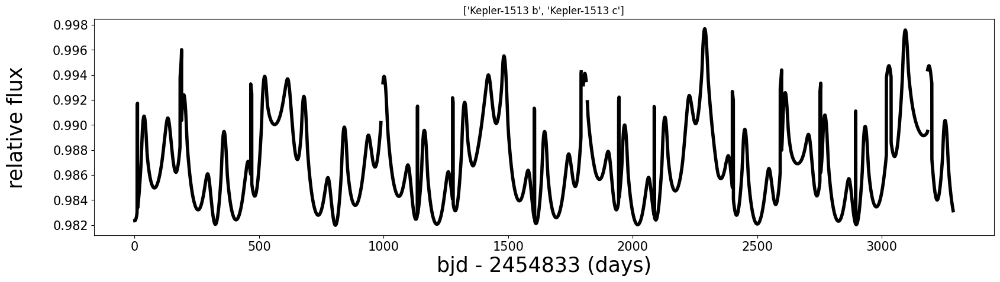

<Figure size 640x480 with 0 Axes>

0.08826807348837208
184.47747 -2454811.67312 0.401 217.83184 -75.28 3.141592653589793 0.169 0.6 0.2 0.08826807348837208
0.008357749953488371
24.425503 -2454829.2392 0.32 10.514181 0.0 3.141592653589793 0.47 0.6 0.2 0.008357749953488371
['Kepler-1514 b', 'Kepler-1514 c']


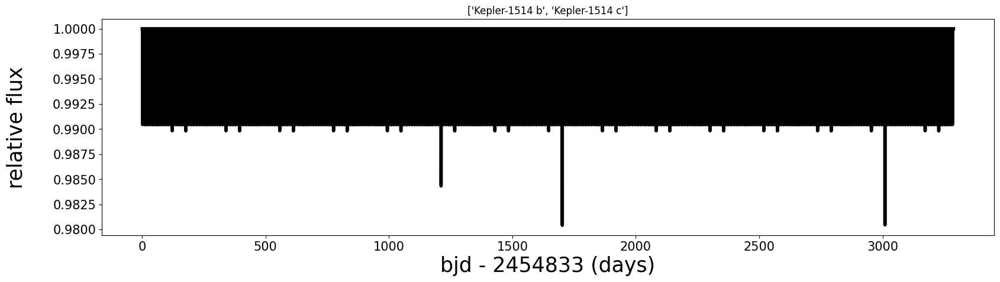

<Figure size 640x480 with 0 Axes>

0.014873519680851063
None -2454830.04 None 5.11177904 None 3.141592653589793 None 0.6 0.2 0.014873519680851063
0.019841064179104476
22.171595 -2454827.745 0.0 9.6310258 None 3.141592653589793 0.951 0.6 0.2 0.019841064179104476
['Kepler-1518 b', 'Kepler-1518 c']


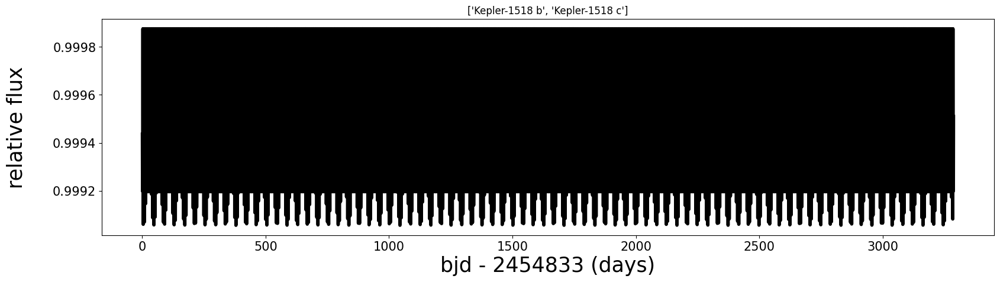

<Figure size 640x480 with 0 Axes>

0.0355257675
30.37876 -2454829.244 None 18.207973 None 3.141592653589793 0.03 0.6 0.2 0.0355257675
0.0304324675
87.21644 -2454828.964 None 88.255055 None 3.141592653589793 0.25 0.6 0.2 0.0304324675
['Kepler-152 b', 'Kepler-152 c']


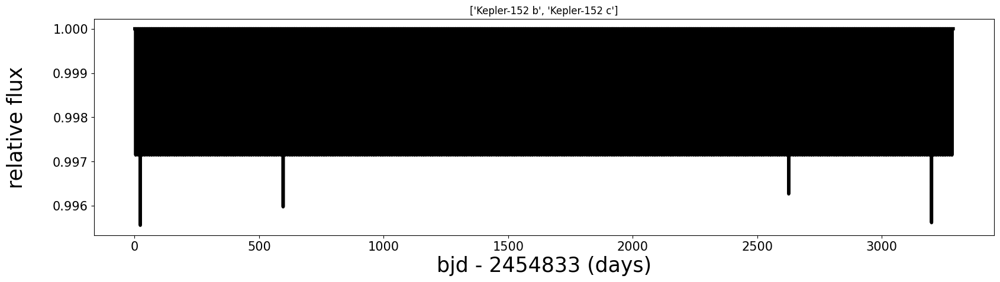

<Figure size 640x480 with 0 Axes>

0.030904829999999994
13.71944 -2454830.629 None 5.931194 None 3.141592653589793 0.67 0.6 0.2 0.030904829999999994
0.03312288
59.28758 -2454829.812 None 52.661793 None 3.141592653589793 0.78 0.6 0.2 0.03312288
['Kepler-155 b', 'Kepler-155 c']


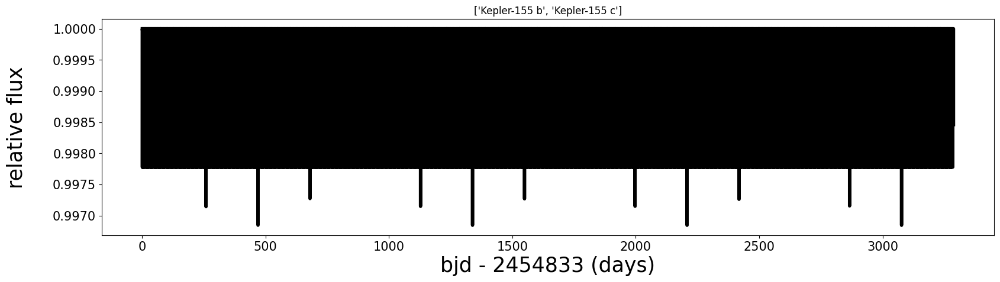

<Figure size 640x480 with 0 Axes>

0.02603242222222222
13.22946 -2454831.421 None 4.973456 None 3.141592653589793 0.69 0.6 0.2 0.02603242222222222
0.02886203333333333
28.663830000000004 -2454829.016 None 15.906801 None 3.141592653589793 0.64 0.6 0.2 0.02886203333333333
['Kepler-156 b', 'Kepler-156 c']


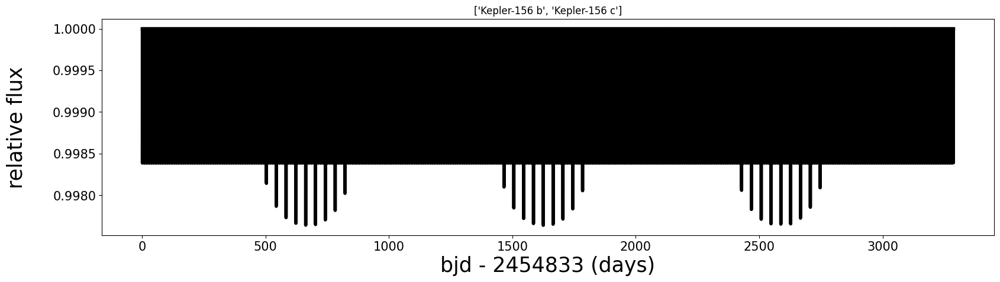

<Figure size 640x480 with 0 Axes>

0.03134844
27.19389 -2454830.235 None 16.709184 None 3.141592653589793 0.86 0.6 0.2 0.03134844
0.028095299999999997
38.708420000000004 -2454828.752 None 28.551383 None 3.141592653589793 0.61 0.6 0.2 0.028095299999999997
['Kepler-158 b', 'Kepler-158 c']


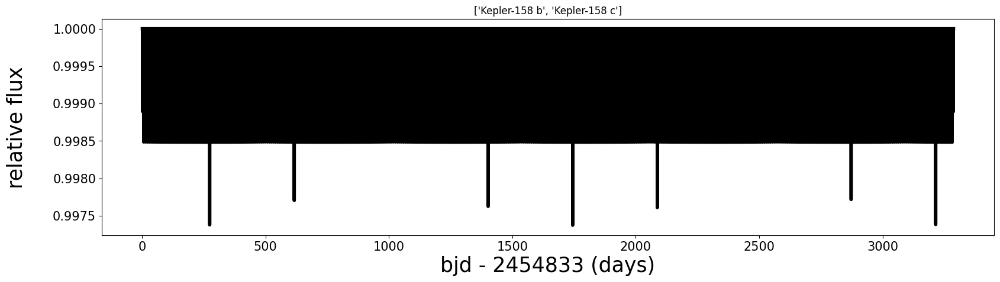

<Figure size 640x480 with 0 Axes>

0.03306014727272726
20.089180000000002 -2454830.308 None 10.139623 None 3.141592653589793 0.68 0.6 0.2 0.03306014727272726
0.04736769
53.40782 -2454827.847 None 43.595792 None 3.141592653589793 0.78 0.6 0.2 0.04736769
['Kepler-159 b', 'Kepler-159 c']


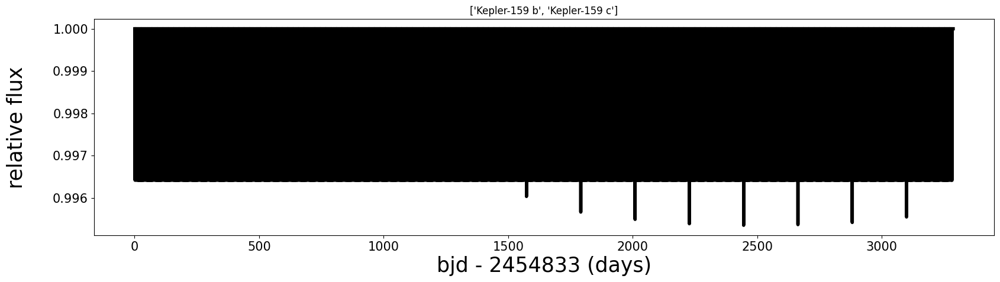

<Figure size 640x480 with 0 Axes>

0.03499469780487805
None -2454822.05 None 386.370548 None 3.141592653589793 None 0.6 0.2 0.03499469780487805
0.021450770457831326
None None None 7.29804993 None 3.141592653589793 None 0.6 0.2 0.021450770457831326
['Kepler-1600 b', 'Kepler-1600 c']


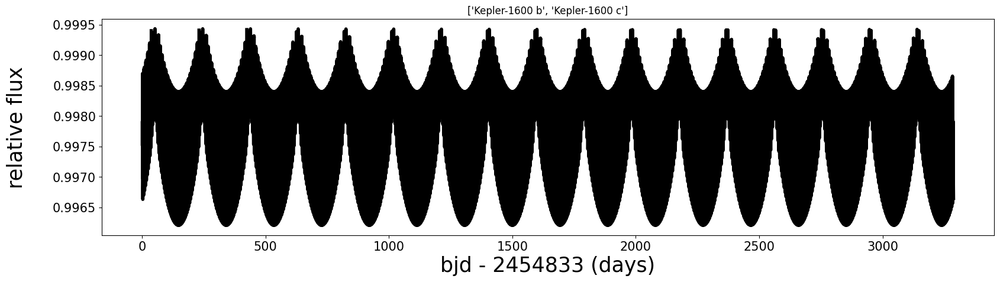

<Figure size 640x480 with 0 Axes>

0.016965957931034482
None -2454829.981 None 8.70181574 None 3.141592653589793 None 0.6 0.2 0.016965957931034482
0.023951243249999997
56.911177 -2454828.836 0.0 44.9851885 None 3.141592653589793 0.664 0.6 0.2 0.023951243249999997
['Kepler-1610 b', 'Kepler-1610 c']


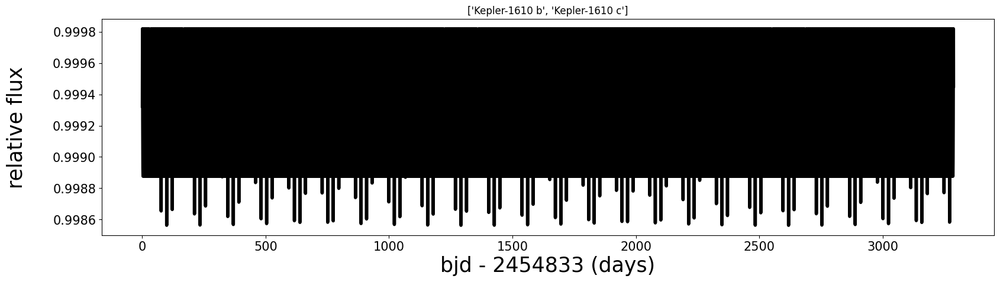

<Figure size 640x480 with 0 Axes>

0.012032921249999998
16.904310000000002 -2454829.661 None 6.919798 None 3.141592653589793 0.27 0.6 0.2 0.012032921249999998
0.028936310625
33.56363 -2454829.473 None 19.446355 None 3.141592653589793 0.54 0.6 0.2 0.028936310625
['Kepler-162 b', 'Kepler-162 c']


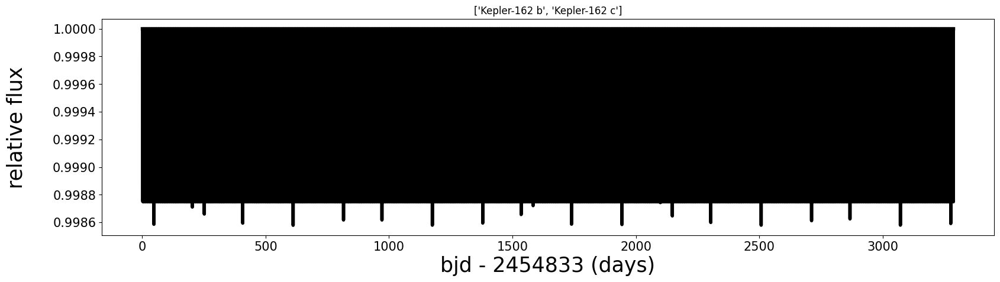

<Figure size 640x480 with 0 Axes>

0.010463409782608695
19.10922 -2454829.641 None 7.810937 None 3.141592653589793 0.55 0.6 0.2 0.010463409782608695
0.022521243913043474
37.23848 -2454829.235 None 21.347262 None 3.141592653589793 0.15 0.6 0.2 0.022521243913043474
['Kepler-163 b', 'Kepler-163 c']


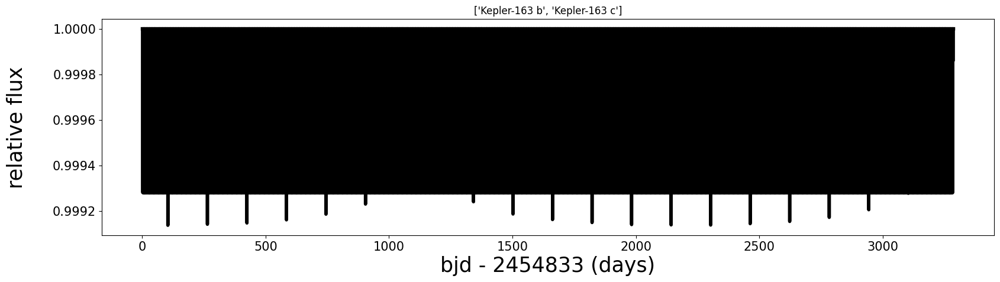

<Figure size 640x480 with 0 Axes>

0.023959910420168064
None -2454828.234 None 19.672266 None 3.141592653589793 None 0.6 0.2 0.023959910420168064
0.022727246218487394
None -2454827.018 None 32.657212 None 3.141592653589793 None 0.6 0.2 0.022727246218487394
['Kepler-1641 b', 'Kepler-1641 c']


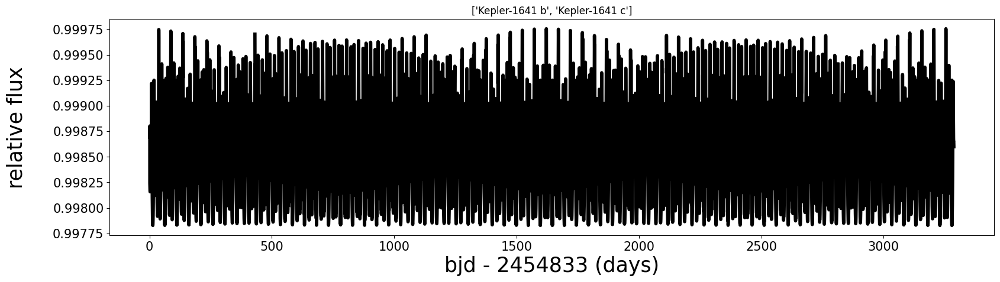

<Figure size 640x480 with 0 Axes>

0.03492548571428571
None -2454830.546 None 12.2057513 None 3.141592653589793 None 0.6 0.2 0.03492548571428571
0.02903181
None -2454830.8644 None 6.6513802 None 3.141592653589793 None 0.6 0.2 0.02903181
['Kepler-1642 b', 'Kepler-1642 c']


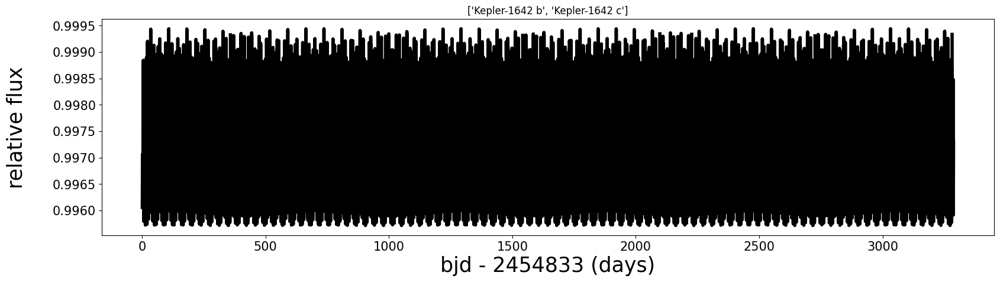

<Figure size 640x480 with 0 Axes>

0.04053823904347825
None -2454831.816 None 8.689099 None 3.141592653589793 0.65 0.6 0.2 0.04053823904347825
0.0422522452173913
None -2454831.93 None 19.53527 None 3.141592653589793 0.875 0.6 0.2 0.0422522452173913
['Kepler-1649 b', 'Kepler-1649 c']


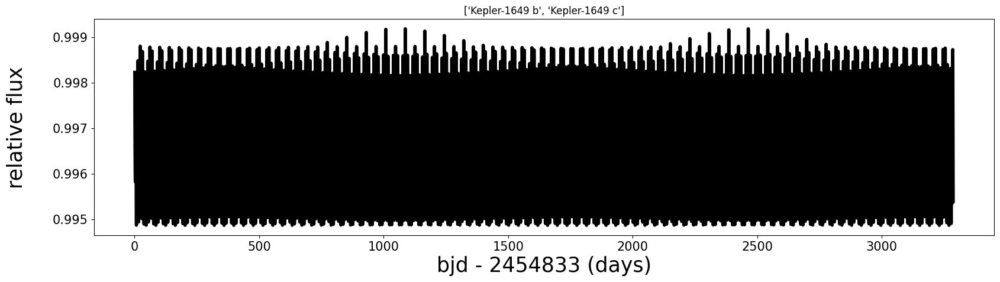

<Figure size 640x480 with 0 Axes>

0.022983626973913044
None None None 25.8476 None 3.141592653589793 None 0.6 0.2 0.022983626973913044
0.02579778594782609
None None None 40.7157 None 3.141592653589793 None 0.6 0.2 0.02579778594782609
['Kepler-1666 b', 'Kepler-1666 c']


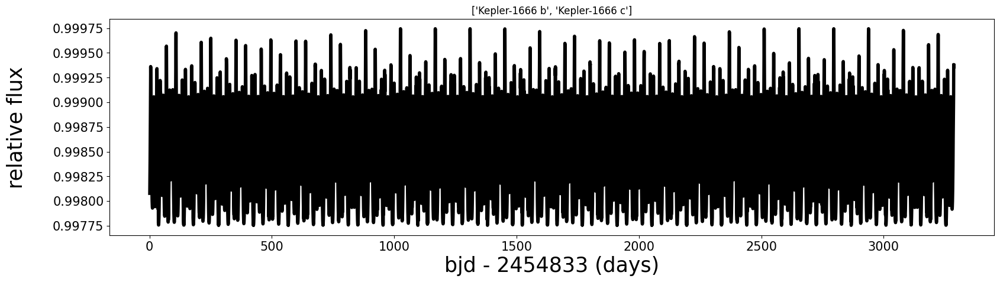

<Figure size 640x480 with 0 Axes>

0.01205873189189189
13.71944 -2454829.486 None 4.425391 None 3.141592653589793 0.18 0.6 0.2 0.01205873189189189
0.022217800540540535
28.418840000000003 -2454828.064 None 13.193242 None 3.141592653589793 0.02 0.6 0.2 0.022217800540540535
['Kepler-168 b', 'Kepler-168 c']


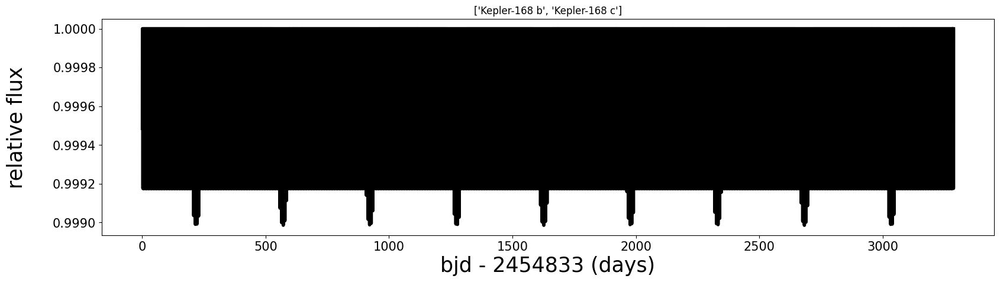

<Figure size 640x480 with 0 Axes>

0.013428948477272724
None None None 12.0999 None 3.141592653589793 None 0.6 0.2 0.013428948477272724
0.008142797618181817
None None None 5.36370993 None 3.141592653589793 None 0.6 0.2 0.008142797618181817
['Kepler-1693 b', 'Kepler-1693 c']


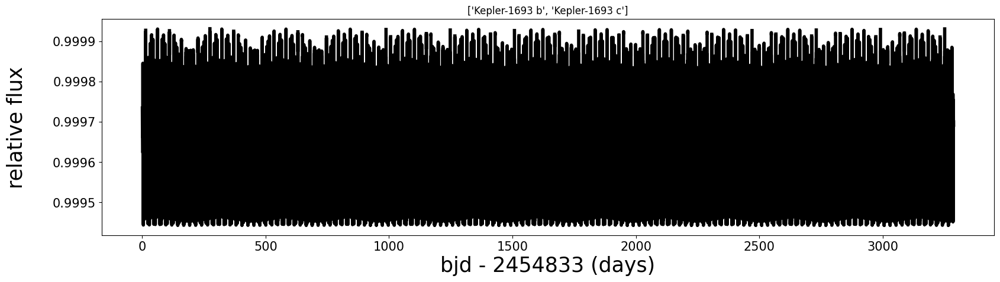

<Figure size 640x480 with 0 Axes>

0.014770569999999997
None None 0.033 9.03502 35.0 3.141592653589793 0.32 0.6 0.2 0.014770569999999997
0.014916092857142854
None None 0.028 11.28 -38.0 3.141592653589793 0.34 0.6 0.2 0.014916092857142854
['Kepler-1705 b', 'Kepler-1705 c']


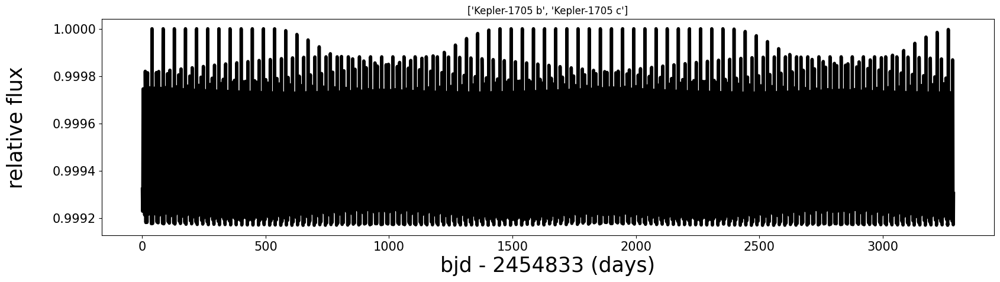

<Figure size 640x480 with 0 Axes>

0.01244909747368421
11.75952 -2454830.739 None 4.263742 None 3.141592653589793 0.25 0.6 0.2 0.01244909747368421
0.023450625473684213
18.12926 -2454829.871 None 8.005777 None 3.141592653589793 0.37 0.6 0.2 0.023450625473684213
['Kepler-173 b', 'Kepler-173 c']


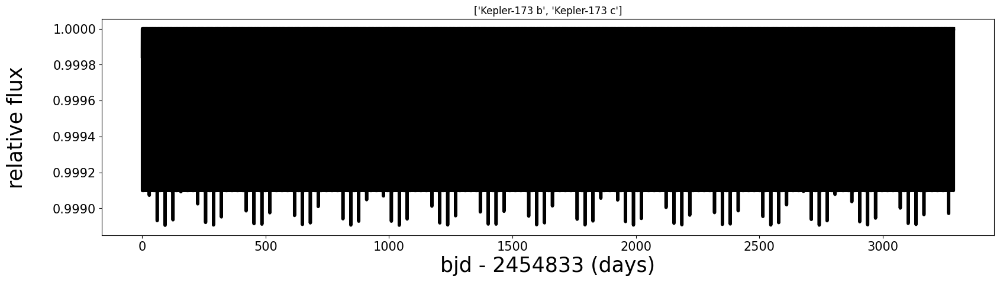

<Figure size 640x480 with 0 Axes>

0.023237550891089108
25.72395 -2454828.785 None 11.903515 None 3.141592653589793 0.09 0.6 0.2 0.023237550891089108
0.028139221782178217
52.18287 -2454825.943 None 34.035257 None 3.141592653589793 0.85 0.6 0.2 0.028139221782178217
['Kepler-175 b', 'Kepler-175 c']


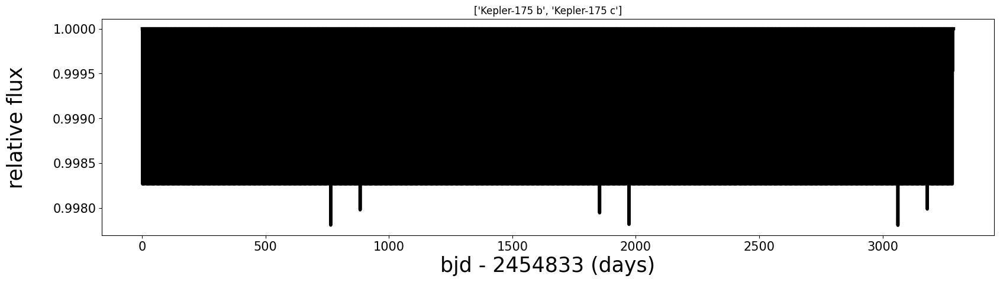

<Figure size 640x480 with 0 Axes>

0.024308931818181816
None None 0.0 36.8601 None 3.141592653589793 None 0.6 0.2 0.024308931818181816
0.06063342136363636
None -2454827.757 0.0 49.40926 None 3.141592653589793 0.8848 0.6 0.2 0.06063342136363636
['Kepler-177 b', 'Kepler-177 c']


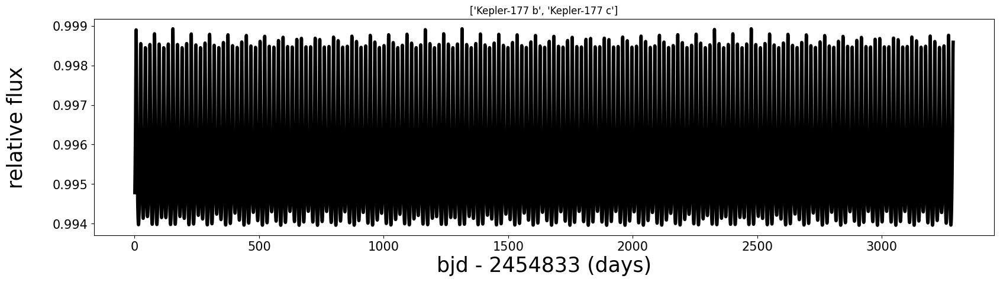

<Figure size 640x480 with 0 Axes>

0.019783449473684208
8.81964 -2454831.013 None 2.735926 None 3.141592653589793 0.57 0.6 0.2 0.019783449473684208
0.024126157894736842
15.67936 -2454831.158 None 6.40013 None 3.141592653589793 0.03 0.6 0.2 0.024126157894736842
['Kepler-179 b', 'Kepler-179 c']


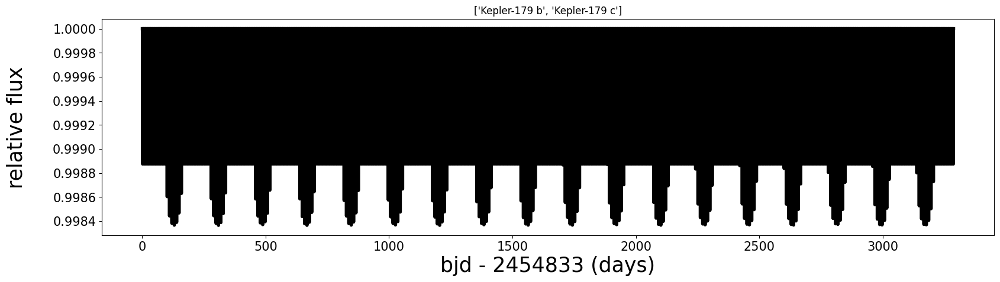

<Figure size 640x480 with 0 Axes>

0.02534280557142857
None None None 10.44089985 None 3.141592653589793 None 0.6 0.2 0.02534280557142857
0.027223168775510204
112.009428 -2454827.2 0.0 116.583183 None 3.141592653589793 0.586 0.6 0.2 0.027223168775510204
['Kepler-1801 b', 'Kepler-1801 c']


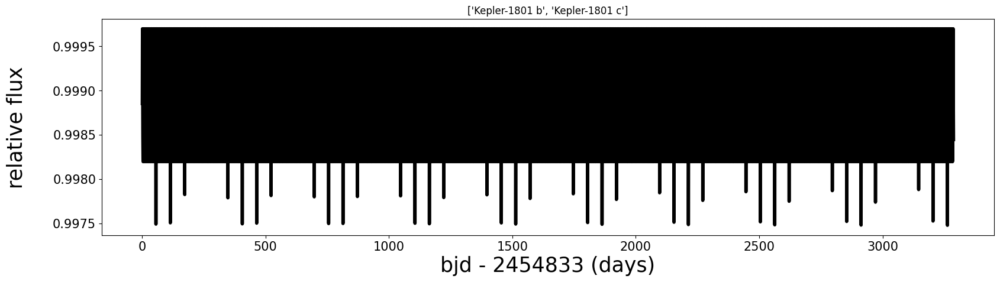

<Figure size 640x480 with 0 Axes>

In [ ]:
# Define the parameters
t = np.linspace(1, 3287, 330000)

# Create a directory to save figures and text files
output_folder = "output_data"
os.makedirs(output_folder, exist_ok=True)

for host,planet_name in planet.items():
# # Iterate through the planet data and retrieve parameters
# planet_data = [
#     {"name": "Kepler-51", "items": ["Kepler-51 d", "Kepler-51 b"]}
# ]

# Iterate through planet data
    system = MultiPlanetSystem()
    # Prepare to save printed values into a text file
    output_file_path = os.path.join(output_folder, f"{host}_parameters.txt")
    with open(output_file_path, "w") as text_file:

        for item in planet_name:

            a = find_semi_major_axis("/content/PS_2024.04.25_12.55.45.csv", item)
            if a is None:
                a = None
            else:
                a = float(find_semi_major_axis("/content/PS_2024.04.25_12.55.45.csv", item))*244.99
            # print(a)

            tv = find_transit_time("/content/PS_2024.04.25_12.55.45.csv", item)
            if tv is None:
                tv = None
            else:
                tv = float(find_transit_time("/content/PS_2024.04.25_12.55.45.csv", item)) - 2454833

            e = find_eccentricity("/content/PS_2024.04.25_12.55.45.csv", item)
            if e is None:
                e = None
            else:
                e = float(find_eccentricity("/content/PS_2024.04.25_12.55.45.csv", item))

            p = find_orbital_period("/content/PS_2024.04.25_12.55.45.csv", item)
            if p is None:
                p = None
            else:
                p = float(find_orbital_period("/content/PS_2024.04.25_12.55.45.csv", item))
            # print(p)

            w = find_longitude_periastron("/content/PS_2024.04.25_12.55.45.csv", item)
            if w is None:
                w = None
            else:
                w = float(find_longitude_periastron("/content/PS_2024.04.25_12.55.45.csv", item))

            b = find_impacter_parameter("/content/PS_2024.04.25_12.55.45.csv", item)
            if b is None:
                b = None
            else:
                b = float(find_impacter_parameter("/content/PS_2024.04.25_12.55.45.csv", item))

            r = find_radius_ratio("/content/PS_2024.04.25_12.55.45.csv", item)
            if r is None:
                r = None
            else:
                r = float(find_radius_ratio("/content/PS_2024.04.25_12.55.45.csv", item))
            print(r)

            om = 180 * np.pi / 180

            u1 = 0.6
            u2 = 0.2

            print(a, tv, e, p, w, om, b, u1, u2, r)
            system.add_planet(a, tv, e, p, w, om, b, u1, u2, r)
            # Write the parameters to the text file
            parameters_str = f"{a}, {tv}, {e}, {p}, {w}, {b}, {r}\n"
            text_file.write(parameters_str)

    # Initialize orbits and system
    system.initialize_orbits()
    # print(t)
    # Simulate the light curve
    flux = system.simulate_lightcurve(t)

    # Plot the simulated light curve
    plt.figure(figsize=(17, 5))
    plt.plot(t, flux + 1, color='k', linewidth=4)

    plt.ylabel('relative flux\n', fontsize=25)
    plt.xlabel('bjd - 2454833 (days)', fontsize=25)
    plt.title("%s"%planet_name)
    print("%s"%planet_name)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

    # Save the figure in the output folder
    figure_file_path = os.path.join(output_folder, f"{host}_lightcurve.png")
    plt.savefig(figure_file_path)

    # Show the figure
    plt.show()

# Real DA

<Axes: xlabel='Time - 2454833 [BKJD days]', ylabel='Flux [$\\mathrm{e^{-}\\,s^{-1}}$]'>

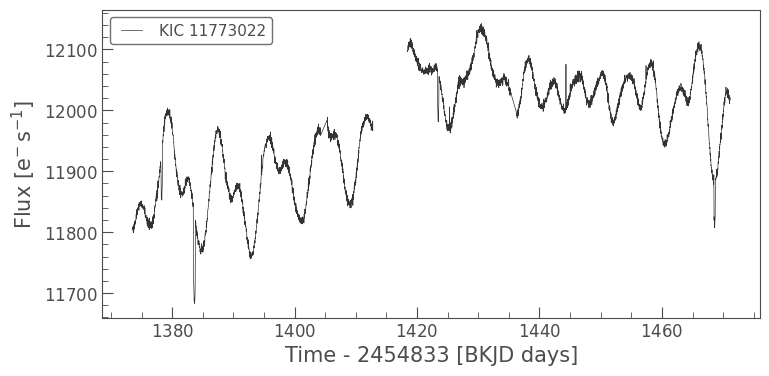

In [ ]:
from lightkurve import search_targetpixelfile

# First we open a Target Pixel File from MAST, this one is already cached from our previous tutorial!
tpf = search_targetpixelfile('Kepler-51', author="Kepler", cadence="long", quarter=15).download()

# Then we convert the target pixel file into a light curve using the pipeline-defined aperture mask.
lc = tpf.to_lightcurve(aperture_mask=tpf.pipeline_mask)

lc.plot()

In [ ]:
len(lc)

4446

<Axes: xlabel='Time - 2454833 [BKJD days]', ylabel='Normalized Flux'>

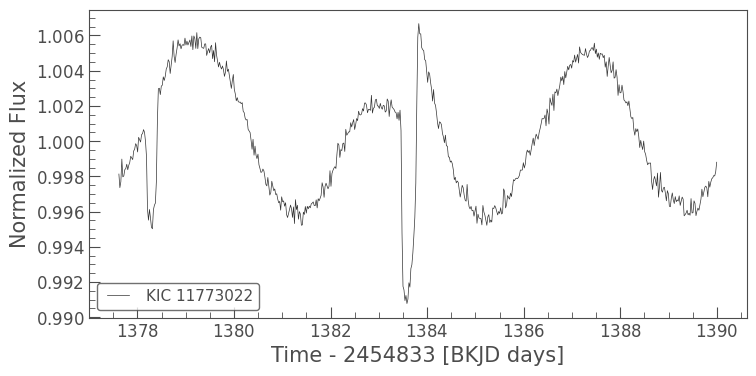

In [ ]:
flat_lc = lc.flatten(window_length=401)
flat_lc[200:800].plot()

Estimated mass of Planet 1: 193142529865462.94 kg
Estimated mass of Planet 2: 94639839634076.83 kg


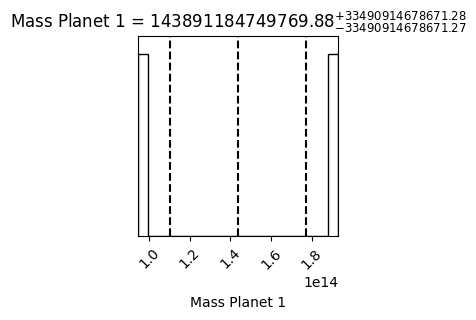

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import corner
from scipy.optimize import minimize

# Function to calculate mass from transit times
def calculate_mass(transit_times_before, transit_times_after, period, G=6.67430e-11):
    # Calculate average transit time before and after mutual transit
    avg_transit_before = np.mean(transit_times_before)
    avg_transit_after = np.mean(transit_times_after)

    # Calculate the difference in transit times
    delta_transit = avg_transit_after - avg_transit_before

    # Calculate the mass using the formula: mass = (4 * pi^2 * semi_major_axis^3) / (G * period^2)
    mass = (4 * np.pi**2 * (period)**3) / (G * delta_transit**2)

    return mass

# Known parameters
semi_major_axis = [100, 50]  # Semi-major axis for both planets (in arbitrary units)
period = 10  # Orbital period (in arbitrary units)
G = 6.67430e-11  # Gravitational constant

# Transit times for both planets before and after mutual transit
transit_times_before = [[10.2, 9.8, 10.1, 10.0], [9.5, 9.7, 9.6, 9.8]]  # Transit durations before mutual transit for both planets
transit_times_after = [[11.5, 12.0, 11.7, 11.9], [12.2, 12.1, 12.3, 12.0]]  # Transit durations after mutual transit for both planets

# Calculate masses for both planets
planet_masses = []
for i in range(len(semi_major_axis)):
    mass = calculate_mass(transit_times_before[i], transit_times_after[i], period, G)
    planet_masses.append(mass)

# Print estimated masses
for i, mass in enumerate(planet_masses):
    print(f"Estimated mass of Planet {i+1}: {mass:.2f} kg")

# Convert the list of masses to a NumPy array and transpose it
planet_masses_array = np.array([planet_masses]).T

# Plot the posterior distribution
labels = [f"Mass Planet {i+1}" for i in range(len(planet_masses))]
fig = corner.corner(planet_masses_array, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import corner
from scipy.optimize import minimize

# Define function to calculate mass based on transit duration variations
def calculate_mass(transit_durations_before, transit_durations_after):
    # Calculate the difference in transit durations before and after mutual transit
    delta_transit_durations = [np.mean(after) - np.mean(before) for before, after in zip(transit_durations_before, transit_durations_after)]

    # Define other known parameters (semi-major axis, orbital period, etc.)
    semi_major_axis_planet1 = 0.5  # Example value for semi-major axis of planet 1
    semi_major_axis_planet2 = 0.8  # Example value for semi-major axis of planet 2
    orbital_period_planet1 = 10.0  # Example value for orbital period of planet 1
    orbital_period_planet2 = 15.0  # Example value for orbital period of planet 2

    # Calculate mass of each planet based on transit duration variations
    mass_planet1 = semi_major_axis_planet1 ** 3 / (orbital_period_planet1 ** 2) * np.array(delta_transit_durations[0]) ** 3
    mass_planet2 = semi_major_axis_planet2 ** 3 / (orbital_period_planet2 ** 2) * np.array(delta_transit_durations[1]) ** 3

    return mass_planet1, mass_planet2

# Example data (transit durations before and after mutual transit for both planets)
transit_durations_before = [[10.2, 9.8, 10.1, 10.0], [9.5, 9.7, 9.6, 9.8]]  # Transit durations before mutual transit for both planets
transit_durations_after = [[11.5, 12.0, 11.7, 11.9], [12.2, 12.1, 12.3, 12.0]]  # Transit durations after mutual transit for both planets

# Calculate masses of both planets based on transit duration variations
mass_planet1, mass_planet2 = calculate_mass(transit_durations_before, transit_durations_after)

# Print the calculated masses
print("Estimated mass of Planet 1:", mass_planet1)
print("Estimated mass of Planet 2:", mass_planet2)

Estimated mass of Planet 1: 0.00669921875
Estimated mass of Planet 2: 0.03555555555555557


100%|██████████| 1000/1000 [00:02<00:00, 341.80it/s]


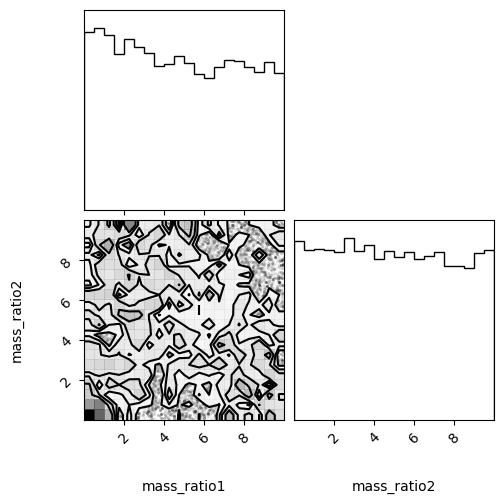

In [ ]:
import emcee
import corner

# Define the log prior function for the sampling
def log_prior(theta):
    # Unpack the parameters
    mass_ratio1, mass_ratio2 = theta

    # Define prior ranges for mass ratios
    mass_ratio_range = (0, 10)  # Example range for mass ratio

    # Check if mass ratios are within the prior ranges
    if not all([mass_ratio_range[0] < mass_ratio1 < mass_ratio_range[1], mass_ratio_range[0] < mass_ratio2 < mass_ratio_range[1]]):
        return -np.inf  # Return negative infinity for parameters outside prior ranges

    return 0  # Return zero for parameters within prior ranges

# Define the log likelihood function for the sampling
def log_likelihood(theta, transit_durations_before, transit_durations_after):
    # Unpack the parameters
    mass_ratio1, mass_ratio2 = theta

    # Calculate the transit duration variations based on small variations in mass ratios
    tdvs = [[tdv + 0.01 * np.sqrt(mass_ratio1) for tdv in planet_before] for planet_before in transit_durations_before] + [[tdv + 0.01 * np.sqrt(mass_ratio2) for tdv in planet_after] for planet_after in transit_durations_after]

    # Calculate log likelihood based on transit duration variations
    # You need to define this function according to your specific model
    log_likelihood_value = 0  # Placeholder for log likelihood value

    return log_likelihood_value

# Define the log posterior function for the sampling
def log_posterior(theta, transit_durations_before, transit_durations_after):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf  # Return negative infinity if parameters are outside prior ranges
    return lp + log_likelihood(theta, transit_durations_before, transit_durations_after)  # Compute log posterior as sum of log prior and log likelihood

# Set up the MCMC sampler
ndim = 2  # Dimensionality of parameter space
nwalkers = 32  # Number of walkers
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=(transit_durations_before, transit_durations_after))

# Set up initial positions for walkers
initial_positions = np.random.rand(nwalkers, ndim)

# Run the sampler
sampler.run_mcmc(initial_positions, 1000, progress=True)

# Plot the posterior using corner
samples = sampler.get_chain(flat=True)
labels = ['mass_ratio1', 'mass_ratio2']
corner.corner(samples, labels=labels)

plt.show()